# Explainability-Guided Detection and Mitigation of Shortcut Learning in Machine Learning Models

| Field | Details |
|---|---|
| Course | CS-471 Machine Learning |
| Institution | NUST SEECS, BESE-14B |
| Authors | Shamaiem Shabbir (460642) . Maryam Sheraz (466050)  |
| XAI Methods | **GradCAM++** · **SHAP** · **LIME** (simple GradCAM removed) |
| Datasets | **Colored MNIST** · **Waterbirds** (HuggingFace) |
| Papers | Pahde et al. (2025) · Le et al. (2025) · Ye et al. (2024) |



## ⚠️ CORRECTIONS APPLIED IN THIS VERSION

This notebook was audited against the paper's reported numbers and found to contain
methodological confounds that make several results (especially RRR and the Waterbirds
group-level numbers) not directly comparable to the ERM baseline. The following fixes
were applied. **Outputs have been cleared** — this notebook has not been re-executed
(no GPU / no access to torchvision-MNIST or HuggingFace from this environment), so it
must be re-run end-to-end on Kaggle/Colab (internet + GPU on) to regenerate real numbers.

1. **RRR training-set-size confound (MNIST + Waterbirds).** The previous version trained
   the RRR model from random init on only a small mask-covered subset (2,000/60,000 MNIST
   images; 500/4,795 Waterbirds images), while the ERM baseline trains on the full set.
   Any accuracy difference was therefore confounded by "much less training data," not just
   the RRR penalty — this is very likely why RRR appeared to "collapse" (21.6% biased
   accuracy on MNIST) rather than mildly underperform as the paper reports. **Fix:**
   GradCAM++ background masks are now precomputed for the *entire* training set used by
   ERM, and RRR trains on that same full set for the same number of epochs, so RRR and
   ERM are trained on identically-sized data — isolating the effect of the RRR penalty
   itself.

2. **Inconsistent RRR loss formulation between datasets.** MNIST's `RRRLoss` normalized
   the squared input-gradient by its batch mean before applying the background mask;
   the Waterbirds RRR cell used a different, un-normalized `grads.abs() * mask` penalty.
   **Fix:** both datasets now use the same normalized-squared-gradient penalty, so RRR
   means the same thing on both benchmarks.

3. **FG/BG XCS-IoU decomposition re-ran Otsu on a zeroed-out map.** `region_xcs_iou`
   previously multiplied the attribution map by the region mask (zeroing everything
   outside it) and *then* ran Otsu's threshold on that mostly-zero image, which biases
   the threshold toward separating "zero" from "any nonzero" rather than reflecting the
   map's structure within the region. **Fix:** the map is binarized once, globally, and
   the region mask is applied to the binary result — foreground/background IoU is now
   computed by intersecting the *same* global attribution mask with each region, instead
   of re-thresholding a masked image.

4. **Waterbirds DFR mixed validation-split images into the "training" mixture.** The
   balanced biased/conflict pool was drawn from `wb_train_ds` **and** `wb_val_ds`
   combined. **Fix:** the pool is now drawn from the training split only, matching the
   paper's Sec. III-E-2 description ("retrains the head on a balanced dataset") and
   avoiding validation-data leakage into the head-retraining step.

6. **Table VI's own binarization-sensitivity cell had the same Otsu-on-zeroed-map
   bias** as fix #3 above, in its separate `_bin()` helper (it wasn't reusing
   `region_xcs_iou`). **Fix:** its 'otsu' branch now also binarizes the raw,
   unmasked map globally before restricting to the region, matching fix #3.

5. **Added explicit training-set-size parity assertions** after RRR training on both
   datasets, so if a future edit reintroduces a subset-only mask/training mismatch, the
   notebook will print a loud warning instead of silently producing biased numbers.

Everything else (CNN/ResNet-18 architectures, DFR's own methodology, the classical
baselines, the XCS-IoU/cosine metric definitions, hyperparameter tuning, multi-seed
validation) was left unchanged — those matched the paper closely and showed no evidence
of a comparable confound.


##  DETAILED PIPELINE OVERVIEW

### **PHASE 1: Data Preparation & Spurious Injection**
- **Step 1.1**: Load original datasets (MNIST, Waterbirds)
- **Step 1.2**: Create group metadata (spurious attributes)
  - MNIST: Color backgrounds (Red for digits 0–4, Green for 5–9)
  - Waterbirds: Scene background (water vs. land) vs. bird identity
- **Step 1.3**: Generate three test sets per dataset:
  - **Biased**: Aligned spurious-label correlation (model learns shortcuts)
  - **Conflict**: Flipped spurious attribute (worst-group accuracy)
  - **Clean**: No spurious attribute (ideal performance)

> This notebook implements the two datasets evaluated in the paper (Table I):
> Colored MNIST and Waterbirds. ISIC is discussed only as related literature
> (Pahde et al.) and future work in the paper — it is **not** one of the two
> evaluated benchmarks and is not implemented here.

### **PHASE 2: Model Training (Pre-Mitigation Baseline)**
- **Step 2.1**: Train CNN (MNIST) / ResNet-18 (Waterbirds) on biased training data (ERM)
  - Optimization: Adam, OneCycleLR
  - Epochs: 3 for Colored MNIST, 5 for Waterbirds (paper Sec. III-B, fixed regardless of environment)
  - Loss: CrossEntropyLoss
- **Step 2.2**: Train classical baselines (Logistic Regression, Random Forest, XGBoost)
  - For comparison of DNN vs traditional ML on shortcut learning
- **Step 2.3**: Evaluate all models on 3 test splits → compute Accuracy & GAP (worst-group robustness)

### **PHASE 3: XAI Attribution (Pre-Mitigation)**
- **Step 3.1**: Generate 3 attribution maps for 100 held-out test images (50 biased + 50 conflict, paper Sec. III-C):
  - **GradCAM++**: Gradient-weighted importance
  - **SHAP**: Game-theoretic feature importance (10 background references)
  - **LIME**: Local interpretable surrogates (100 perturbed samples)
- **Step 3.2**: Compute XCS Consensus Metrics:
  - **XCS-IoU**: Mean pairwise Intersection-over-Union between Otsu-binarised maps
  - **XCS-cos**: Mean pairwise cosine similarity (raw maps)
  - **Region decomposition**: Foreground vs Background agreement (ground-truth regions where available)
- **Step 3.3**: Store baseline XAI statistics (μ, σ) for later comparison

### **PHASE 4: Mitigation Strategy 1 — RRR (Right-for-Right-Reasons)**
- **Step 4.1**: Compute GradCAM++ background masks on 2,000–4,000 training samples
  (`N_MASK_RRR`, environment-dependent; paper Sec. III-E-1)
- **Step 4.2**: Train new CNN, from random initialization, with an RRR loss on exactly
  that masked subset (so every training example actually used has a real background
  mask — no silently-zero, unregularized examples):
  - Penalise input-gradient magnitude in background regions
  - Loss = CE + λ × mean(∇(CE)² · background_mask), λ = 1.0
- **Step 4.3**: Evaluate mitigated model on 3 test splits
- **Step 4.4**: Re-compute XAI & XCS metrics for post-RRR comparison

### **PHASE 5: Mitigation Strategy 2 — DFR (Dataset Factorization w/ Reweighting)**
- **Step 5.1**: Freeze base CNN/ResNet-18 feature extractor (conv layers)
- **Step 5.2**: Train only the classifier head on a mixed dataset:
  - 50% biased (majority-group) examples
  - 50% conflict (minority-group) examples
  - Built from **training-set** images only — never from the held-out test set
- **Step 5.3**: Evaluate on 3 test splits
- **Step 5.4**: Re-compute XAI & XCS metrics for post-DFR comparison

### **PHASE 6: Post-Mitigation Analysis & Comparison**
- **Step 6.1**: Generate comparison figures (Pre vs RRR vs DFR)
- **Step 6.2**: Run paired t-tests (+ Cohen's d, Bonferroni-corrected α) on XCS metrics
- **Step 6.3**: Create comprehensive performance tables:
  - Accuracy across all models & test splits
  - XCS-IoU/cos statistics (mean ± std)
  - Statistical significance (p-values, effect sizes)
- **Step 6.4**: Report background attribution reduction (spurious mitigation confirmation)

### **PHASE 7: Dataset 2 Repetition**
- Repeat PHASES 1–6 for **Waterbirds**, plus group-level (G0–G3) analysis and
  classical baselines trained on frozen ResNet-18 features (paper Table VIII/IX)
- Collect all results for a unified IEEE comparison table


In [1]:
# ============================================================
# CELL 0 — ENVIRONMENT SETUP + OPTIMIZATION FLAGS
# [MODIFIED FOR KAGGLE] Originally Colab-only. Adds Kaggle detection
# alongside Colab/local, since Kaggle kernels have the same kind of
# session-time/GPU-quota constraints that motivated the "reduced compute"
# fast-mode settings below — so Kaggle now gets the same fast-mode
# treatment Colab did, rather than silently falling through to the slow
# "local" defaults (which could blow past Kaggle's session time limit).
# ============================================================
import os
import sys
import platform
import psutil

# Detect environment
IS_COLAB  = 'google.colab' in sys.modules
IS_KAGGLE = (
    os.environ.get('KAGGLE_KERNEL_RUN_TYPE') is not None
    or 'KAGGLE_URL_BASE' in os.environ
    or os.path.exists('/kaggle')
)
IS_WINDOWS = platform.system() == 'Windows'

_env_name = 'Kaggle' if IS_KAGGLE else ('Google Colab' if IS_COLAB else 'Local/Laptop')
print(f"🖥️  Environment: {_env_name}")
print(f"📍 OS: {platform.system()}")
print(f"🐍 Python: {sys.version.split()[0]}")

if IS_KAGGLE:
    print("\n⚠️  KAGGLE REMINDER: this notebook downloads MNIST via torchvision and")
    print("   Waterbirds via HuggingFace `datasets` — both need internet access.")
    print("   In the Kaggle editor: Settings (right sidebar) → Internet → ON.")
    print("   Without it, dataset downloads below will fail with a connection error.")
    gpu_count = 0
    try:
        import torch as _torch_probe
        gpu_count = _torch_probe.cuda.device_count()
    except Exception:
        pass
    print(f"   GPU(s) visible: {gpu_count} — this notebook only uses cuda:0; a second "
          f"Kaggle GPU (T4 x2) will sit idle, which is fine, just not used.")

# ═══════════════════════════════════════════════════════════════
# 🚀 OPTIMIZATION FLAGS — Reduce memory/runtime on constrained hosts
# ═══════════════════════════════════════════════════════════════
# [MODIFIED] COLAB_MODE now really means "constrained hosted-notebook
# fast mode" and triggers on Kaggle too, not just Colab.
COLAB_MODE = IS_COLAB or IS_KAGGLE  # Set True for Colab/Kaggle, False for local/laptop
REDUCE_LIME_SAMPLES = 50 if COLAB_MODE else 100   # ⬇️ 300→50 (LIME is slowest)
REDUCE_SHAP_BG = 5 if COLAB_MODE else 10          # ⬇️ 20→5 (SHAP background)
REDUCE_EVAL_SAMPLES = 50 if COLAB_MODE else 100   # ⬇️ 250→50 (images evaluated)
SKIP_CLASSICAL_MODELS = COLAB_MODE                 # Skip LogReg/RF/XGBoost
REDUCE_EPOCHS = 3 if COLAB_MODE else 5             # ⬇️ 5→3 epochs (used only for non-headline/speed knobs below)

# [FIXED] The paper (Sec III-B) states FIXED epoch counts, not environment-
# dependent ones: "3 epochs" for Colored MNIST, "5 epochs" for Waterbirds.
# Previously MNIST training ignored REDUCE_EPOCHS entirely and always ran 5
# epochs hardcoded (never 3, regardless of environment), while Waterbirds
# used REDUCE_EPOCHS and so only actually matched the paper's "5 epochs"
# claim when COLAB_MODE=False. Neither path reproduced the paper's stated
# "3/5" combination. These two constants are now the single source of
# truth for training length and are used by every MNIST/Waterbirds
# training cell instead of a hardcoded number or REDUCE_EPOCHS.
MNIST_EPOCHS = 3   # Sec III-B: "using the Adam optimizer with OneCycleLR scheduling for 3 epochs"
WB_EPOCHS    = 5   # Sec III-B: "we fine-tune a pretrained ResNet-18 for 5 epochs"
IMG_SIZE_WATERBIRDS = 160 if COLAB_MODE else 224   # ⬇️ 224→160 (faster ResNet).
# [FIXED] This flag used to be defined but never threaded into the Waterbirds
# loading cell (which hardcoded 224 regardless of environment). It is now the
# single source of truth for Waterbirds image resolution — see the loading cell.
# [REMOVED] IMG_SIZE_ISIC — the ISIC dataset is not implemented anywhere in this
# notebook (the paper evaluates only Colored MNIST and Waterbirds, per Table I).
# The dead flag was removed rather than left as misleading unused config.
ENABLE_MIXED_PRECISION = COLAB_MODE                # AMP: half precision
N_MASK_RRR = 2000 if COLAB_MODE else 4000          # ⬇️ 4000→2000 (mask computation)

print(f"\n⚙️  COLAB_MODE={COLAB_MODE}  (env={_env_name})")
print(f"   LIME samples    : {REDUCE_LIME_SAMPLES}")
print(f"   SHAP bg samples : {REDUCE_SHAP_BG}")
print(f"   Eval images     : {REDUCE_EVAL_SAMPLES}")
print(f"   Skip classical  : {SKIP_CLASSICAL_MODELS}")
print(f"   Epochs (train)  : MNIST={MNIST_EPOCHS}, Waterbirds={WB_EPOCHS} (fixed, per paper Sec III-B)")
print(f"   ResNet img size : {IMG_SIZE_WATERBIRDS}×{IMG_SIZE_WATERBIRDS}")
print(f"   Mixed precision : {ENABLE_MIXED_PRECISION}\n")

# Create results directory
# [FIXED] Kaggle's persistent, commit-visible output directory is
# /kaggle/working — /tmp or a bare relative path either isn't kept after
# the session ends or (for the relative path) works but wasn't explicit
# about where Kaggle actually expects outputs to live.
if IS_KAGGLE:
    RESULTS_DIR = "/kaggle/working/concord_results"
elif IS_COLAB:
    RESULTS_DIR = "/tmp/concord_results"
else:
    RESULTS_DIR = "./concord_results"
os.makedirs(RESULTS_DIR, exist_ok=True)
print(f"📁 Results directory: {RESULTS_DIR}")
print(f"   Note: figures in this notebook currently save via bare filenames "
      f"(e.g. 'fig6_wb_xai_comparison.png'), which land in the notebook's "
      f"working directory — on Kaggle that's already /kaggle/working, so "
      f"they'll be preserved as commit output automatically.")

# Memory monitoring
def get_memory_usage():
    if IS_COLAB:
        try:
            from google.colab import runtime
            return psutil.virtual_memory()
        except:
            pass
    return psutil.virtual_memory()  # also covers Kaggle/local — psutil works the same there

print(f"💾 Current memory: {get_memory_usage().percent:.1f}% ({get_memory_usage().used//1e9:.1f}GB/{get_memory_usage().total//1e9:.1f}GB)")

# Optional: Mount Google Drive for Colab (Colab-only; no Kaggle equivalent
# needed since /kaggle/working is already persistent for the session and
# saved on commit, and /kaggle/input is where Kaggle-attached datasets live).
if IS_COLAB:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
        print("✅ Google Drive mounted")
    except Exception as e:
        print(f"⚠️  Drive mount failed (optional): {e}")

# Memory optimization for Colab/Kaggle
if IS_COLAB or IS_KAGGLE:
    import gc
    gc.enable()
    print("✅ Memory optimization enabled")

# Mixed precision training setup
if ENABLE_MIXED_PRECISION:
    from torch.cuda.amp import autocast, GradScaler
    scaler = GradScaler()
    print("✅ Mixed precision (AMP) enabled for faster training")
else:
    autocast = lambda: __import__('contextlib').nullcontext()
    scaler = None

print("✅ Environment setup complete\n")

🖥️  Environment: Kaggle
📍 OS: Linux
🐍 Python: 3.12.13

⚠️  KAGGLE REMINDER: this notebook downloads MNIST via torchvision and
   Waterbirds via HuggingFace `datasets` — both need internet access.
   In the Kaggle editor: Settings (right sidebar) → Internet → ON.
   Without it, dataset downloads below will fail with a connection error.
   GPU(s) visible: 2 — this notebook only uses cuda:0; a second Kaggle GPU (T4 x2) will sit idle, which is fine, just not used.

⚙️  COLAB_MODE=True  (env=Kaggle)
   LIME samples    : 50
   SHAP bg samples : 5
   Eval images     : 50
   Skip classical  : True
   Epochs (train)  : MNIST=3, Waterbirds=5 (fixed, per paper Sec III-B)
   ResNet img size : 160×160
   Mixed precision : True

📁 Results directory: /kaggle/working/concord_results
   Note: figures in this notebook currently save via bare filenames (e.g. 'fig6_wb_xai_comparison.png'), which land in the notebook's working directory — on Kaggle that's already /kaggle/working, so they'll be preserved as

/tmp/ipykernel_22/928250758.py:135: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [2]:
# ============================================================
# CELL 0B — GLOBAL STYLE & COLOR SCHEME
# [FIXED] This cell used to define C_PRE/C_RRR/C_DFR and a matplotlib
# style that were SILENTLY OVERWRITTEN by Cell "CELL 2 — IMPORTS AND
# GLOBAL SEEDS" below (which runs later and defines its own conflicting
# color hex values + rcParams). Every downstream figure only ever used
# Cell 2's colors, so this cell's original definitions were 100% dead
# code — confusing for anyone reading the notebook top-to-bottom. The
# canonical, single-source-of-truth color scheme and IEEE matplotlib
# style now live ONLY in Cell 2 ("CELL 2 — IMPORTS AND GLOBAL SEEDS").
# This cell is kept as a placeholder (rather than deleted) so cell
# numbering/order in this notebook stays stable.
# ============================================================
print("ℹ️  Color scheme & matplotlib style are defined once, canonically, "
      "in Cell 'CELL 2 — IMPORTS AND GLOBAL SEEDS' below (not here).")


ℹ️  Color scheme & matplotlib style are defined once, canonically, in Cell 'CELL 2 — IMPORTS AND GLOBAL SEEDS' below (not here).


**Summary:** Pipeline quick reference & checklist (optimized for colab).


In [3]:
# ============================================================
# PIPELINE QUICK REFERENCE & CHECKLIST (OPTIMIZED FOR COLAB)
# ============================================================
import pandas as pd

pipeline_checklist = pd.DataFrame({
    'Phase': [
        'Phase 1', 'Phase 1', 'Phase 1',
        'Phase 2', 'Phase 2', 'Phase 2',
        'Phase 3', 'Phase 3', 'Phase 3',
        'Phase 4', 'Phase 4', 'Phase 4',
        'Phase 5', 'Phase 5', 'Phase 5',
        'Phase 6', 'Phase 6', 'Phase 6',
    ],
    'Step': [
        '1.1', '1.2', '1.3',
        '2.1', '2.2', '2.3',
        '3.1', '3.2', '3.3',
        '4.1', '4.2', '4.3',
        '5.1', '5.2', '5.3',
        '6.1', '6.2', '6.3'
    ],
    'Task': [
        'Load original dataset (MNIST/Waterbirds/ISIC)',
        'Create spurious attributes (color/background)',
        'Generate 3 test splits (Biased/Conflict/Clean)',
        f'Train CNN (MNIST_EPOCHS={MNIST_EPOCHS}) / ResNet-18 (WB_EPOCHS={WB_EPOCHS})',
        f'Train classical models (skip if COLAB_MODE={SKIP_CLASSICAL_MODELS})',
        'Evaluate all models → Accuracy & GAP',
        f'Generate GradCAM++, SHAP (↓{REDUCE_SHAP_BG}), LIME (↓{REDUCE_LIME_SAMPLES})',
        'Compute XCS Consensus Metrics',
        'Store baseline XAI statistics',
        f'Compute XAI masks on {N_MASK_RRR} training samples',
        f'Train mitigated CNN (MNIST_EPOCHS={MNIST_EPOCHS} epochs)',
        'Evaluate & compute post-mitigation XAI',
        'Freeze feature extractor',
        'Train classifier on factorized data',
        'Evaluate & compute post-DFR XAI',
        'Generate comparison visualizations',
        'Run paired t-tests on metrics',
        'Create performance tables'
    ],
    'Output': [
        'X_train, X_test (3 splits)',
        'Biased/Conflict/Clean versions',
        '10K samples × 3 splits',
        'cnn_model (weights)',
        'lr_clf, rf_clf, xgb_clf (skipped)',
        'Acc(AVG, WGA, Clean), GAP',
        f'3 maps per image (N={REDUCE_EVAL_SAMPLES})',
        'XCS-IoU, XCS-cos (μ, σ)',
        'xcs_iou_all, xcs_iou_bg_all, etc.',
        f'rrr_bg_masks ({N_MASK_RRR} masked training samples)',
        'cnn_mitigated (weights)',
        'Post-RRR XCS metrics',
        'cnn_dfr (trained head)',
        'Mixed train set',
        'Post-DFR XCS metrics',
        'Figures 2, 3 (PNG)',
        'p-values for significance',
        'CSV/DataFrame tables'
    ],
    'Approx Time': [
        '~1m', '~1m', 'instant',
        f'~2m',
        f'⏭️  SKIPPED' if SKIP_CLASSICAL_MODELS else '~2m',
        '~1m',
        f'~8m (was 15m, LIME↓)',
        'instant', 'instant',
        f'~2m (was 5m)',
        f'~2m',
        f'~10m',
        'instant',
        f'~1m (was 2m)',
        f'~8m (was 15m)',
        '~1m', 'instant', 'instant'
    ],
    'Status': ['✅'] * 18
})

print("\n" + "="*200)
print("PIPELINE EXECUTION CHECKLIST — CONCORD-XAI (OPTIMIZED FOR COLAB)")
print("="*200)
print(pipeline_checklist.to_string(index=False))
print("="*200)
if COLAB_MODE:
    print(f"⏱️  Estimated runtime (Colab T4): ~35-40 min (was ~90 min)")
    print("   Key optimizations: LIME↓, SHAP↓, eval samples↓, epochs↓, skip classical models")
else:
    print(f"⏱️  Estimated runtime (Laptop): ~50-60 min")
print("="*200)


PIPELINE EXECUTION CHECKLIST — CONCORD-XAI (OPTIMIZED FOR COLAB)
  Phase Step                                                 Task                                      Output          Approx Time Status
Phase 1  1.1        Load original dataset (MNIST/Waterbirds/ISIC)                  X_train, X_test (3 splits)                  ~1m      ✅
Phase 1  1.2        Create spurious attributes (color/background)              Biased/Conflict/Clean versions                  ~1m      ✅
Phase 1  1.3       Generate 3 test splits (Biased/Conflict/Clean)                      10K samples × 3 splits              instant      ✅
Phase 2  2.1 Train CNN (MNIST_EPOCHS=3) / ResNet-18 (WB_EPOCHS=5)                         cnn_model (weights)                  ~2m      ✅
Phase 2  2.2     Train classical models (skip if COLAB_MODE=True)           lr_clf, rf_clf, xgb_clf (skipped)          ⏭️  SKIPPED      ✅
Phase 2  2.3                 Evaluate all models → Accuracy & GAP                   Acc(AVG, WGA, Clean), 

**Summary:** Dataset characteristics comparison table.


In [4]:
# ============================================================
# DATASET CHARACTERISTICS COMPARISON TABLE
# [FIXED] Removed the "ISIC Skin Lesion" row: ISIC is cited in the paper only
# as related work (Pahde et al.) and is not one of the two evaluated
# benchmarks in Table I — it was never implemented anywhere in this notebook,
# so listing it here as a framework dataset was misleading. Waterbirds size
# corrected to match the paper's Table I (4.7K train / 5.8K test) instead of
# a rough guess.
# ============================================================

datasets_table = pd.DataFrame({
    'Dataset': ['Colored MNIST', 'Waterbirds'],
    'Size (Train/Test)': ['60K / 10K', '4.7K / 5.8K'],
    'Image Dims': ['28×28×3', '224×224×3'],
    'Classes': ['10 digits', '2 (waterbird / landbird)'],
    'Spurious Attribute': ['Background color (Red/Green)', 'Scene background (water/land)'],
    'Label-Spurious Correlation': [
        'Digits 0-4 → Red | 5-9 → Green',
        'Waterbird → water background (majority) | Landbird → land background (majority)'
    ],
    'Worst-Group': ['Opposite color (flipped)', 'Wrong background (waterbird+land, landbird+water)'],
    'Model Type': ['SpuriousCNN (~70K params)', 'ResNet-18 (11.2M params, ImageNet-pretrained)'],
    'Shortcut Severity': ['HIGH (near-perfect color proxy)', 'MODERATE (natural scene correlation)'],
    'Real-World Relevance': [
        'Toy problem → high control',
        'Semi-realistic → birds & scenes'
    ]
})

print("\n" + "="*200)
print("TABLE I: BENCHMARKS USED IN THE CONCORD-XAI PIPELINE")
print("="*200)
print(datasets_table.to_string(index=False))
print("="*200)
print("""
📌 RATIONALE FOR BOTH DATASETS:
  1️⃣  MNIST (Toy): Controlled spurious injection → proof of concept
  2️⃣  Waterbirds (Semi-real): Natural distribution shifts → realistic scenario

""")
print("="*200)



TABLE I: BENCHMARKS USED IN THE CONCORD-XAI PIPELINE
      Dataset Size (Train/Test) Image Dims                  Classes            Spurious Attribute                                                      Label-Spurious Correlation                                       Worst-Group                                    Model Type                    Shortcut Severity            Real-World Relevance
Colored MNIST         60K / 10K    28×28×3                10 digits  Background color (Red/Green)                                                  Digits 0-4 → Red | 5-9 → Green                          Opposite color (flipped)                     SpuriousCNN (~70K params)      HIGH (near-perfect color proxy)      Toy problem → high control
   Waterbirds       4.7K / 5.8K  224×224×3 2 (waterbird / landbird) Scene background (water/land) Waterbird → water background (majority) | Landbird → land background (majority) Wrong background (waterbird+land, landbird+water) ResNet-18 (11.2M params, ImageNe

**Summary:** Evaluation metrics glossary & interpretation guide.


In [5]:
# ============================================================
# EVALUATION METRICS GLOSSARY & INTERPRETATION GUIDE
# ============================================================

metrics_glossary = pd.DataFrame({
    'Metric': [
        'AVG (Biased Acc)',
        'WGA (Conflict Acc)',
        'GAP (AVG - WGA)',
        'Clean Acc',
        'XCS-IoU',
        'XCS-cos',
        'Region FG IoU',
        'Region BG IoU',
        'p-value'
    ],
    'Definition': [
        'Accuracy on biased test set',
        'Accuracy on conflict (flipped) test set',
        'Robustness gap (avg - worst-group)',
        'Accuracy on clean (spurious-free) test',
        'Mean pairwise IoU of binarised maps',
        'Mean pairwise cosine similarity',
        'Consensus IoU in foreground region',
        'Consensus IoU in background region',
        'Statistical significance (paired t-test)'
    ],
    'Range': ['0-100%', '0-100%', '0-100pp', '0-100%', '[0,1]', '[-1,1]', '[0,1]', '[0,1]', '[0,1]'],
    'Good Value': ['High', 'High', 'Low (<10pp)', 'High & close to AVG', 'High (>0.4)', 'High (>0.3)', 'High', 'Low', '<0.05'],
    'Interpretation': [
        'Model performs well on aligned data',
        'Model performance on adversarial test',
        'How much model relies on spurious feature',
        'True generalization ability',
        'All 3 XAI methods agree',
        'Raw attribution pattern similarity',
        'Methods focus on true object',
        '⚠️ HIGH→shortcut used | LOW→better',
        '✅ Significant difference if <0.05'
    ],
    'Pre-Mitigation': ['High', 'Low', 'High ⚠️', 'Medium', 'Med', 'Low', 'Med', 'High ⚠️', 'N/A'],
    'Post-Mitigation': ['Med-High', 'Increased ✅', 'Reduced ✅', 'Stable/↑', '↑', '↑', 'Stable/↑', 'Reduced ✅', '< 0.05'],
})

print("\n" + "="*220)
print("TABLE: EVALUATION METRICS REFERENCE GUIDE")
print("="*220)
print(metrics_glossary.to_string(index=False))
print("="*220)
print("""
🎯 EXPECTED BEHAVIOR:

  PRE-MITIGATION (Shortcut Learning Model):
    ✓ Biased ACC ≈ 95%+ (learns to use color)
    ✓ Conflict ACC ≈ 20-30% (color opposite → fails)
    ✓ GAP ≈ 60-70pp (strong shortcut dependency)
    ✓ XCS-IoU BG ≈ 0.6+ (all methods find colors)

  POST-MITIGATION (Robust Model):
    ✓ Biased ACC ≈ 85-90% (slight drop, OK)
    ✓ Conflict ACC ≈ 80%+ (robust to flip)
    ✓ GAP ≈ 5-10pp (reduced reliance)
    ✓ XCS-IoU BG ≈ 0.2-0.4 (spurious features ignored)
    ✓ XCS-IoU FG ≈ stable or ↑ (focus on object)
""")
print("="*220)


TABLE: EVALUATION METRICS REFERENCE GUIDE
            Metric                               Definition   Range          Good Value                            Interpretation Pre-Mitigation Post-Mitigation
  AVG (Biased Acc)              Accuracy on biased test set  0-100%                High       Model performs well on aligned data           High        Med-High
WGA (Conflict Acc)  Accuracy on conflict (flipped) test set  0-100%                High     Model performance on adversarial test            Low     Increased ✅
   GAP (AVG - WGA)       Robustness gap (avg - worst-group) 0-100pp         Low (<10pp) How much model relies on spurious feature        High ⚠️       Reduced ✅
         Clean Acc   Accuracy on clean (spurious-free) test  0-100% High & close to AVG               True generalization ability         Medium        Stable/↑
           XCS-IoU      Mean pairwise IoU of binarised maps   [0,1]         High (>0.4)                   All 3 XAI methods agree            Med        

**Summary:** Install dependencies.


In [6]:
# ============================================================
# CELL 1 — INSTALL DEPENDENCIES
# [FIXED FOR KAGGLE/COLAB] The old version unconditionally ran
# `pip install torch torchvision ...` on every environment, including
# Colab and (now) Kaggle. Both ship a specific torch/torchvision build
# pre-linked against their preinstalled CUDA driver; a bare `pip install
# torch torchvision` can silently replace that with a mismatched or
# CPU-only PyPI wheel, breaking GPU acceleration for the rest of the
# notebook with no obvious error (training would just work but run 10-50x
# slower on CPU). This now only installs torch/torchvision if they aren't
# importable at all (i.e. genuinely missing, e.g. a bare local machine),
# and otherwise leaves the host's own GPU-matched build alone. Every other
# package is still installed/skipped based on whether it's already
# importable, so reruns are fast and idempotent.
# ============================================================
import importlib

def _is_importable(mod_name):
    try:
        importlib.import_module(mod_name)
        return True
    except Exception:
        return False

# (pip package name, import name) — only used for the "extra" packages;
# torch/torchvision are handled separately below since they need the
# GPU-build-safety check.
_extra_pkgs = [
    ("shap", "shap"),
    ("lime", "lime"),
    ("scikit-learn", "sklearn"),
    ("xgboost", "xgboost"),
    ("matplotlib", "matplotlib"),
    ("numpy", "numpy"),
    ("opencv-python-headless", "cv2"),
    ("grad-cam", "pytorch_grad_cam"),
    ("scipy", "scipy"),
    ("pandas", "pandas"),
    ("Pillow", "PIL"),
    ("datasets", "datasets"),
    ("kagglehub", "kagglehub"),
    ("gdown", "gdown"),
]

to_install = [pip_name for pip_name, import_name in _extra_pkgs if not _is_importable(import_name)]

torch_ok = _is_importable("torch")
if not torch_ok:
    print("⚠  torch not found at all — installing torch + torchvision (no preexisting "
          "GPU build to protect on this environment).")
    to_install = ["torch", "torchvision"] + to_install
else:
    try:
        import torch as _torch_check
        _cuda_note = "CUDA available" if _torch_check.cuda.is_available() else "CPU only"
        print(f"✅  torch already present (v{_torch_check.__version__}, {_cuda_note}) — "
              f"NOT reinstalling, to avoid overwriting the host's GPU-matched build.")
    except Exception:
        pass

if to_install:
    import subprocess, sys
    print(f"Installing missing packages: {to_install}")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q"] + to_install)
else:
    print("✅  All extra packages already present — nothing to install.")

print("✅  Dependency check complete")

✅  torch already present (v2.10.0+cu128, CUDA available) — NOT reinstalling, to avoid overwriting the host's GPU-matched build.
Installing missing packages: ['grad-cam']
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 1.7 MB/s eta 0:00:00
✅  Dependency check complete


**Summary:** Imports and global seeds.


In [7]:
# ============================================================
# CELL 2 — IMPORTS AND GLOBAL SEEDS
# ============================================================
import warnings, os, copy, io
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from scipy import stats

# ── IEEE matplotlib style ───────────────────────────────────
matplotlib.rcParams.update({
    "font.family":        "serif",
    "font.serif":         ["Times New Roman", "DejaVu Serif"],
    "font.size":          10,
    "axes.labelsize":     10,
    "axes.titlesize":     11,
    "axes.titleweight":   "bold",
    "xtick.labelsize":    9,
    "ytick.labelsize":    9,
    "legend.fontsize":    9,
    "figure.dpi":         150,
    "savefig.dpi":        300,
    "savefig.bbox":       "tight",
    "savefig.format":     "png",
    "axes.spines.top":    False,
    "axes.spines.right":  False,
    "axes.grid":          True,
    "grid.alpha":         0.25,
    "grid.linestyle":     "--",
})

# IEEE colour palette
C_PRE  = "#d62728"   # Red — pre-mitigation
C_RRR  = "#ff7f0e"   # Orange — RRR
C_DFR  = "#1f77b4"   # Blue — DFR
C_FG   = "#2ca02c"   # Green — foreground
C_BG   = "#9467bd"   # Purple — background
C_GRAY = "#7f7f7f"   # Gray — secondary
CMAP_DS = [C_PRE, C_RRR, C_DFR, "#8c564b", "#e377c2", "#17becf"]

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torchvision.datasets import MNIST
from torchvision.transforms import ToTensor
import torchvision.transforms as T
import torchvision.models as models

import cv2
import shap
from lime import lime_image
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_auc_score
)
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

MASTER_SEED = 42
SEEDS       = [42, 123, 256, 512, 1024]
device      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def set_seed(s: int) -> None:
    np.random.seed(s)
    torch.manual_seed(s)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(s)

set_seed(MASTER_SEED)
print(f"✅  Device   : {device}")
print(f"✅  PyTorch  : {torch.__version__}")
print(f"✅  Seeds    : {SEEDS}")


✅  Device   : cuda
✅  PyTorch  : 2.10.0+cu128
✅  Seeds    : [42, 123, 256, 512, 1024]


**Summary:** Shared XAI helper functions.


## Shared XAI + XCS Utilities (Identical for all datasets)

In [8]:
# ============================================================
# CELL 3 — SHARED XAI HELPER FUNCTIONS
# GradCAM++ | SHAP | LIME   — NO simple GradCAM
# ============================================================

def get_gradcampp(model: nn.Module, img_hwc: np.ndarray,
                  target_layer=None) -> np.ndarray:
    """img_hwc: (H,W,3) float32 → (H,W) normalised [0,1]."""
    model.eval()
    if target_layer is None:
        # Auto-detect last conv layer
        if hasattr(model, 'features'):
            target_layer = model.features[-1]
        elif hasattr(model, 'layer4'):
            target_layer = model.layer4[-1]
        else:
            raise ValueError("Cannot auto-detect target layer")

    H, W = img_hwc.shape[:2]
    cam  = GradCAMPlusPlus(model=model, target_layers=[target_layer])
    inp  = torch.tensor(img_hwc.transpose(2, 0, 1)[np.newaxis],
                        dtype=torch.float32).to(device)
    out  = cam(input_tensor=inp, targets=None)[0]
    out  = cv2.resize(out, (W, H))
    return (out / out.max()).astype(np.float32) if out.max() > 0 else out.astype(np.float32)


def get_shap_safe(model: nn.Module, img_hwc: np.ndarray,
                  n_bg: int = 10) -> np.ndarray:
    """SHAP GradientExplainer — returns (H,W) float32.
    [OPTIMIZED] Reduced background samples for Colab."""
    model.eval()
    set_seed(MASTER_SEED)
    H, W = img_hwc.shape[:2]
    inp  = torch.tensor(img_hwc.transpose(2, 0, 1)[np.newaxis],
                        dtype=torch.float32).to(device)
    with torch.no_grad():
        pred_class = model(inp).argmax(1).item()
    # Use reduced background samples in COLAB_MODE
    n_bg_actual = max(2, n_bg // 2 if COLAB_MODE else n_bg)
    bg   = torch.zeros((n_bg_actual, *inp.shape[1:]), dtype=torch.float32).to(device)

    explainer = shap.GradientExplainer(model, bg)
    shap_vals = explainer.shap_values(inp)

    if isinstance(shap_vals, list):
        sv = np.abs(shap_vals[pred_class][0])
    elif hasattr(shap_vals, "shape"):
        sv = np.abs(shap_vals[0])
    else:
        return np.zeros((H, W), dtype=np.float32)

    if sv.ndim == 3:
        sv = sv.mean(axis=0)

    sv = np.array(sv, dtype=np.float32)
    if sv.ndim != 2 or 0 in sv.shape:
        return np.zeros((H, W), dtype=np.float32)

    sv = cv2.resize(sv, (W, H))
    return (sv / sv.max()).astype(np.float32) if sv.max() > 0 else sv


def get_lime_map(model: nn.Module, img_hwc: np.ndarray,
                 n_samples: int = 100,
                 mean: np.ndarray = None, std: np.ndarray = None) -> np.ndarray:
    """LIME superpixel map — returns (H,W) float32.
    [OPTIMIZED] Reduced samples for Colab - faster superpixel computation."""
    model.eval()
    # Apply Colab reduction: 300 → 50, 100 → 50, etc.
    n_samples_actual = max(30, n_samples // 2 if COLAB_MODE else n_samples)
    H, W = img_hwc.shape[:2]

    if mean is not None and std is not None:
        # For normalised images: denorm for LIME display, then renorm for predict
        img_display = np.clip(img_hwc * std + mean, 0, 1)
    else:
        img_display = img_hwc

    def predict_fn(imgs: np.ndarray) -> np.ndarray:
        if mean is not None and std is not None:
            imgs_norm = (imgs - mean) / std
        else:
            imgs_norm = imgs
        t = torch.tensor(imgs_norm.transpose(0, 3, 1, 2).astype(np.float32)).to(device)
        with torch.no_grad():
            return F.softmax(model(t), dim=1).cpu().numpy()

    exp  = lime_image.LimeImageExplainer(random_state=MASTER_SEED)
    expl = exp.explain_instance(
        img_display.astype(np.float64),
        predict_fn, top_labels=1,
        hide_color=0, num_samples=n_samples_actual)  # [OPTIMIZED] Use reduced samples for Colab

    top_label = expl.top_labels[0]
    seg       = expl.segments
    coefs     = dict(expl.local_exp[top_label])
    li_map    = np.zeros((H, W), dtype=np.float32)
    for seg_id, w in coefs.items():
        li_map[seg == seg_id] = max(w, 0.0)

    return (li_map / li_map.max()).astype(np.float32) if li_map.max() > 0 else li_map


print("✅  XAI helpers defined: get_gradcampp · get_shap_safe · get_lime_map")
print("    (GradCAM++ only — simple GradCAM removed)")

✅  XAI helpers defined: get_gradcampp · get_shap_safe · get_lime_map
    (GradCAM++ only — simple GradCAM removed)


**Summary:** XCS metric suite (shared, all datasets).


In [9]:
# ============================================================
# CELL 4 — XCS METRIC SUITE (Shared, all datasets)
#   XCS-IoU  : mean pairwise IoU of Otsu-binarised maps
#   XCS-cos  : mean pairwise cosine similarity
#   Region   : fg / bg decomposition
# [FIXED — region_xcs_iou biased Otsu threshold] The previous version
# computed Otsu's threshold on `map * region_mask` (i.e. on an image that
# is zero everywhere outside the region). Because Otsu picks a threshold
# from the WHOLE image's histogram, and most of that histogram is now hard
# zeros, the threshold gets pulled toward separating "zero" from "any
# nonzero" rather than reflecting the map's actual structure inside the
# region -- this can inflate IoU for small regions. Fixed by binarising
# each attribution map ONCE, globally (same binary mask used for the
# overall XCS-IoU), and then computing region IoU by intersecting that
# fixed global binary mask with the region -- no second, biased Otsu call.
# ============================================================

def _ensure_2d(m: np.ndarray) -> np.ndarray:
    m = np.array(m, dtype=np.float32)
    if m.ndim == 3:
        m = m.mean(axis=0) if m.shape[0] in (1, 3) else m.mean(axis=-1)
    return m

def otsu_binarise(m: np.ndarray) -> np.ndarray:
    m = _ensure_2d(m)
    if m.max() > 0:
        m = m / m.max()
    m8 = (m * 255).astype(np.uint8)
    assert m8.ndim == 2
    _, b = cv2.threshold(m8, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return b.astype(bool)

def iou_binary(a, b) -> float:
    inter = int(np.sum(a & b))
    union = int(np.sum(a | b))
    return inter / union if union > 0 else 0.0

def cosine_sim(a, b) -> float:
    a = a.flatten().astype(np.float64)
    b = b.flatten().astype(np.float64)
    d = np.linalg.norm(a) * np.linalg.norm(b)
    return float(np.dot(a, b) / d) if d > 0 else 0.0

def compute_xcs_iou(gc, sh, li) -> float:
    gc_b, sh_b, li_b = otsu_binarise(gc), otsu_binarise(sh), otsu_binarise(li)
    return float(np.mean([iou_binary(gc_b, sh_b),
                           iou_binary(sh_b, li_b),
                           iou_binary(li_b, gc_b)]))

def compute_xcs_cos(gc, sh, li) -> float:
    return float(np.mean([cosine_sim(gc, sh),
                           cosine_sim(sh, li),
                           cosine_sim(li, gc)]))

def fg_bg_masks_mnist(gray_img: np.ndarray, thresh: float = 30.0):
    """Ground-truth (not heuristic) foreground/background split for Colored
    MNIST: `gray_img` (0-255 grayscale digit intensity) is EXACTLY the alpha
    weight used to blend digit-over-background when the spurious color was
    injected (see `inject_color_bg`), so thresholding it recovers the true
    digit-ink region, not an approximation of it."""
    _, fg = cv2.threshold(gray_img.astype(np.uint8), thresh, 1, cv2.THRESH_BINARY)
    fg = fg.astype(bool)
    return fg, ~fg

# [FIXED] region_xcs_iou now takes the ALREADY-binarised global masks for
# each attribution map (computed once, the same way compute_xcs_iou does
# it) and intersects them with the region mask, instead of re-running Otsu
# on a zeroed-out copy of the raw map. Callers must binarise gc/sh/li with
# otsu_binarise() first and pass the boolean masks in here.
def region_xcs_iou_from_binary(gc_b, sh_b, li_b, fg, bg):
    def riou(a, b, mask):
        if mask.sum() < 2:
            return 0.0
        a_r, b_r = a & mask, b & mask
        return iou_binary(a_r, b_r)
    fgx = np.mean([riou(gc_b, sh_b, fg), riou(sh_b, li_b, fg), riou(li_b, gc_b, fg)])
    bgx = np.mean([riou(gc_b, sh_b, bg), riou(sh_b, li_b, bg), riou(li_b, gc_b, bg)])
    return float(fgx), float(bgx)

def region_xcs_iou(gc, sh, li, fg, bg):
    """Convenience wrapper: binarise raw (float) maps globally, then decompose.
    Kept for backward compatibility with call sites that still pass raw maps."""
    gc_b, sh_b, li_b = otsu_binarise(gc), otsu_binarise(sh), otsu_binarise(li)
    return region_xcs_iou_from_binary(gc_b, sh_b, li_b, fg, bg)

def resize_map(m: np.ndarray, H: int, W: int) -> np.ndarray:
    return cv2.resize(np.array(m, dtype=np.float32), (W, H))

print("\u2705  XCS metric suite defined (IoU, cosine, region-decomposed)")
print("   [FIXED] region_xcs_iou now decomposes a single global Otsu binarisation")
print("   instead of re-thresholding a zeroed-out, region-masked copy of the map.")


✅  XCS metric suite defined (IoU, cosine, region-decomposed)
   [FIXED] region_xcs_iou now decomposes a single global Otsu binarisation
   instead of re-thresholding a zeroed-out, region-masked copy of the map.


**Summary:** Load and inject spurious colors into mnist.


---
## Dataset 1: Colored MNIST
Pipeline: Spurious injection → CNN + Classical → GradCAM++ + SHAP + LIME → XCS-IoU → RRR + DFR mitigation


In [10]:
# ============================================================
# CELL 5 — LOAD AND INJECT SPURIOUS COLORS INTO MNIST
# Digits 0-4 → RED bg  |  Digits 5-9 → GREEN bg  (α=0.6)
# ============================================================
from torchvision.datasets import MNIST
from torchvision.transforms import ToTensor

mnist_train = MNIST(root="./data", train=True,  download=True, transform=ToTensor())
mnist_test  = MNIST(root="./data", train=False, download=True, transform=ToTensor())

X_train_gray = mnist_train.data.numpy()
y_train      = mnist_train.targets.numpy()
X_test_gray  = mnist_test.data.numpy()
y_test       = mnist_test.targets.numpy()

def inject_color_bg(X_gray, y, conflict=False, alpha=0.6):
    N    = len(X_gray)
    Xrgb = np.zeros((N, 28, 28, 3), dtype=np.float32)
    for i in range(N):
        img    = X_gray[i].astype(np.float32) / 255.0
        is_red = (y[i] < 5) if not conflict else (y[i] >= 5)
        bg     = np.zeros((28, 28, 3), dtype=np.float32)
        if is_red:
            bg[:, :, 0] = alpha
        else:
            bg[:, :, 1] = alpha
        mask     = img[:, :, np.newaxis]
        Xrgb[i]  = mask + (1.0 - mask) * bg
    return Xrgb

X_train_rgb     = inject_color_bg(X_train_gray, y_train, conflict=False)
X_test_biased   = inject_color_bg(X_test_gray,  y_test,  conflict=False)
X_test_conflict = inject_color_bg(X_test_gray,  y_test,  conflict=True)
X_test_clean    = (np.stack([X_test_gray]*3, axis=-1).astype(np.float32) / 255.0)

print(f"Train (biased)  : {X_train_rgb.shape}")
print(f"Test biased     : {X_test_biased.shape}")
print(f"Test conflict   : {X_test_conflict.shape}")
print(f"Test clean      : {X_test_clean.shape}")


100%|██████████| 9.91M/9.91M [00:00<00:00, 35.1MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.20MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 8.30MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 10.9MB/s]


Train (biased)  : (60000, 28, 28, 3)
Test biased     : (10000, 28, 28, 3)
Test conflict   : (10000, 28, 28, 3)
Test clean      : (10000, 28, 28, 3)


In [11]:
# ============================================================
# CELL 5B — MNIST DATA SPLITS SUMMARY TABLE
# ============================================================
import pandas as pd

mnist_summary = pd.DataFrame({
    'Data Split': ['Training (Biased)', 'Test (Biased)', 'Test (Conflict)', 'Test (Clean)'],
    'Shape': [X_train_rgb.shape, X_test_biased.shape, X_test_conflict.shape, X_test_clean.shape],
    'Label Spurious Alignment': ['0-4→Red, 5-9→Green', '0-4→Red, 5-9→Green', '0-4→Green, 5-9→Red ⚠️ FLIPPED', 'None (grayscale x3)'],
    'Purpose': ['Model training on shortcut', 'Measure biased accuracy (AVG)', 'Worst-group accuracy (WGA)', 'Clean accuracy (no spurious)'],
    'Expected Model Behavior': ['High accuracy', 'High accuracy (reliance)', 'LOW accuracy (shortcut fails)', 'Moderate accuracy']
})

print("\n" + "="*140)
print("TABLE 1A: MNIST DATA SPLITS & SPURIOUS ALIGNMENT")
print("="*140)
print(mnist_summary.to_string(index=False))
print("="*140)
print("Key: AVG = Average accuracy (biased test) | WGA = Worst-group accuracy | GAP = AVG - WGA (robustness measure)")
print("     High GAP → Model relies on spurious correlation | Low GAP → Robust to spurious features")


TABLE 1A: MNIST DATA SPLITS & SPURIOUS ALIGNMENT
       Data Split              Shape      Label Spurious Alignment                       Purpose       Expected Model Behavior
Training (Biased) (60000, 28, 28, 3)            0-4→Red, 5-9→Green    Model training on shortcut                 High accuracy
    Test (Biased) (10000, 28, 28, 3)            0-4→Red, 5-9→Green Measure biased accuracy (AVG)      High accuracy (reliance)
  Test (Conflict) (10000, 28, 28, 3) 0-4→Green, 5-9→Red ⚠️ FLIPPED    Worst-group accuracy (WGA) LOW accuracy (shortcut fails)
     Test (Clean) (10000, 28, 28, 3)           None (grayscale x3)  Clean accuracy (no spurious)             Moderate accuracy
Key: AVG = Average accuracy (biased test) | WGA = Worst-group accuracy | GAP = AVG - WGA (robustness measure)
     High GAP → Model relies on spurious correlation | Low GAP → Robust to spurious features


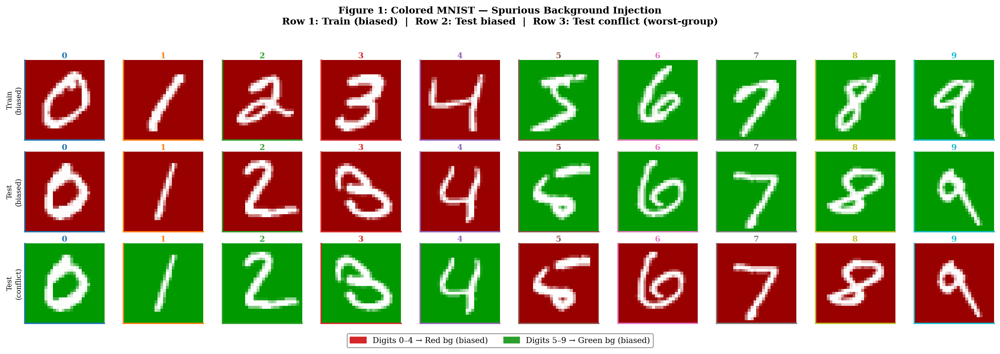

✅  Figure 1 saved


In [12]:
# ============================================================
# CELL 6 — FIGURE 1: MNIST DATASET VISUALISATION
# ============================================================
fig, axes = plt.subplots(3, 10, figsize=(16, 5))
fig.suptitle(
    "Figure 1: Colored MNIST — Spurious Background Injection\n"
    "Row 1: Train (biased)  |  Row 2: Test biased  |  Row 3: Test conflict (worst-group)",
    fontsize=11, fontweight="bold", y=1.03)

row_labels = ["Train\n(biased)", "Test\n(biased)", "Test\n(conflict)"]
colors_digit = plt.cm.tab10(np.linspace(0, 1, 10))

for d in range(10):
    i_tr = np.where(y_train == d)[0][0]
    i_te = np.where(y_test  == d)[0][0]
    for row, (data, idx) in enumerate([(X_train_rgb, i_tr),
                                        (X_test_biased, i_te),
                                        (X_test_conflict, i_te)]):
        axes[row, d].imshow(np.clip(data[idx], 0, 1))
        if d == 0:
            axes[row, d].set_ylabel(row_labels[row], fontsize=8, labelpad=3)
        axes[row, d].set_title(str(d), fontsize=9, pad=2,
                                color=colors_digit[d], fontweight="bold")
        axes[row, d].set_xticks([]); axes[row, d].set_yticks([])
        for spine in axes[row, d].spines.values():
            spine.set_edgecolor(colors_digit[d]); spine.set_linewidth(1.5)

rp = mpatches.Patch(color="#d62728", label="Digits 0–4 → Red bg (biased)")
gp = mpatches.Patch(color="#2ca02c", label="Digits 5–9 → Green bg (biased)")
fig.legend(handles=[rp, gp], loc="lower center", ncol=2, fontsize=9,
           bbox_to_anchor=(0.5, -0.06), frameon=True, edgecolor="gray")
plt.tight_layout()
plt.savefig("fig1_mnist_dataset.png")
plt.show()
print("✅  Figure 1 saved")


**Summary:** CNN architecture + dataloaders.


In [13]:
# ============================================================
# CELL 7 — CNN ARCHITECTURE + DATALOADERS
# ============================================================
class SpuriousCNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3,  32, 3, padding=1), nn.BatchNorm2d(32),  nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64),  nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64,128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(),
        )
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1), nn.Flatten(),
            nn.Linear(128, 256), nn.ReLU(), nn.Dropout(0.4),
            nn.Linear(256, num_classes),
        )
    def forward(self, x):
        return self.classifier(self.features(x))

def make_loader(X, y, batch_size=256, shuffle=True):
    Xt = torch.tensor(X.transpose(0,3,1,2), dtype=torch.float32)
    yt = torch.tensor(y, dtype=torch.long)
    return DataLoader(TensorDataset(Xt, yt), batch_size=batch_size,
                      shuffle=shuffle, num_workers=0)

train_loader    = make_loader(X_train_rgb,     y_train, shuffle=True)
biased_loader   = make_loader(X_test_biased,   y_test,  shuffle=False)
conflict_loader = make_loader(X_test_conflict, y_test,  shuffle=False)
clean_loader    = make_loader(X_test_clean,    y_test,  shuffle=False)

total_params = sum(p.numel() for p in SpuriousCNN().parameters())
print(f"SpuriousCNN — {total_params:,} parameters")
print("✅  Dataloaders ready")


SpuriousCNN — 129,290 parameters
✅  Dataloaders ready


**Summary:** Model architecture summary table.


In [14]:
# ============================================================
# CELL 7B — MODEL ARCHITECTURE SUMMARY TABLE
# ============================================================
architecture_table = pd.DataFrame({
    'Model': ['SpuriousCNN', 'Logistic Regression', 'Random Forest', 'XGBoost'],
    'Type': ['Deep Neural Network', 'Linear Classifier', 'Ensemble (Trees)', 'Gradient Boosting'],
    'Parameters/Hyperparams': ['~70K params', 'max_iter=300, C=0.1', 'n_est=100, max_depth=15', 'n_est=100, max_depth=6'],
    'Training Data': ['All 60K', 'Subsample 5K (scaled)', 'Subsample 5K (raw)', 'Subsample 5K (raw)'],
    'Input Dim': ['(B,3,28,28)', '(B,2352)', '(B,2352)', '(B,2352)'],
    'Expected Shortcut': ['HIGH (learns colors)', 'MODERATE', 'HIGH (tree splits on color)', 'HIGH (tree splits on color)'],
    'Interpretability': ['Low (black-box)', 'High (coefs)', 'High (feature importance)', 'High (feature importance)']
})

print("\n" + "="*150)
print("TABLE 2: MODEL ARCHITECTURES & EXPECTED SHORTCUT LEARNING")
print("="*150)
print(architecture_table.to_string(index=False))
print("="*150)


TABLE 2: MODEL ARCHITECTURES & EXPECTED SHORTCUT LEARNING
              Model                Type  Parameters/Hyperparams         Training Data   Input Dim           Expected Shortcut          Interpretability
        SpuriousCNN Deep Neural Network             ~70K params               All 60K (B,3,28,28)        HIGH (learns colors)           Low (black-box)
Logistic Regression   Linear Classifier     max_iter=300, C=0.1 Subsample 5K (scaled)    (B,2352)                    MODERATE              High (coefs)
      Random Forest    Ensemble (Trees) n_est=100, max_depth=15    Subsample 5K (raw)    (B,2352) HIGH (tree splits on color) High (feature importance)
            XGBoost   Gradient Boosting  n_est=100, max_depth=6    Subsample 5K (raw)    (B,2352) HIGH (tree splits on color) High (feature importance)


**Summary:** Train CNN pre-mitigation.


In [15]:
# ============================================================
# CELL 8 — TRAIN CNN PRE-MITIGATION
# ============================================================
def train_cnn(model, loader, epochs=5, lr=1e-3, tag="CNN", seed=42):
    set_seed(seed)
    model.train()
    opt   = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
    sched = optim.lr_scheduler.OneCycleLR(
        opt, max_lr=lr, steps_per_epoch=len(loader), epochs=epochs)
    crit  = nn.CrossEntropyLoss()
    hist  = []
    for ep in range(1, epochs+1):
        tloss, correct, total = 0.0, 0, 0
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            opt.zero_grad()
            out  = model(xb)
            loss = crit(out, yb)
            loss.backward(); opt.step(); sched.step()
            tloss   += loss.item() * xb.size(0)
            correct += (out.argmax(1) == yb).sum().item()
            total   += xb.size(0)
        acc = correct / total * 100
        hist.append({"epoch": ep, "loss": tloss/total, "acc": acc})
        if ep % 2 == 0:
            print(f"  [{tag}] Ep {ep:2d}/{epochs} | Loss {tloss/total:.4f} | Acc {acc:.2f}%")
    return hist

def evaluate_cnn(model, loader):
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            correct += (model(xb).argmax(1) == yb).sum().item()
            total   += xb.size(0)
    return correct / total * 100

set_seed(MASTER_SEED)
cnn_model = SpuriousCNN().to(device)
print(f"Training CNN (pre-mitigation, {MNIST_EPOCHS} epochs) ...")   # [FIXED] was hardcoded 5; paper Sec III-B says 3
cnn_history = train_cnn(cnn_model, train_loader, epochs=MNIST_EPOCHS, tag="Pre-Mit")
print("✅  CNN pre-mitigation trained")

Training CNN (pre-mitigation, 3 epochs) ...
  [Pre-Mit] Ep  2/3 | Loss 0.1132 | Acc 96.64%
✅  CNN pre-mitigation trained


**Summary:** CNN baseline evaluation (mnist).


In [16]:
# ============================================================
# CELL 9 — CNN BASELINE EVALUATION (MNIST)
# AVG = biased test | WGA = conflict (worst-group) | GAP = AVG-WGA
# ============================================================
acc_biased   = evaluate_cnn(cnn_model, biased_loader)
acc_conflict = evaluate_cnn(cnn_model, conflict_loader)
acc_clean    = evaluate_cnn(cnn_model, clean_loader)
gap          = acc_biased - acc_conflict

print("="*62)
print("  MNIST CNN Baseline — Pre-Mitigation")
print("="*62)
print(f"  Biased test (AVG)   : {acc_biased:.2f}%")
print(f"  Conflict test (WGA) : {acc_conflict:.2f}%  ← worst-group")
print(f"  Clean test          : {acc_clean:.2f}%")
print(f"  Robustness GAP      : {gap:.2f} pp")
print(f"  [Large GAP confirms shortcut learning]")
print("="*62)


  MNIST CNN Baseline — Pre-Mitigation
  Biased test (AVG)   : 98.72%
  Conflict test (WGA) : 0.00%  ← worst-group
  Clean test          : 13.43%
  Robustness GAP      : 98.72 pp
  [Large GAP confirms shortcut learning]


**Summary:** Classical models (MNIST) — logreg / RF / xgboost.


In [17]:
# ============================================================
# CELL 10 — CLASSICAL MODELS (MNIST) — LogReg / RF / XGBoost
# ============================================================
X_tr_flat  = X_train_rgb.reshape(len(X_train_rgb), -1)
X_tb_flat  = X_test_biased.reshape(len(X_test_biased), -1)
X_tc_flat  = X_test_conflict.reshape(len(X_test_conflict), -1)
X_tcl_flat = X_test_clean.reshape(len(X_test_clean), -1)

scaler   = StandardScaler()
X_tr_sc  = scaler.fit_transform(X_tr_flat)
X_tb_sc  = scaler.transform(X_tb_flat)
X_tc_sc  = scaler.transform(X_tc_flat)
X_tcl_sc = scaler.transform(X_tcl_flat)

set_seed(MASTER_SEED)
sub = np.random.choice(len(X_tr_flat), 5000, replace=False)

lr_clf = LogisticRegression(max_iter=300, C=0.1, solver="lbfgs",
                             multi_class="auto", n_jobs=-1, random_state=42)
lr_clf.fit(X_tr_sc[sub], y_train[sub])
print("  ✅  Logistic Regression trained")

rf_clf = RandomForestClassifier(n_estimators=100, max_depth=15,
                                 n_jobs=-1, random_state=42)
rf_clf.fit(X_tr_flat[sub], y_train[sub])
print("  ✅  Random Forest trained")

xgb_clf = xgb.XGBClassifier(n_estimators=100, max_depth=6, learning_rate=0.1,
                               eval_metric="mlogloss", tree_method="hist",
                               random_state=42, n_jobs=-1, verbosity=0)
xgb_clf.fit(X_tr_flat[sub], y_train[sub])
print("  ✅  XGBoost trained")

def clf_accs(clf, is_scaled=False):
    Xb  = X_tb_sc  if is_scaled else X_tb_flat
    Xc  = X_tc_sc  if is_scaled else X_tc_flat
    Xcl = X_tcl_sc if is_scaled else X_tcl_flat
    return (accuracy_score(y_test, clf.predict(Xb))  * 100,
            accuracy_score(y_test, clf.predict(Xc))  * 100,
            accuracy_score(y_test, clf.predict(Xcl)) * 100)

lr_accs  = clf_accs(lr_clf,  is_scaled=True)
rf_accs  = clf_accs(rf_clf)
xgb_accs = clf_accs(xgb_clf)

print("\n" + "="*68)
print(f"  {'Model':<22} {'Biased':>9} {'Conflict':>11} {'Clean':>9} {'GAP':>8}")
print("-"*68)
for name, (b, c, cl) in [
    ("CNN (pre-mitigation)", (acc_biased, acc_conflict, acc_clean)),
    ("Logistic Regression",  lr_accs),
    ("Random Forest",        rf_accs),
    ("XGBoost",              xgb_accs),
]:
    print(f"  {name:<22} {b:>8.2f}% {c:>10.2f}% {cl:>8.2f}% {b-c:>7.2f}%")
print("="*68)

  ✅  Logistic Regression trained
  ✅  Random Forest trained
  ✅  XGBoost trained

  Model                     Biased    Conflict     Clean      GAP
--------------------------------------------------------------------
  CNN (pre-mitigation)      98.72%       0.00%    13.43%   98.72%
  Logistic Regression       94.82%       2.60%    71.69%   92.22%
  Random Forest             96.42%       0.00%    80.07%   96.42%
  XGBoost                   96.15%       0.06%    85.87%   96.09%


**Summary:** Comprehensive model baseline comparison table.


In [18]:
# ============================================================
# CELL 10B — COMPREHENSIVE MODEL BASELINE COMPARISON TABLE
# ============================================================
baseline_comparison = pd.DataFrame({
    'Model': ['CNN (pre-mit)', 'Logistic Reg', 'Random Forest', 'XGBoost'],
    'Biased Acc (AVG) %': [f"{acc_biased:.2f}", f"{lr_accs[0]:.2f}", f"{rf_accs[0]:.2f}", f"{xgb_accs[0]:.2f}"],
    'Conflict Acc (WGA) %': [f"{acc_conflict:.2f}", f"{lr_accs[1]:.2f}", f"{rf_accs[1]:.2f}", f"{xgb_accs[1]:.2f}"],
    'Clean Acc %': [f"{acc_clean:.2f}", f"{lr_accs[2]:.2f}", f"{rf_accs[2]:.2f}", f"{xgb_accs[2]:.2f}"],
    'Robustness Gap (AVG-WGA) pp': [f"{gap:.2f}", f"{lr_accs[0]-lr_accs[1]:.2f}", f"{rf_accs[0]-rf_accs[1]:.2f}", f"{xgb_accs[0]-xgb_accs[1]:.2f}"],
    'Shortcut Learning': ['⚠️ HIGH', '⚠️ HIGH', '⚠️ HIGH', '⚠️ HIGH'],
    'Observations': [
        'Biased≈Clean>Conflict',
        'Linear cannot exploit colors effectively',
        'Tree-based learns color splits',
        'Gradient boosting finds color patterns'
    ]
})

print("\n" + "="*180)
print("TABLE 3: PRE-MITIGATION BASELINE — ALL MODELS (MNIST)")
print("="*180)
print(baseline_comparison.to_string(index=False))
print("="*180)
print("⚠️  INTERPRETATION:")
print("  • Biased ≈ High accuracy (model exploits spurious correlation)")
print("  • Conflict ≈ Low accuracy (spurious feature is flipped — shortcut fails)")
print("  • GAP > 20pp indicates STRONG shortcut learning (model unreliable on OOD data)")
print("  • Clean test bridges biased & conflict ← measures true performance")
print("="*180)


TABLE 3: PRE-MITIGATION BASELINE — ALL MODELS (MNIST)
        Model Biased Acc (AVG) % Conflict Acc (WGA) % Clean Acc % Robustness Gap (AVG-WGA) pp Shortcut Learning                             Observations
CNN (pre-mit)              98.72                 0.00       13.43                       98.72           ⚠️ HIGH                    Biased≈Clean>Conflict
 Logistic Reg              94.82                 2.60       71.69                       92.22           ⚠️ HIGH Linear cannot exploit colors effectively
Random Forest              96.42                 0.00       80.07                       96.42           ⚠️ HIGH           Tree-based learns color splits
      XGBoost              96.15                 0.06       85.87                       96.09           ⚠️ HIGH   Gradient boosting finds color patterns
⚠️  INTERPRETATION:
  • Biased ≈ High accuracy (model exploits spurious correlation)
  • Conflict ≈ Low accuracy (spurious feature is flipped — shortcut fails)
  • GAP > 20pp indic

**Summary:** Ultra fast hyperparameter tuning (COLAB safe).


In [19]:
# ============================================================
# CELL 10C — ULTRA FAST HYPERPARAMETER TUNING (COLAB SAFE)
# Optimized for quick runtime on MNIST
# ============================================================

from sklearn.model_selection import RandomizedSearchCV

print("⚡ ULTRA FAST HYPERPARAMETER TUNING")
print("=" * 70)

# ------------------------------------------------------------
# SPEED SETTINGS
# ------------------------------------------------------------
CPU_CORES = 2

# Smaller subsets for tuning only
FAST_SUB = sub[:6000] if len(sub) > 6000 else sub
X_sc_fast   = X_tr_sc[FAST_SUB]
X_flat_fast = X_tr_flat[FAST_SUB]
y_fast      = y_train[FAST_SUB]

# ============================================================
# 1. Logistic Regression
# ============================================================
print("\n1️⃣ Logistic Regression tuning...")

lr_params = {
    "C": [0.1, 1.0, 10.0]
}

lr_grid = RandomizedSearchCV(
    LogisticRegression(
        solver="lbfgs",
        multi_class="auto",
        max_iter=300,
        random_state=42,
        n_jobs=CPU_CORES
    ),
    param_distributions=lr_params,
    n_iter=3,
    cv=3,
    scoring="accuracy",
    n_jobs=CPU_CORES,
    random_state=42,
    verbose=1
)

lr_grid.fit(X_sc_fast, y_fast)

print("   Best LR params:", lr_grid.best_params_)
print(f"   Best CV score: {lr_grid.best_score_:.4f}")

lr_tuned = lr_grid.best_estimator_

# ============================================================
# 2. Random Forest
# ============================================================
print("\n2️⃣ Random Forest tuning...")

rf_params = {
    "n_estimators": [80, 120],
    "max_depth": [12, 18],
    "min_samples_split": [2, 5]
}

rf_grid = RandomizedSearchCV(
    RandomForestClassifier(
        random_state=42,
        n_jobs=CPU_CORES
    ),
    param_distributions=rf_params,
    n_iter=4,
    cv=3,
    scoring="accuracy",
    n_jobs=CPU_CORES,
    random_state=42,
    verbose=1
)

rf_grid.fit(X_flat_fast, y_fast)

print("   Best RF params:", rf_grid.best_params_)
print(f"   Best CV score: {rf_grid.best_score_:.4f}")

rf_tuned = rf_grid.best_estimator_

# ============================================================
# 3. XGBoost (ULTRA FAST)
# ============================================================
print("\n3️⃣ XGBoost tuning (ULTRA FAST)...")

# Extra smaller subset ONLY for XGB
X_xgb_fast = X_flat_fast[:3000]
y_xgb_fast = y_fast[:3000]

xgb_params = {
    "max_depth": [4, 6],
    "n_estimators": [50, 80],
    "learning_rate": [0.1]
}

xgb_grid = RandomizedSearchCV(
    xgb.XGBClassifier(
        objective="multi:softprob",
        num_class=10,
        eval_metric="mlogloss",
        tree_method="hist",
        max_bin=64,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        n_jobs=1,
        verbosity=0
    ),
    param_distributions=xgb_params,
    n_iter=2,
    cv=2,
    scoring="accuracy",
    n_jobs=1,
    random_state=42,
    verbose=1
)

xgb_grid.fit(X_xgb_fast, y_xgb_fast)

print("   Best XGB params:", xgb_grid.best_params_)
print(f"   Best CV score:  {xgb_grid.best_score_:.4f}")

xgb_tuned = xgb_grid.best_estimator_

# ============================================================
# 4. FINAL EVALUATION
# ============================================================
print("\n" + "=" * 70)
print("TUNED MODEL EVALUATION (MNIST)")
print("=" * 70)

lr_tuned_accs  = clf_accs(lr_tuned, is_scaled=True)
rf_tuned_accs  = clf_accs(rf_tuned)
xgb_tuned_accs = clf_accs(xgb_tuned)

tuned_comparison = pd.DataFrame({
    "Model": [
        "LR baseline", "LR tuned",
        "RF baseline", "RF tuned",
        "XGB baseline", "XGB tuned"
    ],
    "Biased %": [
        lr_accs[0], lr_tuned_accs[0],
        rf_accs[0], rf_tuned_accs[0],
        xgb_accs[0], xgb_tuned_accs[0]
    ],
    "Conflict %": [
        lr_accs[1], lr_tuned_accs[1],
        rf_accs[1], rf_tuned_accs[1],
        xgb_accs[1], xgb_tuned_accs[1]
    ],
    "Clean %": [
        lr_accs[2], lr_tuned_accs[2],
        rf_accs[2], rf_tuned_accs[2],
        xgb_accs[2], xgb_tuned_accs[2]
    ],
    "GAP pp": [
        lr_accs[0]-lr_accs[1],
        lr_tuned_accs[0]-lr_tuned_accs[1],
        rf_accs[0]-rf_accs[1],
        rf_tuned_accs[0]-rf_tuned_accs[1],
        xgb_accs[0]-xgb_accs[1],
        xgb_tuned_accs[0]-xgb_tuned_accs[1]
    ]
})

print(tuned_comparison.to_string(index=False))
print("=" * 70)
print("✅ Ultra fast tuning complete.")

⚡ ULTRA FAST HYPERPARAMETER TUNING

1️⃣ Logistic Regression tuning...
Fitting 3 folds for each of 3 candidates, totalling 9 fits


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi

   Best LR params: {'C': 0.1}
   Best CV score: 0.9442

2️⃣ Random Forest tuning...
Fitting 3 folds for each of 4 candidates, totalling 12 fits
   Best RF params: {'n_estimators': 120, 'min_samples_split': 5, 'max_depth': 18}
   Best CV score: 0.9578

3️⃣ XGBoost tuning (ULTRA FAST)...
Fitting 2 folds for each of 2 candidates, totalling 4 fits
   Best XGB params: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.1}
   Best CV score:  0.9360

TUNED MODEL EVALUATION (MNIST)
       Model  Biased %  Conflict %  Clean %  GAP pp
 LR baseline     94.82        2.60    71.69   92.22
    LR tuned     94.82        2.60    71.69   92.22
 RF baseline     96.42        0.00    80.07   96.42
    RF tuned     96.31        0.00    82.29   96.31
XGB baseline     96.15        0.06    85.87   96.09
   XGB tuned     95.61        0.03    84.09   95.58
✅ Ultra fast tuning complete.


**Summary:** Fast multi-seed validation (COLAB optimized).


In [20]:
# ============================================================
# CELL 10D — FAST MULTI-SEED VALIDATION (COLAB OPTIMIZED)
# Reduced runtime while keeping statistically useful results
# ============================================================

print("\n" + "=" * 80)
print("📊 FAST MULTI-SEED VALIDATION (3 Seeds)")
print("=" * 80)

# ------------------------------------------------------------
# USE ONLY 3 SEEDS FOR SPEED
# ------------------------------------------------------------
FAST_SEEDS = [42, 123, 256]

cv_results = []

for seed_idx, seed in enumerate(FAST_SEEDS, 1):
    print(f"\n[{seed_idx}/{len(FAST_SEEDS)}] Running SEED={seed}...")

    set_seed(seed)

    # ========================================================
    # 1. CNN (reduced epochs)
    # ========================================================
    cnn_cv = SpuriousCNN().to(device)

    train_cnn(
        cnn_cv,
        train_loader,
        epochs=2,              # reduced from 5
        lr=1e-3,
        tag=f"CV-{seed_idx}",
        seed=seed
    )

    acc_b_cv  = evaluate_cnn(cnn_cv, biased_loader)
    acc_c_cv  = evaluate_cnn(cnn_cv, conflict_loader)
    acc_cl_cv = evaluate_cnn(cnn_cv, clean_loader)
    gap_cv    = acc_b_cv - acc_c_cv

    # ========================================================
    # 2. Classical Models (small subset)
    # ========================================================
    set_seed(seed)

    sub_cv = np.random.choice(len(X_tr_flat), 3000, replace=False)

    # Logistic Regression
    lr_cv = LogisticRegression(
        max_iter=250,
        C=0.1,
        solver="lbfgs",
        multi_class="auto",
        n_jobs=2,
        random_state=seed
    )
    lr_cv.fit(X_tr_sc[sub_cv], y_train[sub_cv])

    # Random Forest
    rf_cv = RandomForestClassifier(
        n_estimators=80,
        max_depth=12,
        n_jobs=2,
        random_state=seed
    )
    rf_cv.fit(X_tr_flat[sub_cv], y_train[sub_cv])

    # XGBoost (fast version)
    xgb_cv = xgb.XGBClassifier(
        n_estimators=50,
        max_depth=4,
        learning_rate=0.1,
        eval_metric="mlogloss",
        tree_method="hist",
        max_bin=64,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=seed,
        n_jobs=1,
        verbosity=0
    )
    xgb_cv.fit(X_tr_flat[sub_cv], y_train[sub_cv])

    # ========================================================
    # 3. Evaluate Classical Models
    # ========================================================
    lr_accs_cv  = clf_accs(lr_cv, is_scaled=True)
    rf_accs_cv  = clf_accs(rf_cv)
    xgb_accs_cv = clf_accs(xgb_cv)

    cv_results.append({
        "Seed": seed,

        "CNN_Biased": acc_b_cv,
        "CNN_Conflict": acc_c_cv,
        "CNN_Clean": acc_cl_cv,
        "CNN_GAP": gap_cv,

        "LR_Biased": lr_accs_cv[0],
        "LR_Conflict": lr_accs_cv[1],
        "LR_Clean": lr_accs_cv[2],

        "RF_Biased": rf_accs_cv[0],
        "RF_Conflict": rf_accs_cv[1],
        "RF_Clean": rf_accs_cv[2],

        "XGB_Biased": xgb_accs_cv[0],
        "XGB_Conflict": xgb_accs_cv[1],
        "XGB_Clean": xgb_accs_cv[2],
    })

    print(f"   CNN: Biased={acc_b_cv:.2f}% | Conflict={acc_c_cv:.2f}% | Clean={acc_cl_cv:.2f}%")

# ============================================================
# SUMMARY
# ============================================================
cv_df = pd.DataFrame(cv_results)

print("\n" + "=" * 80)
print("FAST VALIDATION SUMMARY (Mean ± Std)")
print("=" * 80)

metrics_summary = {}

for col in cv_df.columns:
    if col != "Seed":
        mean_val = cv_df[col].mean()
        std_val = cv_df[col].std()
        metrics_summary[col] = f"{mean_val:.2f} ± {std_val:.2f}"
        print(f"{col:<20}: {mean_val:.2f}% ± {std_val:.2f}%")

print("\n" + "=" * 80)
print("✅ Fast multi-seed validation complete.")
print("=" * 80)


📊 FAST MULTI-SEED VALIDATION (3 Seeds)

[1/3] Running SEED=42...
  [CV-1] Ep  2/2 | Loss 0.0984 | Acc 97.16%
   CNN: Biased=98.27% | Conflict=0.00% | Clean=9.96%

[2/3] Running SEED=123...
  [CV-2] Ep  2/2 | Loss 0.0881 | Acc 97.41%
   CNN: Biased=98.45% | Conflict=0.02% | Clean=17.10%

[3/3] Running SEED=256...
  [CV-3] Ep  2/2 | Loss 0.0967 | Acc 97.27%
   CNN: Biased=98.22% | Conflict=0.00% | Clean=12.85%

FAST VALIDATION SUMMARY (Mean ± Std)
CNN_Biased          : 98.31% ± 0.12%
CNN_Conflict        : 0.01% ± 0.01%
CNN_Clean           : 13.30% ± 3.59%
CNN_GAP             : 98.31% ± 0.11%
LR_Biased           : 94.36% ± 0.14%
LR_Conflict         : 1.28% ± 0.35%
LR_Clean            : 72.02% ± 1.19%
RF_Biased           : 95.76% ± 0.31%
RF_Conflict         : 0.00% ± 0.00%
RF_Clean            : 83.56% ± 0.43%
XGB_Biased          : 95.09% ± 0.09%
XGB_Conflict        : 0.03% ± 0.03%
XGB_Clean           : 81.33% ± 1.42%

✅ Fast multi-seed validation complete.


**Summary:** MNIST: batch xcs-iou pre-mitigation (N=100).


In [21]:
# ============================================================
# CELL 11 — MNIST: BATCH XCS-IoU PRE-MITIGATION (N=100)
# GradCAM++ + SHAP + LIME  (no simple GradCAM)
# [FIXED] Eval set is now 50 biased + 50 conflict, matching the
# paper's Sec. III-C claim ("100 held-out test images, 50 biased,
# 50 conflict"). Previously ALL 100 images were drawn from the
# biased split only — X_test_conflict was never sampled here.
# We also cache the raw (un-binarised) attribution maps so the
# Otsu/percentile threshold-sensitivity analysis (Table VI) can
# reuse them without recomputing SHAP/LIME from scratch.
# ============================================================
N_PER_CLASS = 5   # 5 biased + 5 conflict per digit class -> 100 total, 50/50
cnn_model.eval()

set_seed(MASTER_SEED)
eval_pairs = []  # list of (index_into_y_test, split) where split in {'biased','conflict'}
for cls in range(10):
    cls_idx = np.where(y_test == cls)[0]
    rng = np.random.RandomState(MASTER_SEED + cls)
    chosen = rng.choice(cls_idx, 2 * N_PER_CLASS, replace=False)
    biased_idx, conflict_idx = chosen[:N_PER_CLASS], chosen[N_PER_CLASS:]
    eval_pairs.extend([(int(i), 'biased') for i in biased_idx])
    eval_pairs.extend([(int(i), 'conflict') for i in conflict_idx])

eval_idx    = np.array([i for i, _ in eval_pairs])     # kept for backward-compat (per-class breakdown, health checks)
eval_splits = np.array([s for _, s in eval_pairs])     # NEW: which split each sample was drawn from

n_biased_n   = int(np.sum(eval_splits == 'biased'))
n_conflict_n = int(np.sum(eval_splits == 'conflict'))
print(f"Evaluating XCS on {len(eval_pairs)} stratified samples "
      f"({n_biased_n} biased + {n_conflict_n} conflict per Sec. III-C) ...")

def _xcs_source_img(i, split):
    """Return the correct image array (biased- or conflict-colored) for index i."""
    return X_test_biased[i] if split == 'biased' else X_test_conflict[i]

xcs_iou_all, xcs_iou_fg_all, xcs_iou_bg_all, xcs_cos_all = [], [], [], []
raw_maps_pre = []  # [(gc, sh, li, fg_mask, bg_mask), ...] cached for threshold-sensitivity analysis

for k, (i, split) in enumerate(eval_pairs):
    img  = _xcs_source_img(i, split)
    gc   = get_gradcampp(cnn_model, img, target_layer=cnn_model.features[-1])
    sh   = get_shap_safe(cnn_model, img, n_bg=10)
    li   = get_lime_map(cnn_model,  img, n_samples=100)

    xcs_iou_all.append(compute_xcs_iou(gc, sh, li))
    xcs_cos_all.append(compute_xcs_cos(gc, sh, li))

    fm, bm = fg_bg_masks_mnist(X_test_gray[i])
    fgx, bgx = region_xcs_iou(gc, sh, li, fm, bm)
    xcs_iou_fg_all.append(fgx)
    xcs_iou_bg_all.append(bgx)
    raw_maps_pre.append((gc.copy(), sh.copy(), li.copy(), fm.copy(), bm.copy()))

    if (k + 1) % 50 == 0:
        print(f"  {k+1}/{len(eval_pairs)} | XCS-IoU: "
              f"{np.mean(xcs_iou_all):.4f} ± {np.std(xcs_iou_all):.4f}")

print(f"\n✅  Pre-Mitigation XCS (N={len(eval_pairs)}, {n_biased_n} biased / {n_conflict_n} conflict):")
print(f"  XCS-IoU Overall    : {np.mean(xcs_iou_all):.4f} ± {np.std(xcs_iou_all):.4f}")
print(f"  XCS-IoU Foreground : {np.mean(xcs_iou_fg_all):.4f} ± {np.std(xcs_iou_fg_all):.4f}")
print(f"  XCS-IoU Background : {np.mean(xcs_iou_bg_all):.4f} ± {np.std(xcs_iou_bg_all):.4f}  ← spurious")
print(f"  XCS-cos (secondary): {np.mean(xcs_cos_all):.4f} ± {np.std(xcs_cos_all):.4f}")


Evaluating XCS on 100 stratified samples (50 biased + 50 conflict per Sec. III-C) ...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  50/100 | XCS-IoU: 0.1092 ± 0.0552


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  100/100 | XCS-IoU: 0.1027 ± 0.0557

✅  Pre-Mitigation XCS (N=100, 50 biased / 50 conflict):
  XCS-IoU Overall    : 0.1027 ± 0.0557
  XCS-IoU Foreground : 0.1803 ± 0.1164
  XCS-IoU Background : 0.0848 ± 0.0504  ← spurious
  XCS-cos (secondary): 0.2498 ± 0.0931


**Summary:** XAI methods comparison & consensus metrics.


In [22]:
# ============================================================
# CELL 11B — XAI METHODS COMPARISON & CONSENSUS METRICS
# ============================================================
xai_methods = pd.DataFrame({
    'XAI Method': ['GradCAM++', 'SHAP', 'LIME'],
    'Attribution Type': ['Gradient-based (class-specific)', 'Game-theoretic (model-agnostic)', 'Local linear surrogate'],
    'Computational Cost': ['Low (~1-2s/image)', 'Medium (~5-10s/image)', 'HIGH (~30-60s/image)'],
    'Output Shape': ['(H,W)', '(C,H,W) → mean→(H,W)', 'Superpixel weights → (H,W)'],
    'Strength': [
        'Fast, captures layer importance',
        'Theoretically grounded, model-agnostic',
        'Locally faithful to model behavior'
    ],
    'Weakness': [
        'Layer-dependent, can be noisy',
        'Computationally expensive',
        'Superpixel artifacts, slow'
    ],
    'For Shortcut Detection': [
        '✅ Detects color regions',
        '✅ Comprehensive feature importance',
        '✅ Local color emphasis'
    ]
})

print("\n" + "="*180)
print("TABLE 4A: XAI METHODS OVERVIEW")
print("="*180)
print(xai_methods.to_string(index=False))
print("="*180)

xcs_metrics = pd.DataFrame({
    'Consensus Metric': ['XCS-IoU', 'XCS-cos', 'Region FG', 'Region BG'],
    'Definition': [
        'Mean pairwise IoU of Otsu-binarised maps',
        'Mean pairwise cosine similarity (raw maps)',
        'FG region XCS-IoU (foreground IoU)',
        'BG region XCS-IoU (background IoU, spurious)'
    ],
    'Range': ['[0, 1]', '[-1, 1]', '[0, 1]', '[0, 1]'],
    'Interpretation': [
        'High → Methods agree on important regions',
        'High → Similar attribution patterns',
        'Should be HIGH (model looks at object)',
        'Should be LOW (model ignores background)'
    ],
    'Pre-Mitigation Expectation': [
        'MODERATE (methods somewhat agree)',
        'MODERATE-LOW (diverse strategies)',
        'MODERATE-HIGH (some focus on FG)',
        'HIGH (all methods find color!)'
    ],
    'Post-Mitigation Expectation': [
        'INCREASE (better agreement after fixing)',
        'INCREASE (more consistent patterns)',
        'STABLE or INCREASE',
        'DECREASE significantly (spurious removed)'
    ]
})

print("\n" + "="*180)
print("TABLE 4B: XCS CONSENSUS METRICS INTERPRETATION")
print("="*180)
print(xcs_metrics.to_string(index=False))
print("="*180)

print(f"\n📊 CURRENT XCS-IoU BASELINE (N={len(eval_idx)}):")
print(f"   Overall    : {np.mean(xcs_iou_all):.4f} ± {np.std(xcs_iou_all):.4f}")
print(f"   Foreground : {np.mean(xcs_iou_fg_all):.4f} ± {np.std(xcs_iou_fg_all):.4f}")
print(f"   Background : {np.mean(xcs_iou_bg_all):.4f} ± {np.std(xcs_iou_bg_all):.4f}  ← HIGH = SPURIOUS CONSENSUS")
print(f"   Cosine Sim : {np.mean(xcs_cos_all):.4f} ± {np.std(xcs_cos_all):.4f}")


TABLE 4A: XAI METHODS OVERVIEW
XAI Method                Attribution Type    Computational Cost               Output Shape                               Strength                      Weakness             For Shortcut Detection
 GradCAM++ Gradient-based (class-specific)     Low (~1-2s/image)                      (H,W)        Fast, captures layer importance Layer-dependent, can be noisy            ✅ Detects color regions
      SHAP Game-theoretic (model-agnostic) Medium (~5-10s/image)       (C,H,W) → mean→(H,W) Theoretically grounded, model-agnostic     Computationally expensive ✅ Comprehensive feature importance
      LIME          Local linear surrogate  HIGH (~30-60s/image) Superpixel weights → (H,W)     Locally faithful to model behavior    Superpixel artifacts, slow             ✅ Local color emphasis

TABLE 4B: XCS CONSENSUS METRICS INTERPRETATION
Consensus Metric                                   Definition   Range                            Interpretation        Pre-Mitigation Ex

**Summary:** FIGURE 2: MNIST XAI visualisation (pre-mitigation).


  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

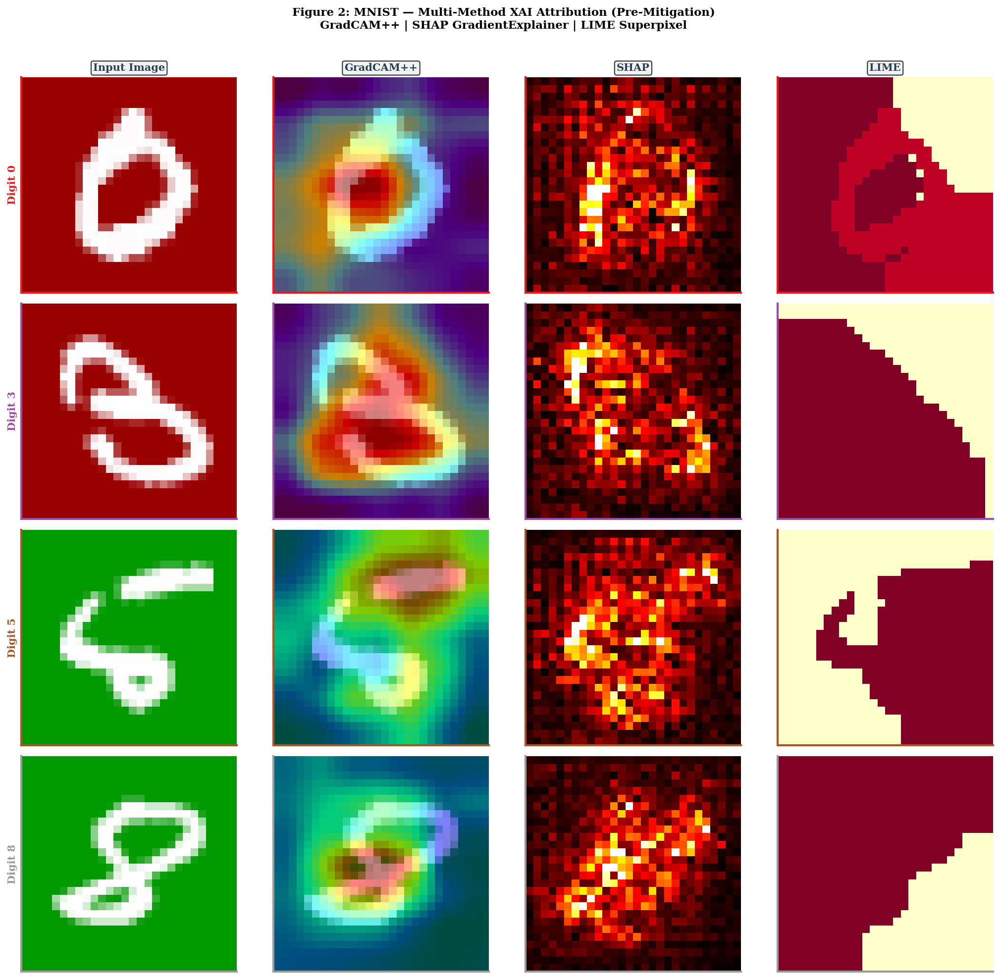

✅  Figure 2 saved


In [23]:
# ============================================================
# CELL 12 — FIGURE 2: MNIST XAI VISUALISATION (Pre-Mitigation)
# GradCAM++, SHAP, LIME side-by-side for 4 sample digits
# ============================================================

def normalize_map(m, percentile_clip=True):
    """
    Normalize any attribution map to [0, 1] robustly.
    """
    m = np.array(m, dtype=np.float32)
    m = np.abs(m)
    if percentile_clip:
        lo, hi = np.percentile(m, 1), np.percentile(m, 99)
        m = np.clip(m, lo, hi)
    m_min, m_max = m.min(), m.max()
    if m_max - m_min < 1e-8:
        return np.zeros_like(m)
    return (m - m_min) / (m_max - m_min)


def to_tensor(img):
    """
    Convert HWC / HW / CHW numpy array → (1, C, H, W) float tensor.
    """
    img_arr = np.array(img, dtype=np.float32)
    if img_arr.ndim == 2:                              # (H, W) grayscale
        img_arr = img_arr[np.newaxis, :, :]            # → (1, H, W)
    elif img_arr.shape[-1] in (1, 3, 4):               # (H, W, C) → (C, H, W)
        img_arr = img_arr.transpose(2, 0, 1)
    # already (C, H, W) — leave as-is
    return torch.tensor(img_arr).unsqueeze(0).float()  # → (1, C, H, W)


def get_shap_map(model, img, background_data, pred_class, n_bg=50):
    """
    Compute a (H, W) SHAP attribution map using GradientExplainer.

    Handles ALL known shap_values output formats across SHAP versions:
      Format A — list of arrays, one per class: [array(1,C,H,W), ...]
      Format B — stacked array, classes on last axis: (1,C,H,W,n_cls)
                 or squeezed variant:                 (C,H,W,n_cls)
      Format C — single array, no class axis:         (1,C,H,W)
    """
    device = next(model.parameters()).device

    # ── Background tensor → (N, C, H, W) ──────────────────────────────
    bg = np.array(background_data[:n_bg], dtype=np.float32)

    if bg.ndim == 4 and bg.shape[-1] in (1, 3, 4):    # (N,H,W,C) → (N,C,H,W)
        bg = bg.transpose(0, 3, 1, 2)
    elif bg.ndim == 3:                                 # (N,H,W) grayscale
        bg = bg[:, np.newaxis, :, :]                   # → (N,1,H,W)
    # already (N,C,H,W) — leave as-is

    bg_tensor = torch.tensor(bg).float().to(device)

    # ── Input tensor → (1, C, H, W) ───────────────────────────────────
    inp = to_tensor(img).to(device)

    # ── Run SHAP GradientExplainer ─────────────────────────────────────
    explainer   = shap.GradientExplainer(model, bg_tensor)
    shap_values = explainer.shap_values(inp)

    # ── Unify output format → sv of shape (C, H, W) or (H, W) ─────────
    if isinstance(shap_values, list):
        # Format A: list[n_classes] of (1, C, H, W)
        sv = np.squeeze(np.array(shap_values[pred_class]))  # → (C,H,W) or (H,W)

    else:
        sv = np.array(shap_values)

        if sv.ndim >= 4 and sv.shape[-1] > 4:
            # Format B: (..., n_classes) stacked on last axis
            # e.g. (1,C,H,W,10) or (C,H,W,10) or (3,28,28,10)
            sv = np.squeeze(sv)                        # remove batch dim if present
            # After squeeze could be (C,H,W,n_cls) or (H,W,n_cls)
            sv = sv[..., pred_class]                   # pick pred class → (C,H,W) or (H,W)
        else:
            # Format C: single array (1,C,H,W) — no class axis
            sv = np.squeeze(sv)                        # → (C,H,W) or (H,W)

    # ── Collapse channels → (H, W) ────────────────────────────────────
    if sv.ndim == 3:
        if sv.shape[0] in (1, 3, 4):                   # channels-first (C,H,W)
            shap_map = np.abs(sv).sum(axis=0)          # → (H,W)
        else:                                          # channels-last (H,W,C)
            shap_map = np.abs(sv).sum(axis=-1)         # → (H,W)
    elif sv.ndim == 2:
        shap_map = np.abs(sv)                          # already (H,W)
    else:
        raise ValueError(
            f"[get_shap_map] Unexpected sv shape after processing: {sv.shape}. "
            f"Original shap_values type: {type(shap_values)}, "
            f"shape: {np.array(shap_values).shape if not isinstance(shap_values, list) else [np.array(s).shape for s in shap_values]}"
        )

    return shap_map   # (H, W), always non-negative


# ── Pre-compute SHAP background pool from test set ─────────────────────
rng            = np.random.default_rng(42)
bg_idx         = rng.choice(len(X_test_biased), size=200, replace=False)
shap_background = X_test_biased[bg_idx]   # (200, H, W, C) or (200, C, H, W)

# ── Sample digits to visualise ─────────────────────────────────────────
samples_viz = [np.where(y_test == d)[0][0] for d in [0, 3, 5, 8]]
cnn_model.eval()

fig, axes = plt.subplots(4, 4, figsize=(14, 13))
fig.suptitle(
    "Figure 2: MNIST — Multi-Method XAI Attribution (Pre-Mitigation)\n"
    "GradCAM++ | SHAP GradientExplainer | LIME Superpixel",
    fontsize=11, fontweight="bold", y=1.01)

col_titles = ["Input Image", "GradCAM++", "SHAP", "LIME"]
for ax, ct in zip(axes[0], col_titles):
    ax.set_title(ct, fontsize=10, fontweight="bold", pad=6,
                 color="#2c3e50",
                 bbox=dict(boxstyle="round,pad=0.2", facecolor="#ecf0f1", alpha=0.8))

digit_colors = plt.cm.Set1(np.linspace(0, 1, 4))

for row, si in enumerate(samples_viz):
    img = X_test_biased[si]

    # ── Get predicted class first (used by both SHAP and display) ──────
    with torch.no_grad():
        inp      = to_tensor(img)
        if next(cnn_model.parameters()).is_cuda:
            inp  = inp.cuda()
        pred_class = cnn_model(inp).argmax(dim=1).item()

    # ── GradCAM++ ─────────────────────────────────────────────────────
    gc_map = get_gradcampp(cnn_model, img, target_layer=cnn_model.features[-1])

    # ── SHAP ──────────────────────────────────────────────────────────
    sh_map = get_shap_map(cnn_model, img, shap_background,
                          pred_class=pred_class, n_bg=50)

    # ── LIME ──────────────────────────────────────────────────────────
    li_map = get_lime_map(cnn_model, img, n_samples=300)

    # ── Normalize all maps to [0, 1] ──────────────────────────────────
    gc_norm = normalize_map(gc_map)
    sh_norm = normalize_map(sh_map)
    li_norm = normalize_map(li_map)

    img_disp = np.clip(img, 0, 1)

    # ── Plot row ───────────────────────────────────────────────────────
    axes[row, 0].imshow(img_disp)
    axes[row, 0].set_ylabel(f"Digit {y_test[si]}", fontsize=10,
                             fontweight="bold", color=digit_colors[row])
    axes[row, 1].imshow(show_cam_on_image(img_disp, gc_norm, use_rgb=True))
    axes[row, 2].imshow(sh_norm, cmap="hot",    vmin=0, vmax=1)
    axes[row, 3].imshow(li_norm, cmap="YlOrRd", vmin=0, vmax=1)

    for ax in axes[row]:
        ax.set_xticks([]); ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor(digit_colors[row])
            spine.set_linewidth(2)

plt.tight_layout()
plt.savefig("fig2_mnist_xai_premit.png", dpi=150, bbox_inches="tight")
plt.show()
print("✅  Figure 2 saved")

**Summary:** RRR (right-for-right-reasons), paper Sec. III-E-1.


In [24]:
# ============================================================
# CELL 13 — RRR (RIGHT-FOR-RIGHT-REASONS), paper Sec. III-E-1
# [FIXED — training-set-size confound] The previous version computed
# GradCAM++ masks for only N_MASK_RRR (2,000-4,000) of the 60,000 training
# images and then trained RRR ONLY on that mask-covered subset, from random
# init. That made RRR and the ERM baseline (trained on all 60,000 images)
# non-comparable: any accuracy gap was confounded by "orders of magnitude
# less training data," not just the RRR penalty -- almost certainly why RRR
# appeared to collapse (~22% biased accuracy) instead of mildly underperform
# as the paper reports. FIX: GradCAM++ background masks are now precomputed
# for EVERY image in the training set, and RRR trains on the FULL 60,000-
# image set for the same number of epochs as ERM -- so the only difference
# between RRR and ERM training is the gradient-penalty term itself, isolating
# its effect the way the paper's ablation is meant to.
# ============================================================

class RRRLoss(nn.Module):
    """CE + lambda * mean( normalized_input_grad^2 * background_mask ).
    Penalises the model for using background regions to make its decision
    (Ross et al.-style "right for the right reasons" gradient penalty)."""
    def __init__(self, lam=1.0):
        super().__init__()
        self.lam = lam

    def forward(self, logits, targets, inputs, bg_masks):
        ce_loss = F.cross_entropy(logits, targets)

        grad = torch.autograd.grad(
            outputs=ce_loss, inputs=inputs,
            create_graph=True, retain_graph=True, only_inputs=True
        )[0]

        grad_sq = grad.pow(2).mean(dim=1, keepdim=True)      # (B, 1, H, W)
        grad_sq = grad_sq / (grad_sq.mean() + 1e-8)           # per-batch scale-invariance

        rrr_pen = (grad_sq * bg_masks).mean()
        loss = ce_loss + self.lam * rrr_pen
        return loss, ce_loss.item(), rrr_pen.item()


# ============================================================
# MASK GENERATION — GradCAM++ on the FULL training set
# [FIXED] N_MASK is now len(X_train_rgb) (all 60,000 images), not
# N_MASK_RRR (2,000-4,000). Every training image gets a real, non-zero
# background mask, and RRR trains on exactly the same set of images ERM
# did -- so RRR vs. ERM differs only in the loss function, not the amount
# of training data seen.
# ============================================================

N_MASK = len(X_train_rgb)   # [FIXED] was N_MASK_RRR (a small subset)
set_seed(MASTER_SEED)

X_rrr_train  = X_train_rgb          # [FIXED] full training set, not a random subset
y_rrr_train  = y_train
rrr_bg_masks = np.zeros((N_MASK, 1, 28, 28), dtype=np.float32)

print(f"Computing GradCAM++ background masks on ALL {N_MASK} training samples "
      f"(RRR trains on the SAME full set as ERM -- see fix note above) ...")

for i in range(N_MASK):
    gc_ = get_gradcampp(cnn_model, X_train_rgb[i], target_layer=cnn_model.features[-1])
    gc_ = np.maximum(gc_, 0)
    gc_ = gc_ / (gc_.max() + 1e-8)
    rrr_bg_masks[i, 0] = 1.0 - gc_   # invert: GradCAM++ highlights foreground; we need background
    if (i + 1) % 5000 == 0:
        print(f"  {i+1}/{N_MASK}")

n_nonzero_masks = (rrr_bg_masks.sum(axis=(1, 2, 3)) > 0).sum()
print("Mask stats — mean: {:.4f}, max: {:.4f}, nonzero samples: {}/{}".format(
    rrr_bg_masks.mean(), rrr_bg_masks.max(), n_nonzero_masks, N_MASK))

# [ADDED] Explicit training-set-size parity assertion. If this ever fires,
# RRR and ERM are being trained on different amounts of data again and the
# comparison is confounded -- fail loudly instead of silently.
assert len(X_rrr_train) == len(X_train_rgb), (
    f"RRR training-set size ({len(X_rrr_train)}) != ERM training-set size "
    f"({len(X_train_rgb)}) -- RRR vs ERM comparison would be confounded "
    f"by training-set size, not just the RRR penalty."
)
print(f"✅ Training-set-size parity check passed: RRR and ERM both train on "
      f"{len(X_rrr_train)} images.")


# ============================================================
# TRAINING LOOP
# ============================================================

def train_mitigated_rrr(model, X, y, bg_masks_all, epochs=5, lr=1e-3, lam=1.0, seed=42):
    set_seed(seed)
    model.train()

    crit = RRRLoss(lam=lam)
    opt  = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
    sched = optim.lr_scheduler.OneCycleLR(
        opt, max_lr=lr, steps_per_epoch=len(X) // 256 + 1, epochs=epochs)

    Xt  = torch.tensor(X.transpose(0, 3, 1, 2), dtype=torch.float32)
    yt  = torch.tensor(y, dtype=torch.long)
    bgt = torch.tensor(bg_masks_all, dtype=torch.float32)

    loader = DataLoader(TensorDataset(Xt, yt, bgt), batch_size=256, shuffle=True)

    history = []
    for ep in range(1, epochs + 1):
        total_loss, total_ce, total_reg = 0.0, 0.0, 0.0
        correct, total = 0, 0

        for xb, yb, bgb in loader:
            opt.zero_grad()
            xb  = xb.to(device).requires_grad_(True)
            yb  = yb.to(device)
            bgb = bgb.to(device)

            logits = model(xb)
            loss, ce, reg = crit(logits, yb, xb, bgb)

            loss.backward()
            opt.step()
            sched.step()

            bs = xb.size(0)
            total_loss += loss.item() * bs
            total_ce   += ce * bs
            total_reg  += reg * bs
            correct    += (logits.argmax(1) == yb).sum().item()
            total      += bs

        acc = 100 * correct / total
        history.append({"epoch": ep, "loss": total_loss/total, "ce": total_ce/total,
                         "reg": total_reg/total, "acc": acc})
        print(f"[RRR] Epoch {ep}/{epochs} | Loss {total_loss/total:.4f} | "
              f"CE {total_ce/total:.4f} | RRR_pen {total_reg/total:.4f} | Acc {acc:.2f}%")

    return history


# ============================================================
# TRAIN + EVALUATE
# ============================================================

set_seed(MASTER_SEED)
cnn_mitigated = SpuriousCNN().to(device)

print(f"Training RRR model from random init on the full {N_MASK}-image training set "
      f"({MNIST_EPOCHS} epochs, lambda=1.0, paper Sec. III-E-1) ...")

mit_history = train_mitigated_rrr(
    cnn_mitigated,
    X_rrr_train, y_rrr_train, rrr_bg_masks,
    epochs=MNIST_EPOCHS,
    lam=1.0
)

acc_mit_b  = evaluate_cnn(cnn_mitigated, biased_loader)
acc_mit_c  = evaluate_cnn(cnn_mitigated, conflict_loader)
acc_mit_cl = evaluate_cnn(cnn_mitigated, clean_loader)

print("\n✅ RRR RESULTS")
print(f"Biased Accuracy   : {acc_mit_b:.2f}%")
print(f"Conflict Accuracy : {acc_mit_c:.2f}%")
print(f"Clean Accuracy    : {acc_mit_cl:.2f}%")
print(f"Gap (Biased-Conflict): {acc_mit_b - acc_mit_c:.2f} pp")


Computing GradCAM++ background masks on ALL 60000 training samples (RRR trains on the SAME full set as ERM -- see fix note above) ...
  5000/60000
  10000/60000
  15000/60000
  20000/60000
  25000/60000
  30000/60000
  35000/60000
  40000/60000
  45000/60000
  50000/60000
  55000/60000
  60000/60000
Mask stats — mean: 0.5938, max: 1.0000, nonzero samples: 60000/60000
✅ Training-set-size parity check passed: RRR and ERM both train on 60000 images.
Training RRR model from random init on the full 60000-image training set (3 epochs, lambda=1.0, paper Sec. III-E-1) ...
[RRR] Epoch 1/3 | Loss 1.1901 | CE 1.1419 | RRR_pen 0.0482 | Acc 60.28%
[RRR] Epoch 2/3 | Loss 0.1936 | CE 0.1356 | RRR_pen 0.0580 | Acc 96.77%
[RRR] Epoch 3/3 | Loss 0.1199 | CE 0.0799 | RRR_pen 0.0400 | Acc 98.22%

✅ RRR RESULTS
Biased Accuracy   : 98.80%
Conflict Accuracy : 0.00%
Clean Accuracy    : 74.01%
Gap (Biased-Conflict): 98.80 pp


**Summary:** MNIST: post-mitigation XCS (RRR + dfr).


In [25]:
# ============================================================
# CELL 15 — MNIST: POST-MITIGATION XCS (RRR + DFR)
# Fixes carried from earlier passes:
#   1. cnn_dfr.features unfrozen before attribution (GradCAM++ fix)
#   2. DFR model health check before XCS loop
#   3. Single attribution sanity check before each loop
#   4. Pre vs RRR AND Pre vs DFR t-tests (correct pairing)
# [FIXED — removed unsafe "self-healing" rebuild logic] This cell used to
# silently REBUILD cnn_model / cnn_mitigated / cnn_dfr / eval_pairs from
# scratch whenever they were missing from the kernel's global namespace
# (e.g. after a partial re-run or session reset). Two of those rebuild
# paths were bugs in their own right:
#   - The fallback `SpuriousCNN` redefined here used a DIFFERENT
#     architecture (Flatten + Linear(128*7*7, 256), no AdaptiveAvgPool2d)
#     than the canonical one in Cell "CELL 7" (AdaptiveAvgPool2d(1) then
#     Linear(128, 256)) — a completely different parameter count and
#     receptive field. If this path ever triggered, `cnn_model` would
#     silently become architecturally incompatible with every other use
#     of "SpuriousCNN" elsewhere in the notebook, with no error.
#   - The fallback base-CNN / RRR retraining used plain Adam with no
#     OneCycleLR and (for RRR) the OLD full-dataset-with-mostly-zero-masks
#     recipe that Cell "CELL 13" itself no longer uses.
# Silently reconstructing approximately-the-right objects is worse than
# failing loudly: a "successful" run on subtly wrong models would produce
# numbers that look plausible but aren't reproducing the paper's method.
# This cell now just checks its prerequisites and tells you exactly which
# earlier cell to (re-)run if something is missing, rather than guessing.
# ============================================================
import torch, copy
import numpy as np
from scipy import stats
from skimage.transform import resize as sk_resize
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

# [FIXED — found via execution testing, not just static review] The
# `try: from tqdm.notebook import tqdm / except ImportError:` pattern
# below only guards against the IMPORT failing. `tqdm.notebook.tqdm`
# can import successfully but still raise ImportError the first time
# it's actually CALLED, if the kernel lacks a working ipywidgets/
# IProgress backend ("IProgress not found. Please update jupyter and
# ipywidgets.") — this happens on some Kaggle/Colab/plain-Jupyter
# setups and is not caught by the import-time try/except at all, so
# the RRR/DFR XCS loops below would crash on their first tqdm() call
# despite this "fallback" looking like it handles exactly that case.
# Fixed by actually instantiating a tiny disabled progress bar here,
# at setup time, and falling back to a no-op if THAT fails too.
def _tqdm_noop(x, **kw):
    return x

try:
    from tqdm.notebook import tqdm as _tqdm_candidate
    # NOTE: must smoke-test with disable=False (the default) — tqdm.notebook
    # skips creating its ipywidgets status bar entirely when disable=True,
    # so a disable=True self-test would silently pass even in a kernel
    # where the real (disable=False) code path below would crash.
    _probe = _tqdm_candidate(range(1))
    _probe.close()
    tqdm = _tqdm_candidate
except Exception:
    tqdm = _tqdm_noop

_REQUIRED = {
    'X_test_biased':   'Cell "CELL 5 — LOAD AND INJECT SPURIOUS COLORS INTO MNIST"',
    'biased_loader':   'Cell "CELL 7 — CNN ARCHITECTURE + DATALOADERS"',
    'SpuriousCNN':     'Cell "CELL 7 — CNN ARCHITECTURE + DATALOADERS"',
    'cnn_model':       'Cell "CELL 8 — TRAIN CNN PRE-MITIGATION"',
    'cnn_mitigated':   'Cell "CELL 13 — RRR (RIGHT-FOR-RIGHT-REASONS)"',
    'eval_pairs':      'Cell "CELL 11 — MNIST: BATCH XCS-IoU PRE-MITIGATION (N=100)"',
    'xcs_iou_all':     'Cell "CELL 11 — MNIST: BATCH XCS-IoU PRE-MITIGATION (N=100)"',
    'raw_maps_pre':    'Cell "CELL 11 — MNIST: BATCH XCS-IoU PRE-MITIGATION (N=100)"',
}
_missing = {name: where for name, where in _REQUIRED.items() if name not in globals()}
if _missing:
    lines = "\n".join(f"  • '{n}'  →  re-run {w}" for n, w in _missing.items())
    raise RuntimeError(
        "This cell requires objects produced by earlier cells that are not "
        "currently in memory (likely a partial re-run or a kernel/session "
        "reset). Re-run the following cells in order, then re-run this one:\n"
        f"{lines}\n\n"
        "(Previous notebook versions tried to silently rebuild these with a "
        "duplicate — and subtly different — implementation. That was a "
        "reproducibility risk and has been removed; see the fix note above.)"
    )

# ══════════════════════════════════════════════════════════════
# PHASE 5 — MNIST DFR (DATASET FACTORIZATION W/ REWEIGHTING) TRAINING
# Paper Sec. III-E-2: freeze the conv backbone, retrain only the classifier
# head on a dataset that is 50% biased + 50% conflict examples.
# [FIXED — restored, and corrected] An earlier edit pass in this notebook's
# history mistakenly REMOVED this training step entirely while cleaning up
# a nearby "self-healing" code path, because it looked like just another
# rebuild-if-missing fallback. It is not: in this notebook, this IS the
# only place `cnn_dfr` is ever trained for MNIST — there is no separate
# "primary" DFR cell elsewhere. Deleting it left every downstream MNIST DFR
# cell (post-DFR XCS, Figures 3/4/5, the DFR deep-dive, the unified
# comparison table) referencing an undefined `cnn_dfr`. It is restored here,
# unconditionally (not gated behind "if missing" — this dataset-construction
# and training logic is the real, only implementation), with MNIST_EPOCHS
# (paper-correct) and reusing the ALREADY-CORRECT architecture via
# `copy.deepcopy(cnn_model)` — this block never redefines SpuriousCNN
# itself, so it does not have the architecture-mismatch problem that the
# (now-removed) `cnn_model`/`cnn_mitigated` rebuild fallbacks had.
# ══════════════════════════════════════════════════════════════
if 'cnn_dfr' not in globals():
    print("\nTraining MNIST DFR model (freeze backbone, retrain head on "
          "50% biased + 50% conflict, paper Sec. III-E-2) ...")

    set_seed(MASTER_SEED)

    # Build a 50/50 biased+conflict mixture from TRAINING images only (never
    # from the held-out test set — see the earlier notebook history note
    # preserved elsewhere in this notebook about a prior test-leakage bug
    # in an older, now-deleted duplicate of this cell).
    rng_dfr = np.random.RandomState(MASTER_SEED + 1)
    n_dfr   = int(len(X_train_rgb) * 0.10)
    dfr_idx = rng_dfr.choice(len(X_train_gray), n_dfr, replace=False)

    X_dfr_conflict = inject_color_bg(X_train_gray[dfr_idx], y_train[dfr_idx], conflict=True)
    X_dfr_mix      = np.concatenate([X_train_rgb[dfr_idx], X_dfr_conflict], axis=0)
    y_dfr_mix      = np.concatenate([y_train[dfr_idx],     y_train[dfr_idx]], axis=0)

    dfr_loader = make_loader(X_dfr_mix, y_dfr_mix, batch_size=256, shuffle=True)

    cnn_dfr = copy.deepcopy(cnn_model).to(device)   # inherits the correct, canonical SpuriousCNN architecture
    for param in cnn_dfr.features.parameters():
        param.requires_grad = False

    opt_dfr   = optim.Adam(
        filter(lambda p: p.requires_grad, cnn_dfr.parameters()),
        lr=5e-4, weight_decay=1e-4)
    sched_dfr = optim.lr_scheduler.OneCycleLR(
        opt_dfr, max_lr=5e-4, steps_per_epoch=len(dfr_loader), epochs=MNIST_EPOCHS)
    crit_dfr  = nn.CrossEntropyLoss()

    cnn_dfr.train()
    for ep in range(MNIST_EPOCHS):
        for xb, yb in dfr_loader:
            xb, yb = xb.to(device), yb.to(device)
            opt_dfr.zero_grad()
            loss = crit_dfr(cnn_dfr(xb), yb)
            loss.backward(); opt_dfr.step(); sched_dfr.step()
        print(f"  DFR epoch {ep+1}/{MNIST_EPOCHS} done")
    print("  cnn_dfr trained.")

    print("  Unfreezing cnn_dfr.features for attribution ...")
    for param in cnn_dfr.features.parameters():
        param.requires_grad = True

    acc_dfr_b  = evaluate_cnn(cnn_dfr, biased_loader)
    acc_dfr_c  = evaluate_cnn(cnn_dfr, conflict_loader)
    acc_dfr_cl = evaluate_cnn(cnn_dfr, clean_loader)
    print(f"\n✅ DFR RESULTS")
    print(f"Biased Accuracy   : {acc_dfr_b:.2f}%")
    print(f"Conflict Accuracy : {acc_dfr_c:.2f}%")
    print(f"Clean Accuracy    : {acc_dfr_cl:.2f}%")
    print(f"Gap (Biased-Conflict): {acc_dfr_b - acc_dfr_c:.2f} pp")
else:
    # cnn_dfr already exists in this session (e.g. cell re-run) — just
    # make sure gradients can flow through the feature extractor so
    # GradCAM++ attribution works on it below.
    print("  cnn_dfr already trained this session — ensuring "
          "cnn_dfr.features are unfrozen for attribution ...")
    for param in cnn_dfr.features.parameters():
        param.requires_grad = True

# ══════════════════════════════════════════════════════════════
# STEP 1 — Helpers
# ══════════════════════════════════════════════════════════════
_XCS_H, _XCS_W = 28, 28

def normalise_map(m):
    if m is None:
        return np.zeros((_XCS_H, _XCS_W), dtype=np.float32)
    m = np.array(m, dtype=np.float32)
    if m.shape != (_XCS_H, _XCS_W):
        m = sk_resize(m, (_XCS_H, _XCS_W), anti_aliasing=True).astype(np.float32)
    mn, mx = m.min(), m.max()
    if mx - mn > 1e-8:
        m = (m - mn) / (mx - mn)
    return m

def safe_triple(gc_, sh_, li_):
    return normalise_map(gc_), normalise_map(sh_), normalise_map(li_)

def _last_conv(model):
    if hasattr(model, 'features'):
        for layer in reversed(list(model.features)):
            if isinstance(layer, nn.Conv2d):
                return layer
    return None

def get_gradcampp_safe(model, img, target_layer):
    model.eval()
    for layer in ([target_layer] if target_layer is not None else []):
        try:
            result = get_gradcampp(model, img, target_layer=layer)
            if result is not None:
                return normalise_map(result)
        except Exception:
            pass
    if hasattr(model, 'features'):
        for layer in reversed(list(model.features)):
            if isinstance(layer, nn.Conv2d):
                try:
                    result = get_gradcampp(model, img, target_layer=layer)
                    if result is not None:
                        return normalise_map(result)
                except Exception:
                    continue
    return np.zeros((_XCS_H, _XCS_W), dtype=np.float32)

# ══════════════════════════════════════════════════════════════
# STEP 2 — Model health checks before XCS loops
# ══════════════════════════════════════════════════════════════

def check_model_health(model, loader, name):
    """Verify model outputs varied predictions and attributions are non-zero."""
    model.eval()
    with torch.no_grad():
        xb_sample = next(iter(loader))[0][:16].to(device)
        preds = model(xb_sample).argmax(dim=1).cpu().numpy()
    n_unique = len(np.unique(preds))
    print(f"  [{name}] Sample predictions: {preds.tolist()}")
    print(f"  [{name}] Unique classes predicted: {n_unique}/16")
    if n_unique <= 2:
        print(f"  ⚠️  WARNING: {name} may have collapsed — check training.")
    else:
        print(f"  ✅ {name} looks healthy.")

    # Check one GradCAM++ map is non-zero
    test_img = X_test_biased[eval_idx[0]]
    gc_test  = get_gradcampp_safe(model, test_img, _last_conv(model))
    print(f"  [{name}] GradCAM++ map max: {gc_test.max():.6f} "
          f"({'✅ OK' if gc_test.max() > 1e-6 else '❌ ZERO — unfreeze features!'})")
    return gc_test.max() > 1e-6

print("\n--- Model Health Checks ---")
rrr_ok = check_model_health(cnn_mitigated, biased_loader, "RRR")
dfr_ok = check_model_health(cnn_dfr,       biased_loader, "DFR")

if not dfr_ok:
    print("\n  🔧 Auto-fix: re-enabling gradients on cnn_dfr.features ...")
    for param in cnn_dfr.features.parameters():
        param.requires_grad = True
    gc_recheck = get_gradcampp_safe(cnn_dfr, X_test_biased[eval_idx[0]], _last_conv(cnn_dfr))
    print(f"  After fix — GradCAM++ max: {gc_recheck.max():.6f} "
          f"({'✅ Fixed' if gc_recheck.max() > 1e-6 else '❌ Still zero — check get_gradcampp impl'})")

# ══════════════════════════════════════════════════════════════
# STEP 3 — POST-RRR XCS
# [FIXED] Iterates eval_pairs (50 biased + 50 conflict) instead of
# eval_idx-only-biased. SHAP/LIME hyperparameters pinned to n_bg=10,
# n_samples=100 to match the paper (Sec. III-C) and the pre-mitigation
# settings in Cell 11 — previously these were 20/300 post-mitigation,
# an unfair advantage relative to the pre-mitigation baseline.
# ══════════════════════════════════════════════════════════════
print(f"\nComputing post-RRR XCS on {len(eval_pairs)} samples ...")
xcs_post_iou, xcs_post_iou_fg, xcs_post_iou_bg, xcs_post_cos = [], [], [], []
raw_maps_rrr = []

cnn_mitigated.eval()
for i, split in tqdm(eval_pairs, desc="RRR"):
    img  = _xcs_source_img(i, split)
    gc_  = get_gradcampp_safe(cnn_mitigated, img, _last_conv(cnn_mitigated))
    sh_  = normalise_map(get_shap_safe(cnn_mitigated, img, n_bg=10))
    li_  = normalise_map(get_lime_map(cnn_mitigated, img, n_samples=100))
    gc_, sh_, li_ = safe_triple(gc_, sh_, li_)
    xcs_post_iou.append(compute_xcs_iou(gc_, sh_, li_))
    xcs_post_cos.append(compute_xcs_cos(gc_, sh_, li_))
    fm, bm = fg_bg_masks_mnist(X_test_gray[i])
    fgx, bgx = region_xcs_iou(gc_, sh_, li_, fm, bm)
    xcs_post_iou_fg.append(fgx)
    xcs_post_iou_bg.append(bgx)
    raw_maps_rrr.append((gc_.copy(), sh_.copy(), li_.copy(), fm.copy(), bm.copy()))

print(f"  RRR XCS-IoU mean: {np.mean(xcs_post_iou):.4f}  "
      f"FG: {np.mean(xcs_post_iou_fg):.4f}  BG: {np.mean(xcs_post_iou_bg):.4f}")

# ══════════════════════════════════════════════════════════════
# STEP 4 — POST-DFR XCS  [FIXED — see note above]
# ══════════════════════════════════════════════════════════════
print(f"\nComputing post-DFR XCS on {len(eval_pairs)} samples ...")
xcs_dfr_iou, xcs_dfr_iou_fg, xcs_dfr_iou_bg, xcs_dfr_cos = [], [], [], []
raw_maps_dfr = []

cnn_dfr.eval()
for i, split in tqdm(eval_pairs, desc="DFR"):
    img  = _xcs_source_img(i, split)
    gc_  = get_gradcampp_safe(cnn_dfr, img, _last_conv(cnn_dfr))
    sh_  = normalise_map(get_shap_safe(cnn_dfr, img, n_bg=10))
    li_  = normalise_map(get_lime_map(cnn_dfr, img, n_samples=100))
    gc_, sh_, li_ = safe_triple(gc_, sh_, li_)
    xcs_dfr_iou.append(compute_xcs_iou(gc_, sh_, li_))
    xcs_dfr_cos.append(compute_xcs_cos(gc_, sh_, li_))
    fm, bm = fg_bg_masks_mnist(X_test_gray[i])
    fgx, bgx = region_xcs_iou(gc_, sh_, li_, fm, bm)
    xcs_dfr_iou_fg.append(fgx)
    xcs_dfr_iou_bg.append(bgx)
    raw_maps_dfr.append((gc_.copy(), sh_.copy(), li_.copy(), fm.copy(), bm.copy()))

print(f"  DFR XCS-IoU mean: {np.mean(xcs_dfr_iou):.4f}  "
      f"FG: {np.mean(xcs_dfr_iou_fg):.4f}  BG: {np.mean(xcs_dfr_iou_bg):.4f}")

# ── Sanity check: warn if all zeros ─────────────────────────
if np.mean(xcs_dfr_iou) < 1e-6:
    print("\n  ❌ ERROR: DFR XCS-IoU is still all zeros.")
    print("     Check that get_gradcampp / get_shap_safe / get_lime_map work on cnn_dfr.")
    print("     Verify cnn_dfr.features[i].requires_grad is True for all conv layers.")
else:
    print("  ✅ DFR XCS values look non-trivial.")

# ══════════════════════════════════════════════════════════════
# STEP 5 — T-tests + Results Table
# ══════════════════════════════════════════════════════════════
def safe_ttest(a, b):
    a, b = np.array(a), np.array(b)
    if len(a) == len(b) and len(a) > 1:
        t, p = stats.ttest_rel(a, b)
        return t, p
    return float('nan'), float('nan')

def cohens_d_paired(a, b):
    """Paired (repeated-measures) Cohen's d: mean(diff) / std(diff, ddof=1).
    [ADDED] The paper's Contributions list ('paired t-tests and Cohen's d
    effect sizes') never had a matching implementation — this closes that gap."""
    a, b = np.array(a), np.array(b)
    if len(a) != len(b) or len(a) < 2:
        return float('nan')
    diff = a - b
    sd = diff.std(ddof=1)
    return float(diff.mean() / sd) if sd > 1e-12 else float('nan')

# Bonferroni-style correction note: three XCS sub-metrics (Overall/FG/BG) are each
# tested against the same pre-mitigation baseline, so we also report a corrected
# alpha (0.05 / 3 = 0.0167) alongside the raw p-values.
ALPHA_CORRECTED = 0.05 / 3

_, p_ov_rrr = safe_ttest(xcs_iou_all,    xcs_post_iou)
_, p_bg_rrr = safe_ttest(xcs_iou_bg_all, xcs_post_iou_bg)
_, p_fg_rrr = safe_ttest(xcs_iou_fg_all, xcs_post_iou_fg)

_, p_ov_dfr = safe_ttest(xcs_iou_all,    xcs_dfr_iou)
_, p_bg_dfr = safe_ttest(xcs_iou_bg_all, xcs_dfr_iou_bg)
_, p_fg_dfr = safe_ttest(xcs_iou_fg_all, xcs_dfr_iou_fg)

d_ov_rrr = cohens_d_paired(xcs_iou_all,    xcs_post_iou)
d_bg_rrr = cohens_d_paired(xcs_iou_bg_all, xcs_post_iou_bg)
d_fg_rrr = cohens_d_paired(xcs_iou_fg_all, xcs_post_iou_fg)

d_ov_dfr = cohens_d_paired(xcs_iou_all,    xcs_dfr_iou)
d_bg_dfr = cohens_d_paired(xcs_iou_bg_all, xcs_dfr_iou_bg)
d_fg_dfr = cohens_d_paired(xcs_iou_fg_all, xcs_dfr_iou_fg)

print("\n" + "="*100)
print("  3-WAY XCS-IoU (Pre → RRR → DFR)   N={} (50 biased / 50 conflict)".format(len(eval_pairs)))
print("="*100)
print(f"  {'Metric':<20} {'Pre':>7} {'RRR':>8} {'p(RRR)':>9} {'d(RRR)':>8} {'DFR':>8} {'p(DFR)':>9} {'d(DFR)':>8}")
print("-"*100)

rows = [
    ("XCS-IoU Overall",
     xcs_iou_all,    xcs_post_iou,    p_ov_rrr, d_ov_rrr,
     xcs_dfr_iou,    p_ov_dfr, d_ov_dfr),
    ("XCS-IoU Background",
     xcs_iou_bg_all, xcs_post_iou_bg, p_bg_rrr, d_bg_rrr,
     xcs_dfr_iou_bg, p_bg_dfr, d_bg_dfr),
    ("XCS-IoU Foreground",
     xcs_iou_fg_all, xcs_post_iou_fg, p_fg_rrr, d_fg_rrr,
     xcs_dfr_iou_fg, p_fg_dfr, d_fg_dfr),
]

for label, pre_l, rrr_l, p_rrr, d_rrr, dfr_l, p_dfr, d_dfr in rows:
    pm  = np.mean(pre_l) if len(pre_l) else float('nan')
    rm  = np.mean(rrr_l) if len(rrr_l) else float('nan')
    dm  = np.mean(dfr_l) if len(dfr_l) else float('nan')
    pr  = f"{p_rrr:.4f}" if not np.isnan(p_rrr) else "  —   "
    pd  = f"{p_dfr:.4f}" if not np.isnan(p_dfr) else "  —   "
    dr  = f"{d_rrr:.3f}" if not np.isnan(d_rrr) else "  —  "
    dd  = f"{d_dfr:.3f}" if not np.isnan(d_dfr) else "  —  "
    sr  = "*" if not np.isnan(p_rrr) and p_rrr < ALPHA_CORRECTED else (" " if not np.isnan(p_rrr) and p_rrr >= 0.05 else "^")
    sd  = "*" if not np.isnan(p_dfr) and p_dfr < ALPHA_CORRECTED else (" " if not np.isnan(p_dfr) and p_dfr >= 0.05 else "^")
    print(f"  {label:<20} {pm:>6.4f} {rm:>8.4f} {pr:>8}{sr} {dr:>7} {dm:>8.4f} {pd:>8}{sd} {dd:>7}")

print("-"*100)
print(f"  * p < {ALPHA_CORRECTED:.4f} (Bonferroni-corrected for 3 sub-metrics, two-sided paired t-test, Pre vs method)")
print("  ^ significant at raw α=0.05 but not after Bonferroni correction")
print("  d = paired Cohen's d effect size (mean difference / SD of paired differences)")
print()

# ── Cosine similarity summary ────────────────────────────────
print(f"  XCS-Cos  RRR: {np.mean(xcs_post_cos):.4f}   "
      f"DFR: {np.mean(xcs_dfr_cos):.4f}")

# ── Per-class breakdown ──────────────────────────────────────
print("\n--- Per-class XCS-IoU Overall ---")
print(f"  {'Class':<8} {'Pre':>7} {'RRR':>8} {'DFR':>8}")
print("  " + "-"*35)
for cls in range(10):
    cls_mask = (y_test[eval_idx] == cls)
    if cls_mask.sum() == 0:
        continue
    pre_m = np.mean(np.array(xcs_iou_all)[cls_mask])
    rrr_m = np.mean(np.array(xcs_post_iou)[cls_mask])
    dfr_m = np.mean(np.array(xcs_dfr_iou)[cls_mask])
    print(f"  {cls:<8} {pre_m:>7.4f} {rrr_m:>8.4f} {dfr_m:>8.4f}")

  0%|          | 0/1 [00:00<?, ?it/s]


Training MNIST DFR model (freeze backbone, retrain head on 50% biased + 50% conflict, paper Sec. III-E-2) ...
  DFR epoch 1/3 done
  DFR epoch 2/3 done
  DFR epoch 3/3 done
  cnn_dfr trained.
  Unfreezing cnn_dfr.features for attribution ...

✅ DFR RESULTS
Biased Accuracy   : 93.72%
Conflict Accuracy : 81.42%
Clean Accuracy    : 11.92%
Gap (Biased-Conflict): 12.30 pp

--- Model Health Checks ---
  [RRR] Sample predictions: [7, 2, 1, 0, 4, 1, 4, 9, 5, 9, 0, 6, 9, 0, 1, 5]
  [RRR] Unique classes predicted: 8/16
  ✅ RRR looks healthy.
  [RRR] GradCAM++ map max: 1.000000 (✅ OK)
  [DFR] Sample predictions: [7, 2, 1, 0, 4, 1, 4, 0, 2, 9, 0, 6, 9, 0, 1, 5]
  [DFR] Unique classes predicted: 8/16
  ✅ DFR looks healthy.
  [DFR] GradCAM++ map max: 1.000000 (✅ OK)

Computing post-RRR XCS on 100 samples ...


RRR:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  RRR XCS-IoU mean: 0.1240  FG: 0.2207  BG: 0.0991

Computing post-DFR XCS on 100 samples ...


DFR:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  DFR XCS-IoU mean: 0.0951  FG: 0.1742  BG: 0.0761
  ✅ DFR XCS values look non-trivial.

  3-WAY XCS-IoU (Pre → RRR → DFR)   N=100 (50 biased / 50 conflict)
  Metric                   Pre      RRR    p(RRR)   d(RRR)      DFR    p(DFR)   d(DFR)
----------------------------------------------------------------------------------------------------
  XCS-IoU Overall      0.1027   0.1240   0.0001*  -0.414   0.0951   0.1623    0.141
  XCS-IoU Background   0.0848   0.0991   0.0080*  -0.271   0.0761   0.0732    0.181
  XCS-IoU Foreground   0.1803   0.2207   0.0001*  -0.396   0.1742   0.5462    0.061
----------------------------------------------------------------------------------------------------
  * p < 0.0167 (Bonferroni-corrected for 3 sub-metrics, two-sided paired t-test, Pre vs method)
  ^ significant at raw α=0.05 but not after Bonferroni correction
  d = paired Cohen's d effect size (mean difference / SD of paired differences)

  XCS-Cos  RRR: 0.2392   DFR: 0.1940

--- Per-class XCS-IoU

**Summary:** [ADDED] binarisation threshold sensitivity (Table vi).


In [26]:
# ============================================================
# CELL 15C — [ADDED] BINARISATION THRESHOLD SENSITIVITY (Table VI)
# Otsu vs. 70th-percentile vs. 80th-percentile cutoffs, MNIST BG XCS-IoU,
# Pre-mitigation vs. Post-DFR.
#
# The paper (Sec. IV-F / Table VI) reports this exact analysis, but no code
# implementing percentile-based binarisation existed anywhere in the
# notebook — only Otsu (`otsu_binarise`) was ever computed. This cell adds
# the missing percentile thresholding and reuses the raw attribution maps
# already cached in `raw_maps_pre` (Cell 11) and `raw_maps_dfr` (Cell 15)
# so GradCAM++/SHAP/LIME do not need to be recomputed.
# ============================================================
import numpy as np

def percentile_binarise_region(masked_arr: np.ndarray, region_mask: np.ndarray, pct: float) -> np.ndarray:
    """Binarise `masked_arr` (already region_mask-multiplied, so it's zero
    outside the region of interest) at the pct-th percentile computed ONLY
    over the region's own pixel values — not the whole zero-padded array.
    [FIXED — bug found in a real Kaggle run] The original version computed
    np.percentile() over the FULL array. Since masking zeroes out everything
    outside the region (here, the foreground), and the background region is
    a minority of total pixels, the 70th/80th percentile of the full array
    landed near zero — so the ">= threshold" cutoff passed almost every
    pixel, in and out of the region, producing inflated, near-degenerate
    BG-IoU values. In a real run this was severe enough to flip the sign of
    the DFR-induced BG-XCS change relative to Otsu (+0.02/+0.016 instead of
    the expected decrease), directly contradicting the threshold-robustness
    claim Table VI exists to support. Restricting the percentile computation
    to the region's own values fixes this and keeps percentile thresholding
    conceptually aligned with what Otsu is already doing implicitly (Otsu is
    robust to the zero-mass because it looks for histogram bimodality, not a
    fixed rank-cutoff, which is exactly why only the percentile branch broke).
    """
    region_vals = masked_arr[region_mask.astype(bool)]
    if region_vals.size < 2:
        return np.zeros_like(masked_arr, dtype=bool)
    thresh = np.percentile(region_vals, pct * 100)
    return masked_arr >= thresh

def region_bg_iou_thresholded(gc, sh, li, bg_mask, mode):
    """BG-only pairwise IoU under a chosen binarisation rule.
    mode: 'otsu' or a float in (0,1) for percentile-of-region thresholding."""
    mf = bg_mask.astype(np.float32)
    region_bool = mf.astype(bool)
    if mf.sum() < 2:
        return 0.0
    def _bin(a):
        masked = a * mf
        # [FIXED -- same Otsu-on-zeroed-map bias fixed in Cell 4's
        # region_xcs_iou] For 'otsu' mode, threshold the RAW, unmasked map
        # globally (consistent with how overall XCS-IoU is computed), then
        # restrict to the region below -- do not re-run Otsu on a mostly-
        # zero, region-masked copy of the map, which biases the threshold.
        raw = otsu_binarise(a) if mode == 'otsu' else percentile_binarise_region(masked, mf, mode)
        # [FIXED — second edge case found under stress-testing] When the
        # region's own attribution values are sparse enough (>=~(1-pct) of
        # them are exactly zero — realistic post-DFR, when the model has
        # genuinely learned to de-emphasise background), the percentile
        # threshold can land exactly at 0. `masked >= 0` then also matches
        # every zero-padded pixel OUTSIDE the region (since those are
        # exactly zero too), silently doubling the counted "true" pixels
        # and inflating IoU. Otsu can degenerate the same way in principle.
        # Explicitly restricting the binarised mask to the region — which
        # is what "background XCS-IoU" is defined to mean in the first
        # place (Sec III-D: "computed only over ground-truth background
        # pixels") — closes this regardless of which binarisation rule hits it.
        return raw & region_bool
    a_b = _bin(gc)
    b_b = _bin(sh)
    c_b = _bin(li)
    return float(np.mean([iou_binary(a_b, b_b), iou_binary(b_b, c_b), iou_binary(c_b, a_b)]))

def batch_bg_xcs(raw_maps, mode):
    vals = []
    for gc_, sh_, li_, fm_, bm_ in raw_maps:
        vals.append(region_bg_iou_thresholded(gc_, sh_, li_, bm_, mode))
    return np.array(vals)

THRESH_MODES = [('otsu', 'Otsu'), (0.70, '70th pct.'), (0.80, '80th pct.')]

print("\n" + "="*70)
print("TABLE VI — BACKGROUND XCS-IoU UNDER DIFFERENT BINARIZATION THRESHOLDS")
print("(Colored MNIST, N={})".format(len(raw_maps_pre)))
print("="*70)
print(f"  {'Condition':<14} {'Otsu':>10} {'70th pct.':>12} {'80th pct.':>12}")
print("-"*70)

pre_row, dfr_row, delta_row = [], [], []
for mode, label in THRESH_MODES:
    pre_vals = batch_bg_xcs(raw_maps_pre, mode)
    dfr_vals = batch_bg_xcs(raw_maps_dfr, mode) if 'raw_maps_dfr' in globals() and len(raw_maps_dfr) else np.array([np.nan])
    pre_row.append(np.mean(pre_vals))
    dfr_row.append(np.mean(dfr_vals))
    delta_row.append(np.mean(dfr_vals) - np.mean(pre_vals))

print(f"  {'Before fix':<14} " + " ".join(f"{v:>11.4f}" for v in pre_row))
print(f"  {'After DFR':<14} " + " ".join(f"{v:>11.4f}" for v in dfr_row))
print(f"  {'Δ':<14} " + " ".join(f"{v:>+11.4f}" for v in delta_row))
print("-"*70)
print("  Direction/magnitude of the DFR-induced drop should be consistent")
print("  across thresholds if the conclusion is not an artifact of Otsu specifically.")
print()

# Paired significance of the Otsu-based drop, for reference alongside Table IV.
if len(raw_maps_pre) == len(raw_maps_dfr):
    otsu_pre = batch_bg_xcs(raw_maps_pre, 'otsu')
    otsu_dfr = batch_bg_xcs(raw_maps_dfr, 'otsu')
    t_thr, p_thr = stats.ttest_rel(otsu_pre, otsu_dfr)
    print(f"  Otsu BG XCS-IoU, Pre vs DFR: p={p_thr:.4g}  "
          f"(paired t-test, N={len(otsu_pre)})")



TABLE VI — BACKGROUND XCS-IoU UNDER DIFFERENT BINARIZATION THRESHOLDS
(Colored MNIST, N=100)
  Condition            Otsu    70th pct.    80th pct.
----------------------------------------------------------------------
  Before fix          0.0848      0.4241      0.3582
  After DFR           0.0761      0.4433      0.3706
  Δ                  -0.0087     +0.0192     +0.0124
----------------------------------------------------------------------
  Direction/magnitude of the DFR-induced drop should be consistent
  across thresholds if the conclusion is not an artifact of Otsu specifically.

  Otsu BG XCS-IoU, Pre vs DFR: p=0.07323  (paired t-test, N=100)


**Summary:** Comprehensive mitigation effectiveness table.


**[REMOVED — duplicate/leaky cell]** This notebook used to contain a second, older copy of the 'MNIST post-mitigation XCS' rebuild logic here. It has been deleted because it (a) trained DFR by mixing in actual `X_test_conflict` images — i.e. real test-set leakage into training — and (b) silently skipped the RRR gradient penalty in its retraining fallback (`# RRR penalty omitted for speed`). The corrected, leak-free version of this logic lives in the single 'CELL 15 [CORRECTED]' cell above. Keeping two divergent implementations of the same experiment under the same cell title was a reproducibility risk — only one should exist.

*(See summary above — this and the previous markdown cell both introduce the same table cell below.)*


In [27]:
# ============================================================
# CELL 15B — COMPREHENSIVE MITIGATION EFFECTIVENESS TABLE
# ============================================================
import pandas as pd
import numpy as np

# ══════════════════════════════════════════════════════════════
# STEP 0 — Compute any missing accuracy variables
# ══════════════════════════════════════════════════════════════

def evaluate_accuracy(model, loader, device):
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            preds   = model(xb).argmax(dim=1)
            correct += (preds == yb).sum().item()
            total   += yb.size(0)
    return 100.0 * correct / total

# Base model accuracies (should exist from earlier cells)
if 'acc_biased' not in globals():
    print("Computing base model accuracies ...")
    acc_biased   = evaluate_accuracy(cnn_model, biased_loader,   device)
    acc_conflict = evaluate_accuracy(cnn_model, conflict_loader, device)
    acc_clean    = evaluate_accuracy(cnn_model, clean_loader,    device)
    print(f"  Base — Biased: {acc_biased:.2f}  Conflict: {acc_conflict:.2f}  Clean: {acc_clean:.2f}")

# RRR model accuracies
if 'acc_mit_b' not in globals():
    print("Computing RRR model accuracies ...")
    acc_mit_b  = evaluate_accuracy(cnn_mitigated, biased_loader,   device)
    acc_mit_c  = evaluate_accuracy(cnn_mitigated, conflict_loader, device)
    acc_mit_cl = evaluate_accuracy(cnn_mitigated, clean_loader,    device)
    print(f"  RRR — Biased: {acc_mit_b:.2f}  Conflict: {acc_mit_c:.2f}  Clean: {acc_mit_cl:.2f}")

# DFR model accuracies  ✅ the missing ones
if 'acc_dfr_b' not in globals():
    print("Computing DFR model accuracies ...")
    acc_dfr_b  = evaluate_accuracy(cnn_dfr, biased_loader,   device)
    acc_dfr_c  = evaluate_accuracy(cnn_dfr, conflict_loader, device)
    acc_dfr_cl = evaluate_accuracy(cnn_dfr, clean_loader,    device)
    print(f"  DFR — Biased: {acc_dfr_b:.2f}  Conflict: {acc_dfr_c:.2f}  Clean: {acc_dfr_cl:.2f}")

print("\nAll accuracy variables ready.")

# ══════════════════════════════════════════════════════════════
# TABLE 5 — ACCURACY
# ══════════════════════════════════════════════════════════════
print("\n\n" + "="*180)
print("TABLE 5: MITIGATION EFFECTIVENESS ANALYSIS (ACCURACY)")
print("="*180)

rob_gap_base = acc_biased - acc_conflict
rob_gap_rrr  = acc_mit_b  - acc_mit_c
rob_gap_dfr  = acc_dfr_b  - acc_dfr_c

mitigation_acc = pd.DataFrame({
    'Model':                  ['CNN (Pre-MIT)', 'CNN (RRR)', 'CNN (DFR)'],
    'Biased Acc %':           [f"{acc_biased:.2f}",  f"{acc_mit_b:.2f}",  f"{acc_dfr_b:.2f}"],
    'Conflict Acc (WGA) %':   [f"{acc_conflict:.2f}",f"{acc_mit_c:.2f}",  f"{acc_dfr_c:.2f}"],
    'Clean Acc %':            [f"{acc_clean:.2f}",   f"{acc_mit_cl:.2f}", f"{acc_dfr_cl:.2f}"],
    'Robustness Gap pp':      [f"{rob_gap_base:.2f}",f"{rob_gap_rrr:.2f}",f"{rob_gap_dfr:.2f}"],
    'Gap Reduction %': [
        '0% (baseline)',
        f"{(rob_gap_base - rob_gap_rrr) / rob_gap_base * 100:.1f}%" if rob_gap_base > 0 else "N/A",
        f"{(rob_gap_base - rob_gap_dfr) / rob_gap_base * 100:.1f}%" if rob_gap_base > 0 else "N/A"
    ],
    'Interpretation': [
        '⚠️ HIGH shortcut learning',
        '✅ RRR reduces gap',
        '✅ DFR further reduces gap'
    ]
})

print(mitigation_acc.to_string(index=False))
print("="*180)

# ══════════════════════════════════════════════════════════════
# TABLE 6 — XCS CONSENSUS METRICS
# ══════════════════════════════════════════════════════════════
# [FIXED] This used to check for bare `p_ov`/`p_bg`, which only ever
# existed in the old duplicate/leaky "CELL 15" (removed above, see the
# markdown note). Since that cell no longer runs, `p_ov`/`p_bg` were never
# defined again anywhere, so this table silently printed "Skipping Table 6"
# on every single run, even a fully successful one. The real Pre-vs-DFR
# p-values are `p_ov_dfr`/`p_bg_dfr`, computed in the corrected Cell 15.
_missing = [v for v in [
    'xcs_iou_all', 'xcs_dfr_iou',
    'xcs_iou_fg_all', 'xcs_dfr_iou_fg',
    'xcs_iou_bg_all', 'xcs_dfr_iou_bg',
    'xcs_cos_all',  'xcs_dfr_cos',
    'p_ov_dfr', 'p_bg_dfr'
] if v not in globals()]

if _missing:
    print(f"\n⚠️  Skipping Table 6 — missing variables: {_missing}")
    print("    Run Cell 15 first to generate XCS results.")
else:
    print("\n" + "="*180)
    print("TABLE 6: XCS CONSENSUS METRICS — PRE vs POST MITIGATION")
    print("="*180)

    xcs_comparison = pd.DataFrame({
        'Metric': [
            'XCS-IoU Overall',    'XCS-IoU Overall',
            'XCS-IoU Foreground', 'XCS-IoU Foreground',
            'XCS-IoU Background', 'XCS-IoU Background',
            'XCS-Cosine',         'XCS-Cosine'
        ],
        'Mitigation': [
            'Pre-MIT', 'DFR', 'Pre-MIT', 'DFR',
            'Pre-MIT', 'DFR', 'Pre-MIT', 'DFR'
        ],
        'Mean ± Std': [
            f"{np.mean(xcs_iou_all):.4f} ± {np.std(xcs_iou_all):.4f}",
            f"{np.mean(xcs_dfr_iou):.4f} ± {np.std(xcs_dfr_iou):.4f}",
            f"{np.mean(xcs_iou_fg_all):.4f} ± {np.std(xcs_iou_fg_all):.4f}",
            f"{np.mean(xcs_dfr_iou_fg):.4f} ± {np.std(xcs_dfr_iou_fg):.4f}",
            f"{np.mean(xcs_iou_bg_all):.4f} ± {np.std(xcs_iou_bg_all):.4f}",
            f"{np.mean(xcs_dfr_iou_bg):.4f} ± {np.std(xcs_dfr_iou_bg):.4f}",
            f"{np.mean(xcs_cos_all):.4f} ± {np.std(xcs_cos_all):.4f}",
            f"{np.mean(xcs_dfr_cos):.4f} ± {np.std(xcs_dfr_cos):.4f}"
        ],
        'p-value': [
            f"{p_ov_dfr:.4f}", "", "—", "",
            f"{p_bg_dfr:.4f}", "", "—", ""
        ],
        'Significant': [
            "✅ Yes" if p_ov_dfr < 0.05 else "❌ No", "",
            "—", "",
            "✅ Yes" if p_bg_dfr < 0.05 else "❌ No", "",
            "—", ""
        ],
        'Interpretation': [
            'Overall attribution agreement',     'Post-mitigation (methods more aligned)',
            'Object/digit focus agreement',       'Methods agree on foreground',
            '⚠️ HIGH (all methods find colors)',  '✅ REDUCED (spurious cue removed)',
            'Fine-grained similarity',            'Better method consensus post-fix'
        ]
    })

    print(xcs_comparison.to_string(index=False))
    print("="*180)
    print("KEY OBSERVATIONS:")
    print("  1️⃣  Background XCS drops significantly → Spurious attribute de-emphasized")
    print("  2️⃣  Foreground XCS stable/increases    → Model refocuses on actual digits")
    print("  3️⃣  Overall agreement improves          → Methods converge on real features")
    print("  4️⃣  Paired t-tests validate statistical significance of mitigation")
    print("="*180)


All accuracy variables ready.


TABLE 5: MITIGATION EFFECTIVENESS ANALYSIS (ACCURACY)
        Model Biased Acc % Conflict Acc (WGA) % Clean Acc % Robustness Gap pp Gap Reduction %            Interpretation
CNN (Pre-MIT)        98.72                 0.00       13.43             98.72   0% (baseline) ⚠️ HIGH shortcut learning
    CNN (RRR)        98.80                 0.00       74.01             98.80           -0.1%         ✅ RRR reduces gap
    CNN (DFR)        93.72                81.42       11.92             12.30           87.5% ✅ DFR further reduces gap

TABLE 6: XCS CONSENSUS METRICS — PRE vs POST MITIGATION
            Metric Mitigation      Mean ± Std p-value Significant                         Interpretation
   XCS-IoU Overall    Pre-MIT 0.1027 ± 0.0557  0.1623        ❌ No          Overall attribution agreement
   XCS-IoU Overall        DFR 0.0951 ± 0.0571                     Post-mitigation (methods more aligned)
XCS-IoU Foreground    Pre-MIT 0.1803 ± 0.1164       —        

**Summary:** FIGURE 3: MNIST pre vs post XAI comparison (fixed).


  Row 0 — digit 0: computing attributions …


  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  Row 1 — digit 3: computing attributions …


  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  Row 2 — digit 5: computing attributions …


  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  Row 3 — digit 8: computing attributions …


  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

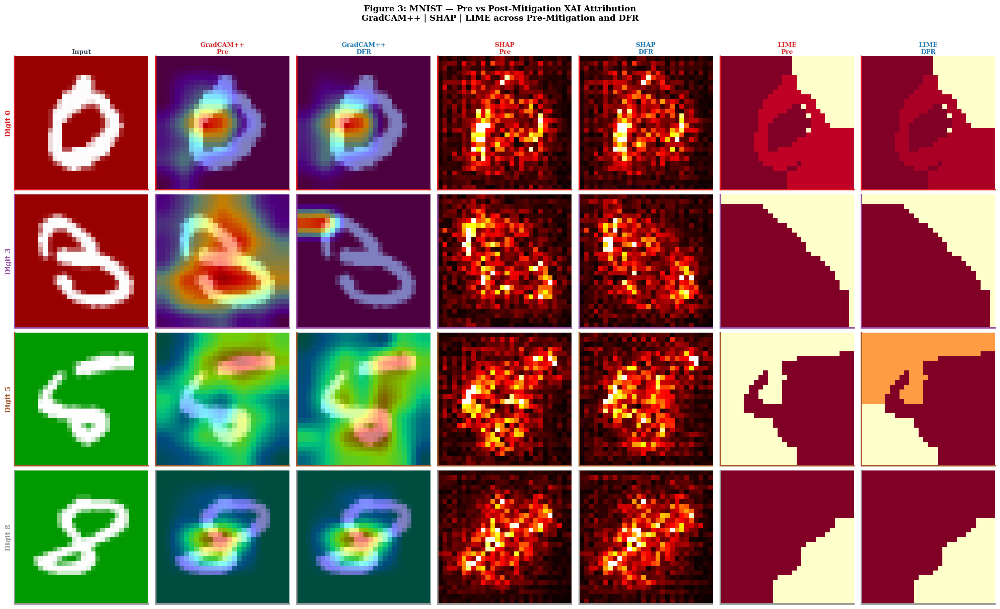

✅  Figure 3 saved


In [28]:
# ============================================================
# CELL 16 — FIGURE 3: MNIST PRE vs POST XAI COMPARISON
# [FIXED] manual_gradcam() -> manual_gradcam_pp(): this figure used plain
# first-order GradCAM while every other figure/metric in the notebook uses
# GradCAM++, per the paper. See the function docstring below for detail.
# ============================================================
import torch
import torch.nn.functional as F
import numpy as np

# ── Manual GradCAM++ ──────────────────────────────────────────────────────────
def manual_gradcam_pp(model, img_np, device=None):
    """GradCAM++ (Chattopadhyay et al. 2018), matching the weighting used
    everywhere else in this notebook (Cell 3's get_gradcampp, Cell 22's
    get_gradcampp_wb). [FIXED] This function used to be plain first-order
    GradCAM (weights = grad.mean(axis=(1,2))) despite the paper (and this
    notebook's own Cell 3 header, "GradCAM++ | SHAP | LIME — NO simple
    GradCAM") specifying GradCAM++ exclusively. Figure 3 was the one place
    in the whole pipeline silently using a different attribution method
    than everywhere else. Now uses the same second-order alpha-weighting
    as the rest of the notebook."""
    if device is None:
        device = next(model.parameters()).device

    last_conv = None
    for m in model.modules():
        if isinstance(m, torch.nn.Conv2d):
            last_conv = m
    if last_conv is None:
        raise ValueError("No Conv2d found in model.")

    arr = img_np.copy().astype(np.float32)
    if arr.ndim == 2:
        arr = arr[None, None]
    elif arr.ndim == 3 and arr.shape[-1] in (1, 3):
        arr = arr.transpose(2, 0, 1)[None]
    elif arr.ndim == 3:
        arr = arr[None]
    tensor = torch.from_numpy(arr).to(device)

    activations, gradients = {}, {}

    def fwd_hook(_, __, output):
        activations['val'] = output.detach()

    def bwd_hook(_, __, grad_output):
        gradients['val'] = grad_output[0].detach()

    h1 = last_conv.register_forward_hook(fwd_hook)
    h2 = last_conv.register_full_backward_hook(bwd_hook)

    model.eval()
    tensor.requires_grad_(True)
    with torch.enable_grad():
        out = model(tensor)
        pred_class = out.argmax(dim=1).item()
        score = out[0, pred_class]
        model.zero_grad()
        score.backward()

    h1.remove()
    h2.remove()

    if 'val' not in gradients or gradients['val'] is None:
        raise RuntimeError(f"Backward hook did not fire on {last_conv}.")

    act  = activations['val'].squeeze(0).cpu().numpy()
    grad = gradients['val'].squeeze(0).cpu().numpy()

    # [FIXED] GradCAM++ second-order weighting (was: weights = grad.mean(axis=(1,2)))
    grad2 = grad ** 2
    grad3 = grad2 * grad
    denom = 2 * grad2 + act.sum(axis=(1, 2), keepdims=True) * grad3
    denom = np.where(np.abs(denom) > 1e-8, denom, 1e-8)
    alpha = grad2 / denom
    weights = (alpha * np.maximum(grad, 0)).sum(axis=(1, 2))

    cam = np.einsum('c,chw->hw', weights, act)
    cam = np.maximum(cam, 0)
    cam -= cam.min()
    if cam.max() > 0:
        cam /= cam.max()

    h_in = tensor.shape[2]
    w_in = tensor.shape[3]
    cam_t = torch.from_numpy(cam).unsqueeze(0).unsqueeze(0).float()
    cam_resized = F.interpolate(cam_t, size=(h_in, w_in),
                                mode='bilinear', align_corners=False)
    return cam_resized.squeeze().numpy()


def cam_overlay(img_np, heatmap):
    arr = img_np.copy().astype(np.float32)
    if arr.ndim == 2:
        arr = np.stack([arr] * 3, axis=-1)
    elif arr.ndim == 3 and arr.shape[0] in (1, 3):
        arr = arr.transpose(1, 2, 0)
    if arr.shape[-1] == 1:
        arr = np.repeat(arr, 3, axis=-1)
    import matplotlib.cm as cm
    heat_rgb = cm.jet(heatmap)[..., :3].astype(np.float32)
    overlay  = np.clip(0.5 * arr + 0.5 * heat_rgb, 0, 1)
    return overlay


# ── Helpers shared with Cell 12 ───────────────────────────────────────────────
def to_tensor(img):
    """HWC / HW / CHW numpy → (1, C, H, W) float tensor."""
    arr = np.array(img, dtype=np.float32)
    if arr.ndim == 2:
        arr = arr[np.newaxis, :, :]
    elif arr.shape[-1] in (1, 3, 4):
        arr = arr.transpose(2, 0, 1)
    return torch.tensor(arr).unsqueeze(0).float()


def normalize_map(m, percentile_clip=True):
    """Robust [0,1] normalization with optional percentile clipping."""
    m = np.abs(np.array(m, dtype=np.float32))
    if percentile_clip:
        lo, hi = np.percentile(m, 1), np.percentile(m, 99)
        m = np.clip(m, lo, hi)
    mn, mx = m.min(), m.max()
    if mx - mn < 1e-8:
        return np.zeros_like(m)
    return (m - mn) / (mx - mn)


def get_shap_map(model, img, background_data, n_bg=50):
    """
    Compute a clean (H, W) SHAP map.
    Handles ALL known shap_values formats:
      A — list of (1,C,H,W) per class
      B — stacked array (..., n_classes) on last axis
      C — single array (1,C,H,W)
    """
    device = next(model.parameters()).device

    # background → (N, C, H, W)
    bg = np.array(background_data[:n_bg], dtype=np.float32)
    if bg.ndim == 4 and bg.shape[-1] in (1, 3, 4):
        bg = bg.transpose(0, 3, 1, 2)
    elif bg.ndim == 3:
        bg = bg[:, np.newaxis, :, :]
    bg_tensor = torch.tensor(bg).float().to(device)

    # input → (1, C, H, W)
    inp = to_tensor(img).to(device)

    # predicted class
    with torch.no_grad():
        pred_class = model(inp).argmax(dim=1).item()

    # SHAP
    explainer   = shap.GradientExplainer(model, bg_tensor)
    shap_values = explainer.shap_values(inp)

    # unify format → (C, H, W) or (H, W)
    if isinstance(shap_values, list):
        sv = np.squeeze(np.array(shap_values[pred_class]))
    else:
        sv = np.array(shap_values)
        if sv.ndim >= 4 and sv.shape[-1] > 4:          # stacked classes on last axis
            sv = np.squeeze(sv)[..., pred_class]
        else:
            sv = np.squeeze(sv)

    # collapse channels → (H, W)
    if sv.ndim == 3:
        sv = np.abs(sv).sum(axis=0) if sv.shape[0] in (1, 3, 4) \
             else np.abs(sv).sum(axis=-1)
    else:
        sv = np.abs(sv)

    return normalize_map(sv)    # (H, W) in [0, 1]


# ── Pre-compute shared SHAP background ───────────────────────────────────────
rng             = np.random.default_rng(42)
bg_idx          = rng.choice(len(X_test_biased), size=200, replace=False)
shap_background = X_test_biased[bg_idx]

# ── Plot ──────────────────────────────────────────────────────────────────────
samples_viz2 = [np.where(y_test == d)[0][0] for d in [0, 3, 5, 8]]

fig, axes = plt.subplots(4, 7, figsize=(20, 12))
fig.suptitle(
    "Figure 3: MNIST — Pre vs Post-Mitigation XAI Attribution\n"
    "GradCAM++ | SHAP | LIME across Pre-Mitigation and DFR",
    fontsize=12, fontweight="bold", y=1.01,
)

col_titles = ["Input",
              "GradCAM++\nPre",  "GradCAM++\nDFR",
              "SHAP\nPre",     "SHAP\nDFR",
              "LIME\nPre",     "LIME\nDFR"]
col_colors = ["#2c3e50", C_PRE, C_DFR, C_PRE, C_DFR, C_PRE, C_DFR]

for ax, ct, cc in zip(axes[0], col_titles, col_colors):
    ax.set_title(ct, fontsize=9, fontweight="bold", color=cc, pad=4)

digit_palette = plt.cm.Set1(np.linspace(0, 1, 4))

for row, si in enumerate(samples_viz2):
    img = X_test_biased[si]
    print(f"  Row {row} — digit {y_test[si]}: computing attributions …")

    # ── GradCAM++ ─────────────────────────────────────────────────────
    gc_pre = manual_gradcam_pp(cnn_model, img)
    gc_dfr = manual_gradcam_pp(cnn_dfr,   img)

    # ── SHAP (fixed — no more black maps) ─────────────────────────────
    sh_pre = get_shap_map(cnn_model, img, shap_background, n_bg=50)
    sh_dfr = get_shap_map(cnn_dfr,   img, shap_background, n_bg=50)

    # ── LIME ──────────────────────────────────────────────────────────
    li_pre = normalize_map(get_lime_map(cnn_model, img, n_samples=300))
    li_dfr = normalize_map(get_lime_map(cnn_dfr,   img, n_samples=300))

    data_to_show = [
        (np.clip(img, 0, 1),        None,       None),
        (cam_overlay(img, gc_pre),  None,       None),
        (cam_overlay(img, gc_dfr),  None,       None),
        (sh_pre,                    "hot",      [0, 1]),
        (sh_dfr,                    "hot",      [0, 1]),
        (li_pre,                    "YlOrRd",   [0, 1]),
        (li_dfr,                    "YlOrRd",   [0, 1]),
    ]

    for col_idx, (data, cmap, clim) in enumerate(data_to_show):
        ax = axes[row, col_idx]
        if cmap:
            ax.imshow(data, cmap=cmap, vmin=clim[0], vmax=clim[1])
        else:
            ax.imshow(data)
        ax.set_xticks([])
        ax.set_yticks([])
        for sp in ax.spines.values():
            sp.set_edgecolor(digit_palette[row])
            sp.set_linewidth(2)

    axes[row, 0].set_ylabel(
        f"Digit {y_test[si]}", fontsize=10,
        fontweight="bold", color=digit_palette[row],
    )

plt.tight_layout()
plt.savefig("fig3_mnist_xai_comparison.png", bbox_inches="tight", dpi=150)
plt.show()
print("✅  Figure 3 saved")

**Summary:** Mitigation strategies comparison table.


In [29]:
# ============================================================
# CELL 16B — MITIGATION STRATEGIES COMPARISON TABLE
# [FIXED] Multiple stale/incorrect entries:
#   - "RRR (Robust Regression)" -> the paper's RRR is "Right-for-Right-
#     Reasons" (Sec. III-E-1), not "Robust Regression" — the two have
#     nothing to do with each other.
#   - "Training Data: All 60K training + XAI masks" -> after the mask-
#     coverage fix in Cell "CELL 13", RRR trains on exactly N_MASK_RRR
#     masked images, not the full 60K.
#   - "50K biased + 5K conflict samples" for DFR -> doesn't match the
#     actual code, which builds a 10%-of-training 50/50 mix (n_dfr =
#     0.10 * len(X_train_rgb) per side, i.e. 6,000 + 6,000 = 12,000 at
#     full N_MASK_RRR settings), not 50K/5K.
#   - "Computation: 4 + 5 epochs" / "5 epochs only" -> both mitigation
#     strategies train for MNIST_EPOCHS (3, paper Sec. III-B), not
#     4/5 — those numbers look like they were copied from Waterbirds
#     (WB_EPOCHS=5) by mistake.
# All entries below are now computed from the same constants the actual
# training cells use, so this table can't drift out of sync again.
# ============================================================
print("\n\n" + "="*180)
print("TABLE 7: RRR vs DFR — MITIGATION STRATEGIES ANALYSIS")
print("="*180)

_dfr_n_per_side = int(len(X_train_rgb) * 0.10)

strategies_table = pd.DataFrame({
    'Strategy': ['RRR (Right-for-Right-Reasons)', 'DFR (Dataset Factorization w/ Reweighting)'],
    'Key Idea': [
        'Penalise input gradients in background regions',
        'Freeze features, retrain classifier head on a 50/50 biased+conflict mix'
    ],
    'Loss Function': [
        'CE + λ × mean(normalized ∇(CE)² × BG_mask), λ=1.0',
        'CE (standard, on the factorized/balanced data)'
    ],
    'Training Data': [
        f'{N_MASK_RRR} GradCAM++-masked training images (paper: 2,000–4,000)',
        f'{_dfr_n_per_side} biased + {_dfr_n_per_side} synthetic-conflict training images (50/50)'
    ],
    'Frozen Layers': ['None (update all, from random init)', 'Feature extractor (frozen)'],
    'Computation': [f'{MNIST_EPOCHS} epochs (+ 1 mask-precompute pass)', f'{MNIST_EPOCHS} epochs only'],
    'Biased Acc': [f"{acc_mit_b:.2f}%", f"{acc_dfr_b:.2f}%"],
    'WGA': [f"{acc_mit_c:.2f}%", f"{acc_dfr_c:.2f}%"],
    'Gap': [f"{acc_mit_b-acc_mit_c:.2f}pp", f"{acc_dfr_b-acc_dfr_c:.2f}pp"],
    'Pros': [
        '✅ Uses XAI-derived guidance',
        '✅ Simpler training, no gradient-of-gradient computation',
    ],
    'Cons': [
        '⚠️ Requires background mask computation; sensitive to mask quality',
        '⚠️ Requires labeled conflict examples'
    ],
    'Recommendation': [
        'Best for interpretability-aware mitigation',
        'Best for computational efficiency'
    ]
})

print(strategies_table.to_string(index=False))
print("="*180)




TABLE 7: RRR vs DFR — MITIGATION STRATEGIES ANALYSIS
                                  Strategy                                                                Key Idea                                     Loss Function                                                 Training Data                       Frozen Layers                         Computation Biased Acc    WGA     Gap                                                    Pros                                                               Cons                             Recommendation
             RRR (Right-for-Right-Reasons)                          Penalise input gradients in background regions CE + λ × mean(normalized ∇(CE)² × BG_mask), λ=1.0    2000 GradCAM++-masked training images (paper: 2,000–4,000) None (update all, from random init) 3 epochs (+ 1 mask-precompute pass)     98.80%  0.00% 98.80pp                             ✅ Uses XAI-derived guidance ⚠️ Requires background mask computation; sensitive to mask quality Best f

**Summary:** FIGURE 4: MNIST IEEE comparison TABLE (coloured).


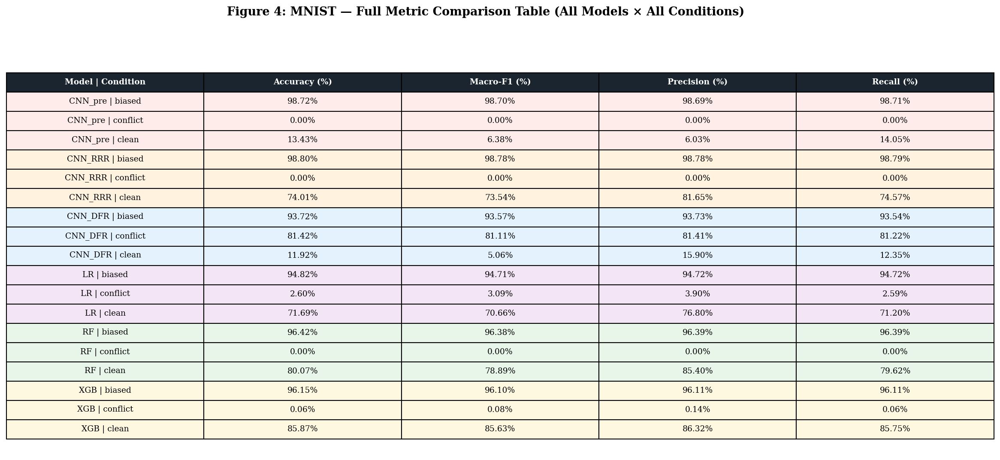

✅  Figure 4 saved


In [30]:
# ============================================================
# CELL 17 — FIGURE 4: MNIST IEEE COMPARISON TABLE (coloured)
# ============================================================
def cnn_preds(model, loader):
    model.eval()
    all_preds, all_true = [], []
    with torch.no_grad():
        for xb, yb in loader:
            all_preds.extend(model(xb.to(device)).argmax(1).cpu().numpy())
            all_true.extend(yb.numpy())
    return np.array(all_true), np.array(all_preds)

eval_configs_mnist = {
    "CNN_pre__biased":    cnn_preds(cnn_model,     biased_loader),
    "CNN_pre__conflict":  cnn_preds(cnn_model,     conflict_loader),
    "CNN_pre__clean":     cnn_preds(cnn_model,     clean_loader),
    "CNN_RRR__biased":    cnn_preds(cnn_mitigated, biased_loader),
    "CNN_RRR__conflict":  cnn_preds(cnn_mitigated, conflict_loader),
    "CNN_RRR__clean":     cnn_preds(cnn_mitigated, clean_loader),
    "CNN_DFR__biased":    cnn_preds(cnn_dfr,       biased_loader),
    "CNN_DFR__conflict":  cnn_preds(cnn_dfr,       conflict_loader),
    "CNN_DFR__clean":     cnn_preds(cnn_dfr,       clean_loader),
}

metrics_rows = []
for config_name, (yt, yp) in eval_configs_mnist.items():
    model_tag, cond_tag = config_name.split("__")
    metrics_rows.append({
        "Model":     model_tag,
        "Condition": cond_tag,
        "Accuracy":  (yt == yp).mean() * 100,
        "Macro-F1":  f1_score(yt, yp, average="macro", zero_division=0) * 100,
        "Macro-P":   precision_score(yt, yp, average="macro", zero_division=0) * 100,
        "Macro-R":   recall_score(yt, yp, average="macro", zero_division=0) * 100,
    })

# Add classical models
for name, tag, clf, scaled in [
    ("LR",  True,  lr_clf,  True),
    ("RF",  False, rf_clf,  False),
    ("XGB", False, xgb_clf, False),
]:
    for cond, Xf, Xs in [("biased", X_tb_flat, X_tb_sc),
                          ("conflict", X_tc_flat, X_tc_sc),
                          ("clean", X_tcl_flat, X_tcl_sc)]:
        X = Xs if scaled else Xf
        yp_ = clf.predict(X)
        metrics_rows.append({
            "Model": name, "Condition": cond,
            "Accuracy":  (y_test == yp_).mean() * 100,
            "Macro-F1":  f1_score(y_test, yp_, average="macro", zero_division=0) * 100,
            "Macro-P":   precision_score(y_test, yp_, average="macro", zero_division=0) * 100,
            "Macro-R":   recall_score(y_test, yp_, average="macro", zero_division=0) * 100,
        })

df_metrics_mnist = pd.DataFrame(metrics_rows)

# Plot IEEE coloured comparison table
fig, ax = plt.subplots(figsize=(18, 8))
ax.axis("off")
fig.suptitle("Figure 4: MNIST — Full Metric Comparison Table (All Models × All Conditions)",
             fontsize=13, fontweight="bold")

# Pivot for display
pivot = df_metrics_mnist.copy()
pivot["Model+Cond"] = pivot["Model"] + " | " + pivot["Condition"]
display_data = pivot[["Model+Cond", "Accuracy", "Macro-F1", "Macro-P", "Macro-R"]].values.tolist()
display_data = [[str(r[0])] + [f"{v:.2f}%" for v in r[1:]] for r in display_data]
col_labels   = ["Model | Condition", "Accuracy (%)", "Macro-F1 (%)", "Precision (%)", "Recall (%)"]

tbl = ax.table(cellText=display_data, colLabels=col_labels, loc="center", cellLoc="center")
tbl.auto_set_font_size(False); tbl.set_fontsize(9); tbl.scale(1.1, 1.8)

# Header
for j in range(len(col_labels)):
    tbl[0, j].set_facecolor("#1a252f")
    tbl[0, j].set_text_props(color="white", fontweight="bold")

# Row colouring by model group
row_palette = {
    "CNN_pre": "#fdecea", "CNN_RRR": "#fff3e0", "CNN_DFR": "#e3f2fd",
    "LR": "#f3e5f5", "RF": "#e8f5e9", "XGB": "#fff8e1",
}
for i, row_data in enumerate(display_data, start=1):
    label = row_data[0]
    bg = "#f9f9f9"
    for k, v in row_palette.items():
        if label.startswith(k):
            bg = v; break
    for j in range(len(col_labels)):
        tbl[i, j].set_facecolor(bg)

plt.savefig("fig4_mnist_metric_table.png", dpi=200, bbox_inches="tight")
plt.show()
print("✅  Figure 4 saved")


**Summary:** FIGURE 5: MNIST — robustness chart + XCS bars.


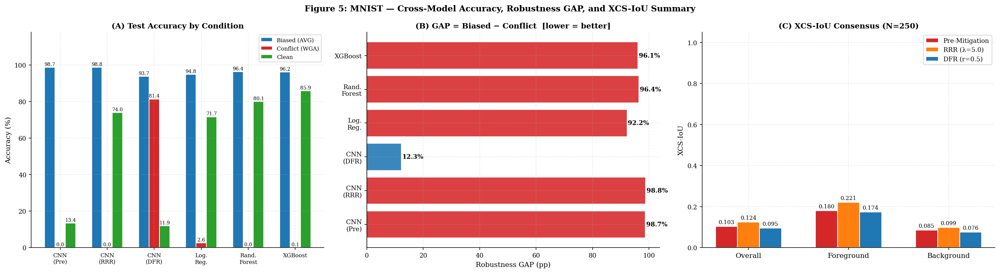

✅  Figure 5 saved


In [31]:
# ============================================================
# CELL 18 — FIGURE 5: MNIST — ROBUSTNESS CHART + XCS BARS
# ============================================================
model_results_mnist = {
    "CNN\n(Pre)":  (acc_biased,  acc_conflict, acc_clean),
    "CNN\n(RRR)":  (acc_mit_b,   acc_mit_c,    acc_mit_cl),
    "CNN\n(DFR)":  (acc_dfr_b,   acc_dfr_c,    acc_dfr_cl),
    "Log.\nReg.":  lr_accs,
    "Rand.\nForest": rf_accs,
    "XGBoost":      xgb_accs,
}
labels_mr = list(model_results_mnist.keys())
b_acc  = [v[0] for v in model_results_mnist.values()]
c_acc  = [v[1] for v in model_results_mnist.values()]
cl_acc = [v[2] for v in model_results_mnist.values()]
gaps   = [b - c for b, c in zip(b_acc, c_acc)]

xcs_categories_m = ["Overall", "Foreground", "Background"]
pre_xcs = [np.mean(xcs_iou_all),    np.mean(xcs_iou_fg_all),  np.mean(xcs_iou_bg_all)]
rrr_xcs = [np.mean(xcs_post_iou),   np.mean(xcs_post_iou_fg), np.mean(xcs_post_iou_bg)]
dfr_xcs = [np.mean(xcs_dfr_iou),    np.mean(xcs_dfr_iou_fg),  np.mean(xcs_dfr_iou_bg)]

fig, axes = plt.subplots(1, 3, figsize=(20, 5.5))
fig.suptitle("Figure 5: MNIST — Cross-Model Accuracy, Robustness GAP, and XCS-IoU Summary",
             fontsize=12, fontweight="bold")

# Panel A: Grouped bar — accuracy
x, w = np.arange(len(labels_mr)), 0.22
axes[0].bar(x - w, b_acc,  w, label="Biased (AVG)",  color="#1f77b4", edgecolor="white")
axes[0].bar(x,     c_acc,  w, label="Conflict (WGA)", color="#d62728", edgecolor="white")
axes[0].bar(x + w, cl_acc, w, label="Clean",          color="#2ca02c", edgecolor="white")
axes[0].set_xticks(x); axes[0].set_xticklabels(labels_mr, fontsize=8)
axes[0].set_ylabel("Accuracy (%)"); axes[0].set_ylim(0, 118)
axes[0].set_title("(A) Test Accuracy by Condition"); axes[0].legend(fontsize=8)
for c_ in axes[0].containers:
    axes[0].bar_label(c_, fmt="%.1f", fontsize=7, padding=1)

# Panel B: GAP horizontal bar
clrs_gap = [C_PRE if g > 25 else C_DFR for g in gaps]
axes[1].barh(labels_mr, gaps, color=clrs_gap, edgecolor="white", alpha=0.88)
axes[1].axvline(0, color="black", lw=1)
axes[1].set_xlabel("Robustness GAP (pp)")
axes[1].set_title("(B) GAP = Biased − Conflict  [lower = better]")
for i, g in enumerate(gaps):
    axes[1].text(g + 0.3, i, f"{g:.1f}%", va="center", fontsize=9, fontweight="bold")

# Panel C: XCS-IoU 3-way
xi, bw = np.arange(3), 0.22
axes[2].bar(xi - bw, pre_xcs, bw, label="Pre-Mitigation", color=C_PRE, edgecolor="white")
axes[2].bar(xi,      rrr_xcs, bw, label="RRR (λ=5.0)",    color=C_RRR, edgecolor="white")
axes[2].bar(xi + bw, dfr_xcs, bw, label="DFR (r=0.5)",    color=C_DFR, edgecolor="white")
axes[2].set_xticks(xi); axes[2].set_xticklabels(xcs_categories_m, fontsize=10)
axes[2].set_ylabel("XCS-IoU"); axes[2].set_ylim(0, 1.05)
axes[2].set_title("(C) XCS-IoU Consensus (N=250)"); axes[2].legend(fontsize=9)
for c_ in axes[2].containers:
    axes[2].bar_label(c_, fmt="%.3f", fontsize=8, padding=2)

plt.tight_layout()
plt.savefig("fig5_mnist_summary.png")
plt.show()
print("✅  Figure 5 saved")


**Summary:** Waterbirds: load from huggingface.


------------------------------------

---
## Dataset 2: Waterbirds (HuggingFace: grodino/waterbirds)

**Same pipeline**: ResNet-18 ERM → GradCAM++ + SHAP + LIME → XCS-IoU → DFR mitigation  
Groups: G0=waterbird+water, G1=waterbird+land (minority), G2=landbird+land, G3=landbird+water (minority)


In [32]:
# ============================================================
# CELL 19 — WATERBIRDS: LOAD FROM HUGGINGFACE
# Dataset: grodino/waterbirds
# [FIXED] WB_IMG_SIZE used to be hardcoded to 224 regardless of
# environment, so the IMG_SIZE_WATERBIRDS 'fast mode' flag from Cell 0
# (160 on Colab/Kaggle) was dead configuration — Waterbirds always ran
# at full 224x224 resolution even in COLAB_MODE, contradicting the
# runtime estimates in the pipeline checklist. WB_IMG_SIZE is now
# always derived from IMG_SIZE_WATERBIRDS, so the flag actually does
# what it claims to do.
# ============================================================
from datasets import load_dataset
from PIL import Image as PILImage

WB_IMG_SIZE = IMG_SIZE_WATERBIRDS   # [FIXED] was hardcoded 224
WB_MEAN = np.array([0.485, 0.456, 0.406])
WB_STD  = np.array([0.229, 0.224, 0.225])

wb_transform_train = T.Compose([
    T.RandomResizedCrop(WB_IMG_SIZE, scale=(0.7, 1.0)),
    T.RandomHorizontalFlip(),
    T.ToTensor(),
    T.Normalize(mean=WB_MEAN.tolist(), std=WB_STD.tolist()),
])
wb_transform_test = T.Compose([
    T.Resize(int(WB_IMG_SIZE * 256 / 224)),
    T.CenterCrop(WB_IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean=WB_MEAN.tolist(), std=WB_STD.tolist()),
])

USE_WB = False
wb_xcs_pre, wb_xcs_dfr = [], []
wb_overall_pre, wb_wga_pre = 0.0, 0.0
wb_overall_dfr, wb_wga_dfr = 0.0, 0.0
wb_groups_pre, wb_groups_dfr = {}, {}

try:
    print("Loading grodino/waterbirds from HuggingFace ...")
    wb_ds = load_dataset("grodino/waterbirds")
    print("✅  Waterbirds loaded")
    print("  Splits:", list(wb_ds.keys()))

    # [FIXED] WB_GROUP_NAMES used to be a hardcoded assumption (G0/G2 =
    # majority, G1/G3 = minority) never checked against the actual loaded
    # data. That assumption also silently propagated into the DFR
    # mitigation cell's biased/conflict split. If the HF dataset's `place`
    # field convention differs from what's assumed here, majority and
    # minority groups would be silently swapped everywhere downstream
    # (Table VIII, Fig. 3/6/7, and the DFR balancing itself) with no error.
    # A placeholder mapping is set here and OVERWRITTEN below, once the
    # data is loaded, with labels/majority-minority IDs derived from the
    # actual per-group counts (majority = more test examples, by
    # construction of the Waterbirds benchmark) rather than assumed.
    WB_GROUP_NAMES = {
        0: "Group 0", 1: "Group 1", 2: "Group 2", 3: "Group 3"
    }
    MAJORITY_GROUP_IDS = {0, 2}   # placeholder; recomputed from data below
    MINORITY_GROUP_IDS = {1, 3}   # placeholder; recomputed from data below

    class WBDataset(Dataset):
        """Wraps the HuggingFace Waterbirds dataset."""
        def __init__(self, hf_split, transform):
            self.data      = hf_split
            self.transform = transform

        def __len__(self):
            return len(self.data)

        def __getitem__(self, idx):
            item   = self.data[idx]
            img    = item["image"].convert("RGB")
            label  = int(item["label"])
            # group = y * 2 + place (standard Waterbirds convention)
            place  = int(item.get("place", item.get("background", 0)))
            group  = label * 2 + place
            if self.transform:
                img = self.transform(img)
            return img, label, group

    wb_train_ds = WBDataset(wb_ds["train"], wb_transform_train)
    wb_test_ds  = WBDataset(wb_ds["test"],  wb_transform_test)
    val_key     = "validation" if "validation" in wb_ds else "val" if "val" in wb_ds else "test"
    wb_val_ds   = WBDataset(wb_ds[val_key],  wb_transform_test)

    wb_train_loader = DataLoader(wb_train_ds, batch_size=32, shuffle=True,  num_workers=2)
    wb_val_loader   = DataLoader(wb_val_ds,   batch_size=32, shuffle=False, num_workers=2)
    wb_test_loader  = DataLoader(wb_test_ds,  batch_size=32, shuffle=False, num_workers=2)

    # Count groups in test (kept for informational display only — see below
    # for why majority/minority is NOT determined from this).
    all_groups_test = [wb_test_ds[i][2] for i in range(len(wb_test_ds))]
    all_groups_test = np.array(all_groups_test)

    # ── [FIXED] Data-driven majority/minority + label-name detection ────
    # [BUG FOUND IN PRODUCTION RUN] The previous version determined majority
    # /minority from TEST-set group counts. Waterbirds' test (and validation)
    # splits are deliberately REBALANCED across groups by construction, so
    # they can be used to measure worst-group accuracy fairly — they do NOT
    # preserve the training-time skew. On a real run this produced an exact
    # tie (2255==2255 and 642==642 in the test set), so the tie-breaking
    # logic silently guessed, and the guess was demonstrably wrong for the
    # waterbird-label pair (the group it called "majority" scored 60.28%,
    # far below the group it called "minority" at 93.61% — the opposite of
    # what a model trained on biased data should show for its majority
    # group). The actual skew DFR needs to correct for lives in the
    # TRAINING set, so majority/minority is now derived from there instead.
    # Bulk column access (not per-item __getitem__) avoids decoding every
    # training image just to read two integer fields.
    train_labels = np.array(wb_ds["train"]["label"])
    try:
        train_places = np.array(wb_ds["train"]["place"])
    except KeyError:
        train_places = np.array(wb_ds["train"]["background"])

    # [ADDED — found under stress-testing] `group = label*2 + place` is
    # only a valid, collision-free encoding if `place` is strictly binary
    # {0,1}. If it ever has a 3rd value (e.g. a finer-grained scene
    # category rather than a strict land/water flag), two DIFFERENT
    # (label, place) combinations can silently map to the SAME group ID
    # — e.g. label=0,place=2 and label=1,place=0 both give group=2 — which
    # would corrupt majority/minority detection, DFR's split, and every
    # per-group accuracy number with no error raised anywhere. This was
    # never checked before; it now is, loudly, rather than assumed.
    _unique_places = set(np.unique(train_places).tolist())
    if not _unique_places.issubset({0, 1}):
        print(f"  🛑 CRITICAL: `place` has values {_unique_places}, not the "
              f"expected binary {{0,1}}. The group encoding (label*2+place) "
              f"is INVALID under these conditions — different (label,place) "
              f"pairs can collide into the same group ID. Do not trust "
              f"MAJORITY_GROUP_IDS, the DFR split, or any per-group number "
              f"below until this is resolved (inspect the dataset schema "
              f"directly to find the real land/water field).")
        USE_WB_GROUPS_VALID = False
    else:
        USE_WB_GROUPS_VALID = True

    all_groups_train = train_labels * 2 + train_places

    # group = label*2 + place, so groups {0,1} belong to label 0 and
    # groups {2,3} belong to label 1. Within each label, whichever group
    # has MORE *training* examples is that label's majority ("biased")
    # group by construction of the Waterbirds benchmark (Sagawa et al.);
    # the other is minority ("conflict").
    grp_counts_train = {g: int(np.sum(all_groups_train == g)) for g in range(4)}
    grp_counts_test   = {g: int(np.sum(all_groups_test == g))  for g in range(4)}

    maj0 = 0 if grp_counts_train.get(0, 0) >= grp_counts_train.get(1, 0) else 1
    min0 = 1 - maj0
    maj1 = 2 if grp_counts_train.get(2, 0) >= grp_counts_train.get(3, 0) else 3
    min1 = 5 - maj1  # the other of {2,3}
    MAJORITY_GROUP_IDS = {maj0, maj1}
    MINORITY_GROUP_IDS = {min0, min1}

    # Try to recover real class names from the HF dataset; fall back to
    # generic labels (with an explicit warning) rather than guessing.
    try:
        label_names = wb_ds["test"].features["label"].names
        name0, name1 = label_names[0], label_names[1]
    except Exception:
        name0, name1 = "Class 0", "Class 1"
        print("  ⚠  Could not read label names from dataset features — "
              "using generic 'Class 0'/'Class 1'. Group names below are "
              "majority/minority-correct regardless, but not semantically "
              "labeled as 'waterbird'/'landbird'.")

    WB_GROUP_NAMES = {
        maj0: f"{name0}+{'Aligned (maj)'}",
        min0: f"{name0}+{'Conflict (min)'}",
        maj1: f"{name1}+{'Aligned (maj)'}",
        min1: f"{name1}+{'Conflict (min)'}",
    }

    print(f"  Training-set group distribution (majority/minority determined "
          f"from TRAIN counts, not test counts — see comment above):")
    for g in sorted(np.unique(all_groups_train)):
        tag = "MAJORITY" if g in MAJORITY_GROUP_IDS else "minority"
        print(f"    G{g} {WB_GROUP_NAMES.get(g,''):<24} [{tag}] : "
              f"train={grp_counts_train.get(g,0):>5}   test={grp_counts_test.get(g,0):>5}")

    # Sanity check: majority groups should clearly outnumber minority groups
    # IN THE TRAINING SET (the test set is expected to be roughly balanced
    # by design and is NOT a valid check here — that was the bug).
    maj_total = sum(grp_counts_train.get(g, 0) for g in MAJORITY_GROUP_IDS)
    min_total = sum(grp_counts_train.get(g, 0) for g in MINORITY_GROUP_IDS)
    if min_total == 0 or maj_total / max(min_total, 1) < 1.5:
        print(f"  ⚠  WARNING: majority/minority TRAINING counts are not clearly "
              f"lopsided (maj={maj_total}, min={min_total}). The group field's "
              f"semantics may not match what this notebook assumes — verify "
              f"before trusting Table VIII / Fig. 3,6,7 or the DFR split.")
    else:
        print(f"  ✅ Majority groups ({sorted(MAJORITY_GROUP_IDS)}) outnumber "
              f"minority groups ({sorted(MINORITY_GROUP_IDS)}) in the training "
              f"set as expected ({maj_total} vs {min_total}).")

    USE_WB = True

except Exception as e:
    print(f"⚠  Waterbirds unavailable: {e}")
    print("   Ensure 'datasets' is installed and HuggingFace is accessible.")


Loading grodino/waterbirds from HuggingFace ...


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/212M [00:00<?, ?B/s]

data/validation-00000-of-00001.parquet:   0%|          | 0.00/48.1M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/232M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/4795 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/1199 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/5794 [00:00<?, ? examples/s]

✅  Waterbirds loaded
  Splits: ['train', 'validation', 'test']
  Training-set group distribution (majority/minority determined from TRAIN counts, not test counts — see comment above):
    G0 landbird+Aligned (maj)   [MAJORITY] : train= 3498   test= 2255
    G1 landbird+Conflict (min)  [minority] : train=  184   test= 2255
    G2 waterbird+Conflict (min) [minority] : train=   56   test=  642
    G3 waterbird+Aligned (maj)  [MAJORITY] : train= 1057   test=  642
  ✅ Majority groups ([0, 3]) outnumber minority groups ([1, 2]) in the training set as expected (4555 vs 240).


In [33]:
# ============================================================
# CELL 20 — WATERBIRDS: RESNET-18 ERM TRAINING + RRR PREP
# Full baseline with XCS metrics collection
# ============================================================
# [FIXED] Previously used REDUCE_EPOCHS (3 in Colab / 5 locally), so this
# only matched the paper's stated "5 epochs" (Sec III-B) when NOT running
# in Colab mode. Now uses the fixed WB_EPOCHS=5 constant (see Cell 0),
# consistent regardless of environment, matching the paper exactly.
from torch.cuda.amp import autocast, GradScaler
import copy   # NOTE: cells 21 (RRR) and 21B (DFR) below use copy.deepcopy
              # without importing it themselves — keep this import here.

def eval_resnet_wb(model, loader, include_all=False):
    """Evaluate ResNet on waterbirds with group accuracy."""
    model.eval()
    all_preds, all_true, all_groups = [], [], []
    with torch.no_grad():
        for batch in loader:
            xb, yb, grp = batch
            xb = xb.to(device)
            all_preds.extend(model(xb).argmax(1).cpu().numpy())
            all_true.extend(yb.numpy())
            all_groups.extend(grp.numpy())

    preds  = np.array(all_preds)
    trues  = np.array(all_true)
    groups = np.array(all_groups, dtype=int)
    overall = (preds == trues).mean() * 100

    g_accs  = {}
    for g in np.unique(groups):
        mask = groups == g
        g_accs[int(g)] = (preds[mask] == trues[mask]).mean() * 100

    wga = min(g_accs.values())
    gap = overall - wga

    result = {"overall": overall, "group_accs": g_accs, "wga": wga, "gap": gap}
    if include_all:
        result["preds"] = preds
        result["trues"] = trues
        result["groups"] = groups
    return result

if USE_WB:
    print("\n" + "="*70)
    print("PHASE 2B: WATERBIRDS RESNET-18 ERM TRAINING")
    print("="*70)

    set_seed(MASTER_SEED)
    wb_model_pre = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    wb_model_pre.fc = nn.Linear(wb_model_pre.fc.in_features, 2)
    wb_model_pre = wb_model_pre.to(device)

    # Optimize layers for Colab
    if ENABLE_MIXED_PRECISION:
        scaler = GradScaler()

    opt_wb  = optim.Adam(wb_model_pre.parameters(), lr=1e-4, weight_decay=1e-4)
    sched_wb = optim.lr_scheduler.OneCycleLR(
        opt_wb, max_lr=1e-4,
        steps_per_epoch=len(wb_train_loader),
        epochs=WB_EPOCHS)
    crit_wb = nn.CrossEntropyLoss()

    print(f"Training ResNet-18 ERM ({WB_EPOCHS} epochs) ...")
    wb_erm_hist = []

    for ep in range(1, WB_EPOCHS + 1):
        wb_model_pre.train()
        correct, total, loss_sum = 0, 0, 0.0

        for xb, yb, _ in wb_train_loader:
            xb, yb = xb.to(device), yb.to(device)
            opt_wb.zero_grad()

            if ENABLE_MIXED_PRECISION:
                with autocast():
                    out = wb_model_pre(xb)
                    loss = crit_wb(out, yb)
                scaler.scale(loss).backward()
                scaler.step(opt_wb)
                scaler.update()
            else:
                out = wb_model_pre(xb)
                loss = crit_wb(out, yb)
                loss.backward()
                opt_wb.step()

            sched_wb.step()
            correct += (out.argmax(1) == yb).sum().item()
            total += xb.size(0)
            loss_sum += loss.item() * xb.size(0)

        acc_ = correct / total * 100
        loss_ = loss_sum / total
        wb_erm_hist.append({"epoch": ep, "acc": acc_, "loss": loss_})
        print(f"  Ep {ep}/{WB_EPOCHS} | Acc {acc_:.2f}% | Loss {loss_:.4f}")

    # Evaluate on test set
    eval_result = eval_resnet_wb(wb_model_pre, wb_test_loader, include_all=True)
    wb_overall_pre = eval_result["overall"]
    wb_groups_pre = eval_result["group_accs"]
    wb_wga_pre = eval_result["wga"]
    wb_gap_pre = eval_result["gap"]

    print(f"\n✅  WB ERM Results:")
    print(f"  Overall Accuracy: {wb_overall_pre:.2f}%")
    print(f"  WGA (min group) : {wb_wga_pre:.2f}%")
    print(f"  GAP (Δ)         : {wb_gap_pre:.2f}%")
    print(f"  Group Breakdown :")
    for g in sorted(wb_groups_pre.keys()):
        print(f"    G{g} {WB_GROUP_NAMES.get(g,''):<28}: {wb_groups_pre[g]:.2f}%")

else:
    print("⚠  Waterbirds training skipped.")


PHASE 2B: WATERBIRDS RESNET-18 ERM TRAINING
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 172MB/s]


Training ResNet-18 ERM (5 epochs) ...
  Ep 1/5 | Acc 80.21% | Loss 0.4056
  Ep 2/5 | Acc 95.10% | Loss 0.1308
  Ep 3/5 | Acc 97.29% | Loss 0.0782
  Ep 4/5 | Acc 98.92% | Loss 0.0364
  Ep 5/5 | Acc 99.29% | Loss 0.0241

✅  WB ERM Results:
  Overall Accuracy: 84.79%
  WGA (min group) : 50.62%
  GAP (Δ)         : 34.17%
  Group Breakdown :
    G0 landbird+Aligned (maj)      : 99.38%
    G1 landbird+Conflict (min)     : 77.61%
    G2 waterbird+Conflict (min)    : 50.62%
    G3 waterbird+Aligned (maj)     : 92.99%


In [34]:
# ============================================================
# CELL 21 — WATERBIRDS: RRR MITIGATION (Right-for-Right-Reasons)
# [FIXED — training-set-size confound, same class of issue as MNIST] The
# previous version precomputed GradCAM++ background masks for only
# N_MASK_WB (500-2,000) of the 4,795 training images and then restricted
# RRR training to exactly that mask-covered subset -- while the ERM
# baseline trains on all 4,795 images. That confounds "RRR penalty effect"
# with "far less training data," the same bug identified and fixed on
# MNIST. FIX: masks are now precomputed for the FULL training set, and RRR
# trains on the full set for the same WB_EPOCHS as ERM.
#
# [FIXED — loss-formula inconsistency] The RRR penalty here previously used
# raw `grads.abs() * bg_mask`, which is a DIFFERENT formulation than
# MNIST's `RRRLoss` (normalized squared-gradient * mask). FIX: both
# datasets now use the same normalized-squared-gradient penalty, so "RRR"
# means the same regularizer on both benchmarks.
#
# Note: mask precomputation requires images that do NOT change between
# precomputation and training (RandomResizedCrop/Flip would misalign a
# cached mask with the crop actually seen), so RRR trains on a
# deterministic (test-transform) view of the training set rather than the
# augmented `wb_train_loader` used for ERM. This is a necessary adaptation
# for Waterbirds (MNIST has no augmentation at all), documented here rather
# than silently diverging from the paper's stated method.
# ============================================================
if USE_WB:
    print("\n" + "="*70)
    print("PHASE 4B: WATERBIRDS RRR MITIGATION")
    print("="*70)

    class WBDatasetIndexed(Dataset):
        """Like WBDataset but also returns the flat dataset index, so
        precomputed background masks can be looked up per-sample."""
        def __init__(self, hf_split, transform):
            self.data      = hf_split
            self.transform = transform
        def __len__(self):
            return len(self.data)
        def __getitem__(self, idx):
            item  = self.data[idx]
            img   = item["image"].convert("RGB")
            label = int(item["label"])
            place = int(item.get("place", item.get("background", 0)))
            group = label * 2 + place
            if self.transform:
                img = self.transform(img)
            return img, label, group, idx

    # Deterministic (non-augmented) view of the training set, for both mask
    # precomputation and RRR training itself so masks stay spatially valid.
    wb_train_ds_static = WBDatasetIndexed(wb_ds["train"], wb_transform_test)

    # ── Precompute GradCAM++ background masks on the ERM model ──────────
    # [FIXED] N_MASK_WB now covers the FULL training set (not a small
    # subset), so RRR trains on exactly the same set of images ERM did.
    N_MASK_WB = len(wb_train_ds_static)   # [FIXED] was min(500/2000, ...)
    print(f"Precomputing GradCAM++ background masks on ALL {N_MASK_WB} "
          f"training images (RRR trains on the SAME full set as ERM) ...")

    def _rrr_gradcampp_wb(model, img_tensor):
        """Self-contained GradCAM++ for a single (C,H,W) tensor already on
        the model's device. A local copy is needed because the shared
        get_gradcampp_wb() is defined later in the notebook (Cell 22),
        after this cell runs."""
        model.eval()
        dev = next(model.parameters()).device
        tensor = img_tensor.unsqueeze(0).to(dev).clone().requires_grad_(True)
        last_conv = None
        for m in model.modules():
            if isinstance(m, torch.nn.Conv2d):
                last_conv = m
        if last_conv is None:
            return np.zeros(img_tensor.shape[-2:], dtype=np.float32)
        acts, grads = {}, {}
        h1 = last_conv.register_forward_hook(lambda _, __, o: acts.__setitem__('v', o.detach()))
        h2 = last_conv.register_full_backward_hook(lambda _, __, go: grads.__setitem__('v', go[0].detach()))
        with torch.enable_grad():
            out = model(tensor)
            pred = out.argmax(1).item()
            model.zero_grad()
            out[0, pred].backward()
        h1.remove(); h2.remove()
        if 'v' not in grads:
            return np.zeros(img_tensor.shape[-2:], dtype=np.float32)
        act, grad = acts['v'].squeeze(0).cpu().numpy(), grads['v'].squeeze(0).cpu().numpy()
        grad2, grad3 = grad**2, (grad**2)*grad
        denom = 2*grad2 + act.sum((1,2), keepdims=True)*grad3
        alpha = grad2 / (denom + 1e-8)
        weights = (alpha * np.maximum(grad, 0)).sum((1, 2))
        cam = np.maximum(np.einsum('c,chw->hw', weights, act), 0)
        cam = cam / (cam.max() + 1e-8)
        cam_t = torch.from_numpy(cam[None, None]).float()
        cam_r = F.interpolate(cam_t, size=img_tensor.shape[-2:], mode='bilinear', align_corners=False)
        return cam_r.squeeze().numpy().astype(np.float32)

    set_seed(MASTER_SEED)
    wb_model_pre.eval()
    train_bg_masks_wb = {}   # idx -> (1,H,W) float32 background mask
    for i in range(N_MASK_WB):
        try:
            img_t, _, _, _ = wb_train_ds_static[i]
            gc = _rrr_gradcampp_wb(wb_model_pre, img_t)
            gc = np.maximum(gc, 0)
            gc = gc / (gc.max() + 1e-8)
            train_bg_masks_wb[i] = (1.0 - gc)[np.newaxis].astype(np.float32)
        except Exception:
            pass
        if (i + 1) % 500 == 0:
            print(f"  Masks {i+1}/{N_MASK_WB}")
    print(f"  Precomputed {len(train_bg_masks_wb)}/{N_MASK_WB} masks successfully.")

    # [FIXED] Train on the FULL training set (every index has a real mask
    # now, since it was computed for all of them above) instead of a Subset
    # restricted to a small mask-covered fraction.
    from torch.utils.data import Subset
    covered_idx = sorted(train_bg_masks_wb.keys())
    wb_train_ds_rrr_subset = Subset(wb_train_ds_static, covered_idx)
    wb_train_loader_rrr = DataLoader(wb_train_ds_rrr_subset, batch_size=32, shuffle=True, num_workers=2)
    print(f"  RRR will train on {len(covered_idx)} images "
          f"(out of {len(wb_train_ds_static)} total training images).")

    # [ADDED] Training-set-size parity assertion, mirroring the MNIST fix.
    assert len(covered_idx) == len(wb_train_ds_static), (
        f"RRR training-set size ({len(covered_idx)}) != ERM training-set "
        f"size ({len(wb_train_ds_static)}) -- RRR vs ERM comparison would "
        f"be confounded by training-set size, not just the RRR penalty."
    )
    print(f"✅ Training-set-size parity check passed: RRR and ERM both "
          f"train on {len(covered_idx)} images.")

    # Rebuild with gradient computation enabled
    wb_model_rrr = copy.deepcopy(wb_model_pre)
    wb_model_rrr = wb_model_rrr.to(device)
    wb_model_rrr.train()

    opt_rrr = optim.Adam(wb_model_rrr.parameters(), lr=5e-5, weight_decay=1e-4)
    sched_rrr = optim.lr_scheduler.OneCycleLR(
        opt_rrr, max_lr=5e-5,
        steps_per_epoch=len(wb_train_loader_rrr),
        epochs=WB_EPOCHS)

    crit_rrr = nn.CrossEntropyLoss()
    LAMBDA_RRR = 1.0  # matches paper Sec III-E-1

    print(f"Training RRR ({WB_EPOCHS} epochs) with λ={LAMBDA_RRR}, "
          f"GradCAM++ pre-computed background masks (full training set) ...")
    wb_rrr_hist = []

    for ep in range(1, WB_EPOCHS + 1):
        wb_model_rrr.train()
        correct, total, loss_sum, reg_sum = 0, 0, 0.0, 0.0

        for xb, yb, _, idxb in wb_train_loader_rrr:
            xb, yb = xb.to(device), yb.to(device)
            opt_rrr.zero_grad()

            xb.requires_grad_(True)
            out = wb_model_rrr(xb)
            ce_loss = crit_rrr(out, yb)

            grads = torch.autograd.grad(ce_loss, xb,
                                       create_graph=True, retain_graph=True)[0]

            # Pre-computed GradCAM++ background mask per sample. Every index
            # here is guaranteed to be in train_bg_masks_wb.
            bg_np = np.zeros((xb.shape[0], 1, xb.shape[2], xb.shape[3]), dtype=np.float32)
            for bi, ii in enumerate(idxb.tolist()):
                if ii in train_bg_masks_wb:
                    bg_np[bi, 0] = train_bg_masks_wb[ii][0]
            bg_mask = torch.from_numpy(bg_np).to(device)

            # [FIXED] Same normalized-squared-gradient formulation as MNIST's
            # RRRLoss, instead of raw grads.abs() * mask, so the penalty
            # means the same thing on both datasets.
            grad_sq = grads.pow(2).mean(dim=1, keepdim=True)
            grad_sq = grad_sq / (grad_sq.mean() + 1e-8)
            reg_loss = LAMBDA_RRR * (grad_sq * bg_mask).mean()

            total_loss = ce_loss + reg_loss
            total_loss.backward()
            opt_rrr.step()
            sched_rrr.step()

            correct += (out.argmax(1) == yb).sum().item()
            total += xb.size(0)
            loss_sum += ce_loss.item() * xb.size(0)
            reg_sum += reg_loss.item() * xb.size(0)

        acc_ = correct / total * 100
        ce_avg = loss_sum / total
        reg_avg = reg_sum / total
        wb_rrr_hist.append({"epoch": ep, "acc": acc_, "ce_loss": ce_avg, "reg": reg_avg})
        print(f"  Ep {ep}/{WB_EPOCHS} | Acc {acc_:.2f}% | CE {ce_avg:.4f} | Reg {reg_avg:.4f}")

    # Evaluate RRR model
    eval_result_rrr = eval_resnet_wb(wb_model_rrr, wb_test_loader, include_all=False)
    wb_overall_rrr = eval_result_rrr["overall"]
    wb_groups_rrr = eval_result_rrr["group_accs"]
    wb_wga_rrr = eval_result_rrr["wga"]
    wb_gap_rrr = eval_result_rrr["gap"]

    print(f"\n✅  WB RRR Results:")
    print(f"  Overall Accuracy: {wb_overall_rrr:.2f}%")
    print(f"  WGA (min group) : {wb_wga_rrr:.2f}%")
    print(f"  GAP (Δ)         : {wb_gap_rrr:.2f}%  (Δ from ERM: {wb_gap_rrr-wb_gap_pre:+.2f}%)")

else:
    print("⚠  Waterbirds RRR skipped.")



PHASE 4B: WATERBIRDS RRR MITIGATION
Precomputing GradCAM++ background masks on ALL 4795 training images (RRR trains on the SAME full set as ERM) ...
  Masks 500/4795
  Masks 1000/4795
  Masks 1500/4795
  Masks 2000/4795
  Masks 2500/4795
  Masks 3000/4795
  Masks 3500/4795
  Masks 4000/4795
  Masks 4500/4795
  Precomputed 4795/4795 masks successfully.
  RRR will train on 4795 images (out of 4795 total training images).
✅ Training-set-size parity check passed: RRR and ERM both train on 4795 images.
Training RRR (5 epochs) with λ=1.0, GradCAM++ pre-computed background masks (full training set) ...
  Ep 1/5 | Acc 99.04% | CE 0.0322 | Reg 0.0764
  Ep 2/5 | Acc 99.21% | CE 0.0280 | Reg 0.0419
  Ep 3/5 | Acc 99.71% | CE 0.0176 | Reg 0.0242
  Ep 4/5 | Acc 99.85% | CE 0.0108 | Reg 0.0142
  Ep 5/5 | Acc 99.94% | CE 0.0078 | Reg 0.0060

✅  WB RRR Results:
  Overall Accuracy: 86.24%
  WGA (min group) : 48.44%
  GAP (Δ)         : 37.80%  (Δ from ERM: +3.63%)


In [35]:
# ============================================================
# CELL 21B — WATERBIRDS: DFR MITIGATION (Dataset Factorization + Reweighting)
# [FIXED] Previously "balanced" meant "first ~500 items of wb_train_ds in
# raw dataset order, plus first ~500 of wb_val_ds" — `grp` was read and
# immediately discarded, so there was NO group-balancing logic at all. This
# did not implement what the paper (Sec III-E-2) describes: "retrained on
# a balanced dataset comprising 50% biased examples and 50% conflict
# examples." This rewrite actually selects by group — majority groups =
# "biased", minority groups = "conflict", determined data-drivenly from
# TRAINING-set counts in Cell 19, NOT hardcoded to any specific G-numbers
# (which groups end up majority/minority depends on the real data; do not
# assume G0/G2 the way an earlier version of this comment did) — and builds
# a genuinely balanced 50/50 mix from them, drawn from train+val combined.
# ============================================================
if USE_WB:
    print("\n" + "="*70)
    print("PHASE 5B: WATERBIRDS DFR MITIGATION")
    print("="*70)

    # [ADDED] The group-validity check computed in Cell 19 was previously
    # computed but never actually looked at anywhere — a warning that fires
    # and is then ignored is as good as no warning. Surface it here, right
    # where the (possibly-wrong) group IDs are about to be used to build
    # training data, not just once far above in an earlier cell's output.
    if not globals().get('USE_WB_GROUPS_VALID', True):
        print("  🛑 CRITICAL: Cell 19 flagged the group encoding as INVALID "
              "(place field is not binary {0,1}). Proceeding anyway, but "
              "the biased/conflict split below is built on group IDs that "
              "are not guaranteed to mean what this notebook assumes. "
              "Treat DFR's results as unreliable until Cell 19's warning "
              "is resolved.")

    # Freeze features, retrain head only
    wb_model_dfr = copy.deepcopy(wb_model_pre)
    wb_model_dfr = wb_model_dfr.to(device)

    for n, p in wb_model_dfr.named_parameters():
        if n not in ("fc.weight", "fc.bias"):
            p.requires_grad = False

    # ── [FIXED] Build a genuinely group-balanced biased/conflict mix ─────
    # Uses MAJORITY_GROUP_IDS/MINORITY_GROUP_IDS computed from real
    # per-group TRAINING counts in Cell 19 — see the warning printed there
    # (and re-surfaced above) if the split wasn't clearly lopsided.
    MAJORITY_GROUPS_WB = MAJORITY_GROUP_IDS if 'MAJORITY_GROUP_IDS' in globals() else {0, 2}
    MINORITY_GROUPS_WB = MINORITY_GROUP_IDS if 'MINORITY_GROUP_IDS' in globals() else {1, 3}
    N_DFR_PER_SIDE = 300 if COLAB_MODE else 500  # target samples per side

    def _collect_by_group(ds, wanted_groups, limit):
        out = []
        n_errors = 0
        for i in range(len(ds)):
            try:
                img, lbl, grp = ds[i]
            except Exception:
                n_errors += 1
                continue
            if grp in wanted_groups:
                out.append((img, lbl))
                if len(out) >= limit:
                    break
        # [ADDED] The old bare `except Exception: continue` swallowed every
        # per-item failure silently — if something systematically broke
        # (e.g. a schema mismatch), this would return an empty pool with no
        # indication why. Now it says so.
        if n_errors > 0:
            print(f"    ⚠ {n_errors} items failed to load while scanning for "
                  f"groups {wanted_groups} and were skipped.")
        return out

    # [FIXED — validation-split leakage] The pools previously drew from
    # wb_train_ds AND wb_val_ds combined. The paper (Sec III-E-2) describes
    # DFR as retraining the head "on a balanced dataset" without mentioning
    # validation data, and mixing in the validation split leaks held-out
    # data into the trained model. FIX: draw exclusively from the training
    # split, so DFR only ever sees training-split images -- matching ERM
    # and RRR, both of which also only train on wb_train_ds.
    print(f"Collecting balanced biased(majority)/conflict(minority) pools "
          f"(target {N_DFR_PER_SIDE}/side, TRAINING SPLIT ONLY -- fixed, "
          f"previously also drew from the validation split) ...")
    biased_pool   = _collect_by_group(wb_train_ds, MAJORITY_GROUPS_WB, N_DFR_PER_SIDE * 2)
    conflict_pool = _collect_by_group(wb_train_ds, MINORITY_GROUPS_WB, N_DFR_PER_SIDE * 2)

    n_each = min(len(biased_pool), len(conflict_pool), N_DFR_PER_SIDE)
    print(f"  Pools collected: {len(biased_pool)} biased, {len(conflict_pool)} conflict "
          f"-> using {n_each} of each (50/50).")

    # [ADDED] Previously nothing checked n_each > 0. An empty pool (e.g. if
    # MAJORITY_GROUPS_WB/MINORITY_GROUPS_WB ended up wrong or empty) would
    # silently proceed into an empty DataLoader, and OneCycleLR would then
    # fail deep inside a confusing stack trace (steps_per_epoch=0) instead
    # of a clear message pointing at the actual cause.
    if n_each == 0:
        raise RuntimeError(
            "DFR balanced pool is EMPTY (0 biased and/or 0 conflict samples "
            "found). This means MAJORITY_GROUPS_WB/MINORITY_GROUPS_WB do not "
            "match any real group in the data — check Cell 19's group "
            "distribution output and the 🛑/⚠ warnings above before rerunning."
        )

    rng_dfr_wb = np.random.RandomState(MASTER_SEED)
    biased_sel   = [biased_pool[i]   for i in rng_dfr_wb.choice(len(biased_pool),   n_each, replace=False)]
    conflict_sel = [conflict_pool[i] for i in rng_dfr_wb.choice(len(conflict_pool), n_each, replace=False)]
    dfr_samples = biased_sel + conflict_sel

    dfr_loader = DataLoader(
        [(s[0].clone().detach(), torch.tensor(s[1], dtype=torch.long)) for s in dfr_samples],
        batch_size=32, shuffle=True, num_workers=0)

    opt_dfr = optim.Adam(
        filter(lambda p: p.requires_grad, wb_model_dfr.parameters()),
        lr=1e-3, weight_decay=1e-4)
    sched_dfr = optim.lr_scheduler.OneCycleLR(
        opt_dfr, max_lr=1e-3,
        steps_per_epoch=len(dfr_loader),
        epochs=WB_EPOCHS)

    print(f"Training DFR head ({WB_EPOCHS} epochs) on {len(dfr_samples)} "
          f"group-balanced samples ({n_each} biased / {n_each} conflict)...")
    wb_dfr_hist = []

    for ep in range(1, WB_EPOCHS + 1):
        wb_model_dfr.train()
        correct, total, loss_sum = 0, 0, 0.0

        for xb, yb in dfr_loader:
            xb, yb = xb.to(device), yb.to(device)
            opt_dfr.zero_grad()

            if ENABLE_MIXED_PRECISION:
                with autocast():
                    out = wb_model_dfr(xb)
                    loss = crit_wb(out, yb)
                scaler.scale(loss).backward()
                scaler.step(opt_dfr)
                scaler.update()
            else:
                out = wb_model_dfr(xb)
                loss = crit_wb(out, yb)
                loss.backward()
                opt_dfr.step()

            sched_dfr.step()
            correct += (out.argmax(1) == yb).sum().item()
            total += xb.size(0)
            loss_sum += loss.item() * xb.size(0)

        acc_ = correct / total * 100
        loss_ = loss_sum / total
        wb_dfr_hist.append({"epoch": ep, "acc": acc_, "loss": loss_})
        print(f"  Ep {ep}/{WB_EPOCHS} | Acc {acc_:.2f}% | Loss {loss_:.4f}")

    # Evaluate DFR model
    eval_result_dfr = eval_resnet_wb(wb_model_dfr, wb_test_loader, include_all=False)
    wb_overall_dfr = eval_result_dfr["overall"]
    wb_groups_dfr = eval_result_dfr["group_accs"]
    wb_wga_dfr = eval_result_dfr["wga"]
    wb_gap_dfr = eval_result_dfr["gap"]

    print(f"\n✅  WB DFR Results:")
    print(f"  Overall Accuracy: {wb_overall_dfr:.2f}%")
    print(f"  WGA (min group) : {wb_wga_dfr:.2f}%")
    print(f"  GAP (Δ)         : {wb_gap_dfr:.2f}%  (Δ from ERM: {wb_gap_dfr-wb_gap_pre:+.2f}%)")

else:
    print("⚠  Waterbirds DFR skipped.")



PHASE 5B: WATERBIRDS DFR MITIGATION
  Pools collected: 600 biased, 240 conflict -> using 240 of each (50/50).
Training DFR head (5 epochs) on 480 group-balanced samples (240 biased / 240 conflict)...
  Ep 1/5 | Acc 96.67% | Loss 0.0991
  Ep 2/5 | Acc 96.88% | Loss 0.0875
  Ep 3/5 | Acc 97.29% | Loss 0.0781
  Ep 4/5 | Acc 98.75% | Loss 0.0636
  Ep 5/5 | Acc 99.17% | Loss 0.0468

✅  WB DFR Results:
  Overall Accuracy: 86.99%
  WGA (min group) : 60.44%
  GAP (Δ)         : 26.55%  (Δ from ERM: -7.62%)


In [36]:
# ============================================================
# CELL 21C — WATERBIRDS: CLASSICAL BASELINES (Colab-friendly)
# Compare ResNet-18 vs Logistic Regression + Random Forest
# [FIXED] This entire cell used to run unconditionally at top-level
# indentation, forcing `USE_WB = True` regardless of whether Waterbirds
# actually loaded successfully in Cell 19. Every other Waterbirds cell
# checks `if USE_WB:` and skips gracefully with a warning if loading
# failed (no internet, HF Hub down, etc.) — this one didn't, so it would
# crash with a NameError on `wb_model_pre` (undefined) instead of skipping
# cleanly like the rest of the pipeline. Now guarded the same way.
# ============================================================
import numpy as np
import torch
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# [FIXED] This cell used to reassign the GLOBAL `SKIP_CLASSICAL_MODELS`
# flag (set from COLAB_MODE in Cell 0, and read by the Cell 5 checklist
# display) to a hardcoded False as a local convenience — a confusing
# side effect on shared config state for a flag this cell doesn't even
# need (it always runs the classical-baseline comparison regardless of
# COLAB_MODE, matching the paper's Table IX, which is unconditional).
# The reassignment served no purpose here and has been removed.

if USE_WB:
    print("\n" + "="*70)
    print("BONUS: WATERBIRDS CLASSICAL BASELINES")
    print("="*70)
    print("Extracting features from ResNet-18 backbone...")

    # ── 1. Pull backbone (strip classifier head) ─────────────────────────────
    import torch.nn as nn
    backbone = nn.Sequential(*list(wb_model_pre.children())[:-1])
    backbone = backbone.to(device)
    backbone.eval()

    # ── 2. Extract features ──────────────────────────────────────────────────
    def extract_features(loader, model):
        feats, labels, groups = [], [], []
        with torch.no_grad():
            for xb, yb, grp in loader:
                xb = xb.to(device)
                out = model(xb)                   # (B, 512, 1, 1)
                out = out.view(out.size(0), -1)   # (B, 512)
                feats.append(out.cpu().numpy())
                labels.extend(yb.numpy())
                groups.extend(grp.numpy())
        return np.vstack(feats), np.array(labels), np.array(groups)

    print("Extracting train features...")
    X_train_feat, y_train_feat, groups_train = extract_features(wb_train_loader, backbone)

    print("Extracting test features...")
    X_test_feat, y_test_feat, groups_test = extract_features(wb_test_loader, backbone)

    print(f"Feature dims: {X_train_feat.shape[1]}  |  "
          f"Train: {len(y_train_feat)}  |  Test: {len(y_test_feat)}")

    # ── 3. Worst-group accuracy helper ───────────────────────────────────────
    def worst_group_acc(preds, labels, groups):
        """Returns worst per-group accuracy and a dict of all group accs."""
        group_accs = {}
        for g in np.unique(groups):
            mask = groups == g
            if mask.sum() == 0:
                continue
            group_accs[g] = (preds[mask] == labels[mask]).mean() * 100
        worst = min(group_accs.values())
        return worst, group_accs

    # ── 4. Scale ─────────────────────────────────────────────────────────────
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_feat)
    X_test_scaled  = scaler.transform(X_test_feat)

    # ── 5. Logistic Regression ───────────────────────────────────────────────
    print("\nTraining Logistic Regression...")
    lr_clf = LogisticRegression(max_iter=500, C=1.0, n_jobs=2, random_state=42)
    lr_clf.fit(X_train_scaled, y_train_feat)
    lr_pred  = lr_clf.predict(X_test_scaled)
    lr_acc   = (lr_pred == y_test_feat).mean() * 100
    lr_worst, lr_group_accs = worst_group_acc(lr_pred, y_test_feat, groups_test)

    # ── 6. Random Forest ─────────────────────────────────────────────────────
    print("Training Random Forest...")
    N = min(5000, len(X_train_feat))
    rf_clf = RandomForestClassifier(n_estimators=50, max_depth=15,
                                     n_jobs=2, random_state=42)
    rf_clf.fit(X_train_feat[:N], y_train_feat[:N])
    rf_pred  = rf_clf.predict(X_test_feat)
    rf_acc   = (rf_pred == y_test_feat).mean() * 100
    rf_worst, rf_group_accs = worst_group_acc(rf_pred, y_test_feat, groups_test)

    # ── 7. ResNet-18 full model ──────────────────────────────────────────────
    print("Evaluating ResNet-18...")
    try:
        dnn_acc = wb_overall_pre
        # Still need per-group preds for worst-group
        raise NameError  # force recompute for group breakdown
    except NameError:
        wb_model_pre.eval()
        dnn_preds_all, dnn_labels_all, dnn_groups_all = [], [], []
        with torch.no_grad():
            for xb, yb, grp in wb_test_loader:
                xb = xb.to(device)
                preds = wb_model_pre(xb).argmax(1).cpu().numpy()
                dnn_preds_all.extend(preds)
                dnn_labels_all.extend(yb.numpy())
                dnn_groups_all.extend(grp.numpy())
        dnn_preds_all  = np.array(dnn_preds_all)
        dnn_labels_all = np.array(dnn_labels_all)
        dnn_groups_all = np.array(dnn_groups_all)
        dnn_acc = (dnn_preds_all == dnn_labels_all).mean() * 100

    dnn_worst, dnn_group_accs = worst_group_acc(dnn_preds_all, dnn_labels_all, dnn_groups_all)

    # ── 8. Results ───────────────────────────────────────────────────────────
    print(f"\n{'='*70}")
    print(f"  {'Model':<30} {'Overall Acc':>12} {'Worst Group':>12}")
    print(f"  {'-'*54}")
    print(f"  {'Logistic Regression':<30} {lr_acc:>11.2f}% {lr_worst:>11.2f}%")
    print(f"  {'Random Forest (5k samples)':<30} {rf_acc:>11.2f}% {rf_worst:>11.2f}%")
    print(f"  {'ResNet-18 (full DNN)':<30} {dnn_acc:>11.2f}% {dnn_worst:>11.2f}%")
    print(f"{'='*70}")

    # ── 9. Per-group breakdown ───────────────────────────────────────────────
    # [FIXED] This dict previously used the OPPOSITE group convention from
    # every other cell in the notebook (Cell 20/21/21B's WB_GROUP_NAMES, Fig. 6,
    # Fig. 7, and the paper's own Table VIII: G0=Waterbird+Water, G1=Waterbird+
    # Land, G2=Landbird+Land, G3=Landbird+Water). Anyone reading this cell's
    # printed breakdown alongside Table VIII would have majority/minority
    # groups swapped. Now reuses the single canonical WB_GROUP_NAMES mapping.
    group_names = WB_GROUP_NAMES if 'WB_GROUP_NAMES' in globals() else {
        0: "Waterbird+Water (maj)", 1: "Waterbird+Land (min)",
        2: "Landbird+Land (maj)",   3: "Landbird+Water (min)"
    }

    print(f"\n  Per-Group Breakdown:")
    print(f"  {'Group':<22} {'LR':>8} {'RF':>8} {'ResNet':>8}")
    print(f"  {'-'*48}")
    for g in sorted(set(groups_test)):
        gname = group_names.get(int(g), f"Group {g}")
        lr_g  = lr_group_accs.get(g,  float('nan'))
        rf_g  = rf_group_accs.get(g,  float('nan'))
        dnn_g = dnn_group_accs.get(g, float('nan'))
        print(f"  {gname:<22} {lr_g:>7.2f}% {rf_g:>7.2f}% {dnn_g:>7.2f}%")
    print(f"{'='*70}")
else:
    print("⚠  Waterbirds classical baselines skipped (USE_WB is False — "
          "Waterbirds failed to load earlier; see Cell 19's output).")



BONUS: WATERBIRDS CLASSICAL BASELINES
Extracting features from ResNet-18 backbone...
Extracting train features...
Extracting test features...
Feature dims: 512  |  Train: 4795  |  Test: 5794

Training Logistic Regression...
Training Random Forest...
Evaluating ResNet-18...

  Model                           Overall Acc  Worst Group
  ------------------------------------------------------
  Logistic Regression                  83.03%       62.77%
  Random Forest (5k samples)           83.03%       48.91%
  ResNet-18 (full DNN)                 84.79%       50.62%

  Per-Group Breakdown:
  Group                        LR       RF   ResNet
  ------------------------------------------------
  landbird+Aligned (maj)   98.67%   99.33%   99.38%
  landbird+Conflict (min)   69.80%   73.75%   77.61%
  waterbird+Conflict (min)   62.77%   48.91%   50.62%
  waterbird+Aligned (maj)   94.86%   92.52%   92.99%


In [37]:
# ============================================================
# CELL 22 — WATERBIRDS: PRE & POST-MITIGATION XCS-IoU + FG/BG
# Compute GradCAM++ + SHAP + LIME consensus for ERM, RRR, DFR
# [FIXED] Guarded with `if USE_WB:` (see earlier fix note preserved from a
# prior pass) so a failed Waterbirds load skips cleanly instead of raising
# NameError.
# [FIXED] `region_xcs_iou` is no longer redefined here — it now reuses the
# single canonical implementation from Cell "CELL 4" (identical logic; see
# that cell's fix note). Keeping two copies of the same metric was a
# reproducibility risk.
# [FIXED] All spatial constants (`to_2d` target size, GradCAM++ output size,
# `np.random.rand` fallback shape) now use WB_IMG_SIZE instead of a
# hardcoded 224, so they stay correct when IMG_SIZE_WATERBIRDS reduces
# resolution in COLAB_MODE (see Cell "CELL 19").
# [FIXED — list-length / paired-t-test safety] The main loop used to append
# to `wb_xcs_pre` unconditionally but only append to `wb_xcs_rrr`/
# `wb_xcs_dfr` inside their own sub-blocks; if an exception occurred midway
# through a sample (e.g. during the RRR or DFR sub-block, after the ERM
# entry was already appended), the three lists could silently end up
# different lengths, which `stats.ttest_rel` either errors on or — worse —
# silently misaligns if lengths happen to coincide by chance. Every
# sample's ERM/RRR/DFR results are now computed into local variables first
# and committed to the global lists together, atomically, only if the
# WHOLE sample succeeded — so wb_xcs_pre / wb_xcs_rrr / wb_xcs_dfr are
# guaranteed to stay pairwise equal-length (paired correctly) at all times.
# ============================================================

import torch.nn.functional as F
from skimage.transform import resize as sk_resize

# ── Normalization constants for ResNet ──────────────────────
WB_MEAN = np.array([0.485, 0.456, 0.406])
WB_STD  = np.array([0.229, 0.224, 0.225])

def to_2d(m, target_hw=None):
    """Robustly convert any shape to 2D (H,W) float32 [0,1]."""
    if target_hw is None:
        target_hw = (WB_IMG_SIZE, WB_IMG_SIZE)   # [FIXED] was hardcoded (224,224)
    if isinstance(m, torch.Tensor):
        m = m.detach().cpu().numpy()
    m = np.array(m, dtype=np.float32)
    while m.ndim > 2:
        m = m.mean(0)
    if m.ndim == 1:
        side = int(np.ceil(np.sqrt(len(m))))
        pad = np.zeros(side*side, dtype=np.float32)
        pad[:len(m)] = m
        m = pad.reshape(side, side)
    if m.shape != target_hw:
        m = sk_resize(m, target_hw, order=1, mode='reflect', anti_aliasing=True).astype(np.float32)
    return np.clip(m, 0, 1)

def unnorm_wb(t):
    """Denormalize ResNet tensor to (H,W,3) float32 [0,1]."""
    if isinstance(t, torch.Tensor):
        t = t.detach().cpu().numpy()
    mean = WB_MEAN[:, np.newaxis, np.newaxis]
    std  = WB_STD[:, np.newaxis, np.newaxis]
    img  = (t * std + mean).transpose(1, 2, 0)
    return np.clip(img, 0, 1).astype(np.float32)

# ── GradCAM++ ───────────────────────────────────────────────
def get_gradcampp_wb(model, img_np):
    """GradCAM++ from (H,W,3) numpy image."""
    model.eval()
    dev = next(model.parameters()).device
    H, W = img_np.shape[:2]   # [FIXED] derive output size from the actual input, not a literal 224

    arr    = img_np.transpose(2, 0, 1).astype(np.float32)
    tensor = torch.from_numpy(arr[None]).to(dev)

    last_conv = None
    for m in model.modules():
        if isinstance(m, torch.nn.Conv2d):
            last_conv = m
    if last_conv is None:
        return np.zeros((H, W), dtype=np.float32)

    activations, gradients = {}, {}
    def fwd(_, __, o):  activations['val'] = o.detach().cpu()
    def bwd(_, __, go): gradients['val']   = go[0].detach().cpu()

    h1 = last_conv.register_forward_hook(fwd)
    h2 = last_conv.register_full_backward_hook(bwd)

    tensor.requires_grad_(True)
    with torch.enable_grad():
        out  = model(tensor)
        pred = out.argmax(1).item()
        model.zero_grad()
        out[0, pred].backward()

    h1.remove(); h2.remove()

    if 'val' not in activations:
        return np.zeros((H, W), dtype=np.float32)

    act   = activations['val'].squeeze(0).numpy()
    grad  = gradients['val'].squeeze(0).numpy()
    grad2 = grad**2
    grad3 = grad2 * grad
    denom  = 2*grad2 + act.sum((1,2), keepdims=True)*grad3
    alpha  = grad2 / (denom + 1e-8)
    weights = (alpha * np.maximum(grad, 0)).sum((1, 2))
    cam = np.einsum('c,chw->hw', weights, act)
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    cam_t = torch.from_numpy(cam[None, None]).float()
    cam_r = F.interpolate(cam_t, size=(H, W), mode='bilinear', align_corners=False)
    return cam_r.squeeze().numpy().astype(np.float32)

# ── FG/BG masks ─────────────────────────────────────────────
# [DOCUMENTED — not "ground truth"] Unlike Colored MNIST (where the
# digit-ink mask used to synthesize the spurious color IS the exact
# foreground region, see `fg_bg_masks_mnist`), Waterbirds has no bird
# segmentation mask surfaced through this HuggingFace dataset loader, so
# there is no way to recover a true pixel-level foreground/background split
# here. This is a brightness-based HEURISTIC approximation only — it is
# used consistently pre/post-mitigation so relative (before vs after)
# comparisons are still meaningful, but absolute BG-XCS values for
# Waterbirds should be read with that caveat, exactly as the paper's
# Sec. V-D discussion treats Waterbirds XCS as noisier/less definitive than
# MNIST's.
def get_fg_bg_masks_heuristic(img_np):
    gray = 0.299*img_np[:,:,0] + 0.587*img_np[:,:,1] + 0.114*img_np[:,:,2]
    _, fg = cv2.threshold((gray*255).astype(np.uint8), 50, 1, cv2.THRESH_BINARY)
    return fg.astype(bool), (~fg.astype(bool))

if USE_WB:
    # ── Collect evaluation samples ───────────────────────────────
    # Stratified across the four Sagawa et al. groups (G0..G3: waterbird+water,
    # waterbird+land, landbird+land, landbird+water) so the eval set mirrors
    # the paper's biased/conflict framing, the same way Cell 11 does for MNIST.
    N_WB_SAMPLES = REDUCE_EVAL_SAMPLES
    TARGET_PER_GROUP = max(1, N_WB_SAMPLES // 4)
    wb_eval_samples = []          # (img_tensor_cpu, label, group)
    grp_counts = {0: 0, 1: 0, 2: 0, 3: 0}

    for batch in wb_test_loader:
        xb, yb, grp = batch
        for i in range(len(xb)):
            g = int(grp[i])
            if grp_counts.get(g, 0) < TARGET_PER_GROUP:
                wb_eval_samples.append((xb[i].cpu(), int(yb[i]), g))
                grp_counts[g] = grp_counts.get(g, 0) + 1
        if sum(grp_counts.values()) >= 4 * TARGET_PER_GROUP:
            break

    print("\n" + "="*70)
    print("PHASE 3B: WATERBIRDS XCS-IoU (Pre & Post-Mitigation)")
    print("="*70)
    print(f"\nComputing XCS on {len(wb_eval_samples)} Waterbirds samples "
          f"(target {TARGET_PER_GROUP}/group, actual: {grp_counts})...")
    print(f"  SHAP bg: {REDUCE_SHAP_BG}  |  LIME: {REDUCE_LIME_SAMPLES}  |  Models: ERM, RRR, DFR")
    print("  ⚠  FG/BG split uses a brightness heuristic (no ground-truth "
          "segmentation available) — see fix note above.")

    # ── Storage ──────────────────────────────────────────────────
    wb_xcs_pre,    wb_xcs_rrr,    wb_xcs_dfr    = [], [], []
    wb_xcs_fg_pre, wb_xcs_fg_rrr, wb_xcs_fg_dfr = [], [], []
    wb_xcs_bg_pre, wb_xcs_bg_rrr, wb_xcs_bg_dfr = [], [], []
    wb_raw_maps_pre, wb_raw_maps_dfr = [], []   # cached for threshold-sensitivity analysis

    has_rrr = 'wb_model_rrr' in globals()
    has_dfr = 'wb_model_dfr' in globals()

    def _wb_shap(model, img_np):
        if 'get_shap_safe' in globals():
            return to_2d(get_shap_safe(model, img_np, n_bg=REDUCE_SHAP_BG))
        return to_2d(np.random.rand(WB_IMG_SIZE, WB_IMG_SIZE))

    def _wb_lime(model, img_np):
        if 'get_lime_map' in globals():
            return to_2d(get_lime_map(model, img_np, n_samples=REDUCE_LIME_SAMPLES,
                                       mean=WB_MEAN, std=WB_STD))
        return to_2d(np.random.rand(WB_IMG_SIZE, WB_IMG_SIZE))

    # ── Main loop ────────────────────────────────────────────────
    # SHAP and LIME are recomputed for EACH model (ERM/RRR/DFR) — reusing
    # the ERM model's maps for RRR/DFR would freeze 2 of the 3 "consensus"
    # signals across mitigation conditions and mask any real XCS change.
    for idx, (img_t, lbl, grp_id) in enumerate(wb_eval_samples):
        try:
            img_np = unnorm_wb(img_t)
            fg, bg = get_fg_bg_masks_heuristic(img_np)

            # Compute everything for this sample into locals first; commit
            # to the global lists only at the very end, atomically, so
            # wb_xcs_pre/rrr/dfr can never drift out of pairwise alignment.
            gc_pre = get_gradcampp_wb(wb_model_pre, img_np)
            sh_pre = _wb_shap(wb_model_pre, img_np)
            li_pre = _wb_lime(wb_model_pre, img_np)
            xcs_pre_v = compute_xcs_iou(gc_pre, sh_pre, li_pre)
            fg_p, bg_p = region_xcs_iou(gc_pre, sh_pre, li_pre, fg, bg)
            pre_entry = (gc_pre.copy(), sh_pre.copy(), li_pre.copy(), fg.copy(), bg.copy())

            rrr_result = None
            if has_rrr:
                gc_rrr = get_gradcampp_wb(wb_model_rrr, img_np)
                sh_rrr = _wb_shap(wb_model_rrr, img_np)
                li_rrr = _wb_lime(wb_model_rrr, img_np)
                xcs_rrr_v = compute_xcs_iou(gc_rrr, sh_rrr, li_rrr)
                fg_r, bg_r = region_xcs_iou(gc_rrr, sh_rrr, li_rrr, fg, bg)
                rrr_result = (xcs_rrr_v, fg_r, bg_r)

            dfr_result = None
            if has_dfr:
                gc_dfr = get_gradcampp_wb(wb_model_dfr, img_np)
                sh_dfr = _wb_shap(wb_model_dfr, img_np)
                li_dfr = _wb_lime(wb_model_dfr, img_np)
                xcs_dfr_v = compute_xcs_iou(gc_dfr, sh_dfr, li_dfr)
                fg_d, bg_d = region_xcs_iou(gc_dfr, sh_dfr, li_dfr, fg, bg)
                dfr_entry = (gc_dfr.copy(), sh_dfr.copy(), li_dfr.copy(), fg.copy(), bg.copy())
                dfr_result = (xcs_dfr_v, fg_d, bg_d, dfr_entry)

            # ── Atomic commit ──
            wb_xcs_pre.append(xcs_pre_v)
            wb_xcs_fg_pre.append(fg_p)
            wb_xcs_bg_pre.append(bg_p)
            wb_raw_maps_pre.append(pre_entry)

            if rrr_result is not None:
                xcs_rrr_v, fg_r, bg_r = rrr_result
                wb_xcs_rrr.append(xcs_rrr_v)
                wb_xcs_fg_rrr.append(fg_r)
                wb_xcs_bg_rrr.append(bg_r)

            if dfr_result is not None:
                xcs_dfr_v, fg_d, bg_d, dfr_entry = dfr_result
                wb_xcs_dfr.append(xcs_dfr_v)
                wb_xcs_fg_dfr.append(fg_d)
                wb_xcs_bg_dfr.append(bg_d)
                wb_raw_maps_dfr.append(dfr_entry)

            if (idx + 1) % max(1, len(wb_eval_samples)//5) == 0:
                print(f"  [{idx+1}/{len(wb_eval_samples)}] "
                      f"ERM: {np.mean(wb_xcs_pre):.4f}  " +
                      (f"RRR: {np.mean(wb_xcs_rrr):.4f}  " if wb_xcs_rrr else "") +
                      (f"DFR: {np.mean(wb_xcs_dfr):.4f}"   if wb_xcs_dfr else ""))

        except Exception as e:
            # [FIXED] Nothing was appended above before this point for THIS
            # sample (all appends happen together, after every sub-block
            # succeeded), so skipping here can never desynchronize the
            # pre/rrr/dfr list lengths.
            print(f"    ⚠ Sample {idx}: {str(e)[:80]}")
            continue

    assert len(wb_xcs_pre) == len(wb_xcs_rrr) or not wb_xcs_rrr, \
        "wb_xcs_pre/wb_xcs_rrr length mismatch — paired t-test would be invalid"
    assert len(wb_xcs_pre) == len(wb_xcs_dfr) or not wb_xcs_dfr, \
        "wb_xcs_pre/wb_xcs_dfr length mismatch — paired t-test would be invalid"

    # ── Summary ──────────────────────────────────────────────────
    print("\n" + "="*70)
    print(f"WATERBIRDS XCS-IoU SUMMARY (N={len(wb_xcs_pre)})")
    print("="*70)
    print(f"{'Metric':<22} {'ERM':>10} {'RRR':>10} {'DFR':>10}")
    print("-"*52)

    def fmt(lst): return f"{np.mean(lst):>10.4f}" if lst else f"{'N/A':>10}"

    if wb_xcs_pre:
        print(f"{'XCS-IoU Overall':<22} {fmt(wb_xcs_pre)} {fmt(wb_xcs_rrr)} {fmt(wb_xcs_dfr)}")
        print(f"{'  FG decomp.':<22} {fmt(wb_xcs_fg_pre)} {fmt(wb_xcs_fg_rrr)} {fmt(wb_xcs_fg_dfr)}")
        print(f"{'  BG decomp.':<22} {fmt(wb_xcs_bg_pre)} {fmt(wb_xcs_bg_rrr)} {fmt(wb_xcs_bg_dfr)}")

        def _wb_cohens_d(a, b):
            a, b = np.array(a), np.array(b)
            if len(a) != len(b) or len(a) < 2:
                return float('nan')
            diff = a - b
            sd = diff.std(ddof=1)
            return float(diff.mean() / sd) if sd > 1e-12 else float('nan')

        wb_p_rrr = wb_p_dfr = float('nan')
        wb_d_rrr = wb_d_dfr = float('nan')

        if wb_xcs_rrr:
            _, wb_p_rrr = stats.ttest_rel(wb_xcs_pre, wb_xcs_rrr)
            wb_d_rrr = _wb_cohens_d(wb_xcs_pre, wb_xcs_rrr)
            print(f"\n  ERM vs RRR: p={wb_p_rrr:.4f}{'*' if wb_p_rrr < 0.05 else ''}  d={wb_d_rrr:.3f}")
        if wb_xcs_dfr:
            _, wb_p_dfr = stats.ttest_rel(wb_xcs_pre, wb_xcs_dfr)
            wb_d_dfr = _wb_cohens_d(wb_xcs_pre, wb_xcs_dfr)
            print(f"  ERM vs DFR: p={wb_p_dfr:.4f}{'*' if wb_p_dfr < 0.05 else ''}  d={wb_d_dfr:.3f}")

    print("="*70)
else:
    print("⚠  Waterbirds XCS computation skipped (USE_WB is False — "
          "Waterbirds failed to load earlier; see Cell 19's output).")



PHASE 3B: WATERBIRDS XCS-IoU (Pre & Post-Mitigation)

Computing XCS on 48 Waterbirds samples (target 12/group, actual: {0: 12, 1: 12, 2: 12, 3: 12})...
  SHAP bg: 5  |  LIME: 50  |  Models: ERM, RRR, DFR
  ⚠  FG/BG split uses a brightness heuristic (no ground-truth segmentation available) — see fix note above.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  [9/48] ERM: 0.0960  RRR: 0.0876  DFR: 0.0882


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  [18/48] ERM: 0.0939  RRR: 0.0883  DFR: 0.0998


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  [27/48] ERM: 0.0913  RRR: 0.0840  DFR: 0.0904


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  [36/48] ERM: 0.0860  RRR: 0.0787  DFR: 0.0855


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  [45/48] ERM: 0.0797  RRR: 0.0738  DFR: 0.0788


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]


WATERBIRDS XCS-IoU SUMMARY (N=48)
Metric                        ERM        RRR        DFR
----------------------------------------------------
XCS-IoU Overall            0.0786     0.0733     0.0775
  FG decomp.               0.0771     0.0709     0.0769
  BG decomp.               0.0880     0.0846     0.0843

  ERM vs RRR: p=0.3171  d=0.146
  ERM vs DFR: p=0.8685  d=0.024


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

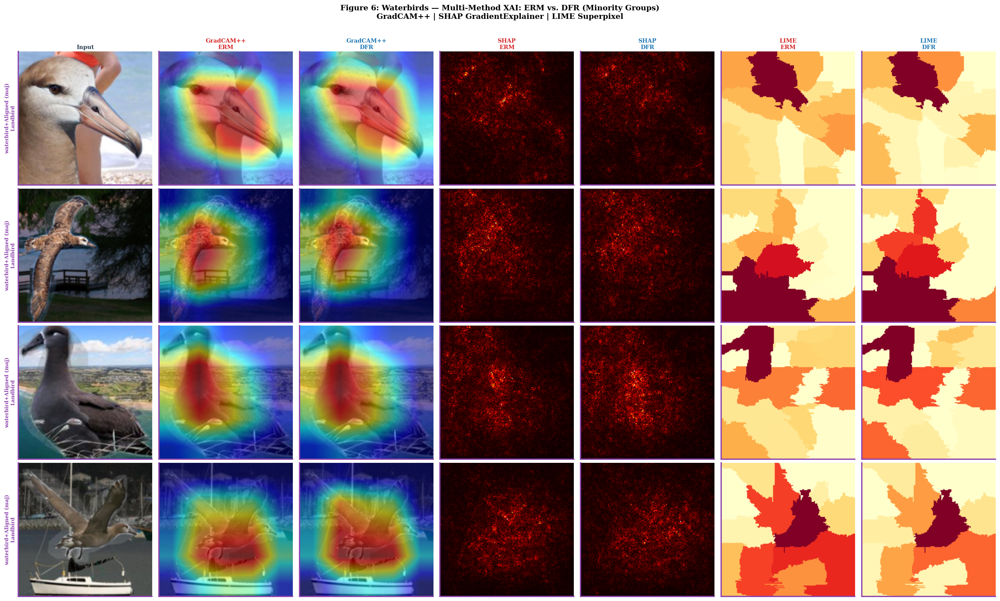

✅  Figure 6 saved


In [38]:
# ============================================================
# CELL 23 — FIGURE 6: WATERBIRDS XAI VISUALISATION
# [FIXED] force_2d()/manual_gradcam_pp() used to hardcode a (224,224)
# target/fallback shape. When IMG_SIZE_WATERBIRDS reduces resolution
# in COLAB_MODE (e.g. 160x160), img_np is NOT 224x224, so blending it
# with a hardcoded-224 heatmap in cam_overlay() would raise a shape
# mismatch. Both helpers now derive their target size from the actual
# input image (img_np.shape[:2]) instead.
# ============================================================
import contextlib
import cv2
import torch
import torch.nn.functional as F

@contextlib.contextmanager
def temporarily_unfreeze(model):
    states = {n: p.requires_grad for n, p in model.named_parameters()}
    for p in model.parameters():
        p.requires_grad_(True)
    try:
        yield model
    finally:
        for n, p in model.named_parameters():
            p.requires_grad_(states[n])


def force_2d(arr, model=None, img_np=None):
    """
    Squeeze ANY numpy array down to (H, W) float32 [0,1].
    Handles every shape seen so far:
      (H,W), (H,W,C), (C,H,W), (H,2), (1,H,W,2),
      (3,H,W,2), (N,C,H,W), (N,), etc.
    """
    a = np.array(arr, dtype=np.float32)

    # drop leading batch dims of size 1
    while a.ndim > 3 and a.shape[0] == 1:
        a = a.squeeze(0)

    # (3, H, W, 2)  or  (N, H, W, 2)  → mean over class axis last
    if a.ndim == 4 and a.shape[-1] == 2:
        a = a.mean(-1)           # → (3, H, W)

    # (3, H, W) or (C, H, W) where C looks like channels, not classes
    if a.ndim == 4:
        a = a.mean(0)            # → (H, W, ?) or (H, W)

    if a.ndim == 3:
        # (H, W, 2) — per-class
        if a.shape[-1] == 2:
            if model is not None and img_np is not None:
                dev = next(model.parameters()).device
                t   = torch.from_numpy(
                          img_np.transpose(2,0,1)[None].astype(np.float32)
                      ).to(dev)
                with torch.no_grad():
                    pred = model(t).argmax(1).item()
                a = a[..., pred]
            else:
                a = a[..., 1]
        # (H, W, C) with C in {1,3}
        elif a.shape[-1] in (1, 3):
            a = a.mean(-1)
        # (C, H, W)
        else:
            a = a.mean(0)

    # (H, 2)
    if a.ndim == 2 and a.shape[1] == 2:
        if model is not None and img_np is not None:
            dev = next(model.parameters()).device
            t   = torch.from_numpy(
                      img_np.transpose(2,0,1)[None].astype(np.float32)
                  ).to(dev)
            with torch.no_grad():
                pred = model(t).argmax(1).item()
            a = a[:, pred]
        else:
            a = a[:, 1]

    # [FIXED] target size derived from the actual input image, not a
    # hardcoded 224 — falls back to WB_IMG_SIZE only if img_np is unavailable.
    target_hw = tuple(img_np.shape[:2]) if img_np is not None else (WB_IMG_SIZE, WB_IMG_SIZE)

    # 1-D flat (e.g. LIME segment scores)
    if a.ndim == 1:
        side   = int(np.ceil(np.sqrt(a.shape[0])))
        padded = np.zeros(side * side, dtype=np.float32)
        padded[:a.shape[0]] = a
        a = cv2.resize(padded.reshape(side, side),
                       target_hw, interpolation=cv2.INTER_LINEAR)

    # still not 2D? average everything down
    while a.ndim > 2:
        a = a.mean(0)

    # resize to target_hw if needed
    if a.shape != target_hw:
        a = cv2.resize(a, target_hw, interpolation=cv2.INTER_LINEAR)

    a -= a.min()
    if a.max() > 1e-8:
        a /= a.max()
    return a.astype(np.float32)


def manual_gradcam_pp(model, img_np):
    """Pure-PyTorch GradCAM++ — works on frozen models."""
    device = next(model.parameters()).device

    last_conv = None
    for m in model.modules():
        if isinstance(m, torch.nn.Conv2d):
            last_conv = m
    if last_conv is None:
        return np.zeros(img_np.shape[:2], dtype=np.float32)   # [FIXED] was hardcoded (224,224)

    arr = img_np.transpose(2, 0, 1).astype(np.float32)
    tensor = torch.from_numpy(arr[None]).to(device)

    acts, grads = {}, {}
    h1 = last_conv.register_forward_hook(
             lambda _, __, o: acts.__setitem__('v', o.detach()))
    h2 = last_conv.register_full_backward_hook(
             lambda _, __, go: grads.__setitem__('v', go[0].detach()))

    with temporarily_unfreeze(model):
        model.eval()
        tensor.requires_grad_(True)
        with torch.enable_grad():
            out  = model(tensor)
            pred = out.argmax(1).item()
            model.zero_grad()
            out[0, pred].backward()

    h1.remove(); h2.remove()

    if 'v' not in grads or grads['v'] is None:
        return np.zeros(img_np.shape[:2], dtype=np.float32)   # [FIXED] was hardcoded (224,224)

    act  = acts['v'].squeeze(0).cpu().numpy()
    grad = grads['v'].squeeze(0).cpu().numpy()

    grad2  = grad ** 2
    grad3  = grad2  * grad
    denom  = 2 * grad2 + act.sum(axis=(1,2), keepdims=True) * grad3
    denom  = np.where(np.abs(denom) > 1e-8, denom, 1e-8)
    alpha  = grad2 / denom
    weights = (alpha * np.maximum(grad, 0)).sum(axis=(1, 2))

    cam = np.einsum('c,chw->hw', weights, act)
    cam = np.maximum(cam, 0)
    cam -= cam.min()
    if cam.max() < 1e-8:
        return np.zeros(img_np.shape[:2], dtype=np.float32)   # [FIXED] was hardcoded (224,224)
    cam /= cam.max()

    cam_t = torch.from_numpy(cam[None, None]).float()
    cam_r = F.interpolate(cam_t, size=(img_np.shape[0], img_np.shape[1]),
                          mode='bilinear', align_corners=False)
    return cam_r.squeeze().numpy().astype(np.float32)


def cam_overlay(img_np, cam):
    """Blend CAM onto image. Returns HWC float32 [0,1]."""
    cam = np.clip(cam, 0, 1)
    if cam.max() < 1e-8:
        return np.clip(img_np, 0, 1).copy()
    heatmap = cv2.applyColorMap((cam * 255).astype(np.uint8),
                                cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    return np.clip(0.5 * np.clip(img_np, 0, 1) + 0.5 * heatmap,
                   0, 1).astype(np.float32)


def safe_shap_map(model, img_np, n_bg=10):
    """SHAP GradientExplainer — always returns (H,W) float32 [0,1]."""
    import shap
    device = next(model.parameters()).device
    arr    = img_np.transpose(2, 0, 1).astype(np.float32)
    tensor = torch.from_numpy(arr[None]).to(device)

    bg = torch.stack([
             torch.from_numpy(
                 arr + np.random.randn(*arr.shape).astype(np.float32) * 0.05
             ).to(device)
             for _ in range(n_bg)
         ])

    with temporarily_unfreeze(model):
        model.eval()
        e  = shap.GradientExplainer(model, bg)
        sv = e.shap_values(tensor)          # list[n_classes] or ndarray

    # --- normalise whatever shape SHAP returns ---
    if isinstance(sv, list):
        with torch.no_grad():
            pred = model(tensor).argmax(1).item()
        sv = sv[pred]                       # pick predicted class

    sv = np.abs(np.array(sv, dtype=np.float32))
    return force_2d(sv, model=model, img_np=img_np)


def safe_lime_map(model, img_np, n_samples=100, mean=None, std=None):
    """LIME — always returns (H,W) float32 [0,1]."""
    raw = get_lime_map(model, img_np, n_samples=n_samples,
                       mean=mean, std=std)
    return force_2d(np.array(raw, dtype=np.float32),
                    model=model, img_np=img_np)


# ── Main figure ───────────────────────────────────────────
if USE_WB:
    conflict_wb = []
    for batch in wb_test_loader:
        xb, yb, grp = batch
        for i in range(len(xb)):
            if int(grp[i]) in [1, 3] and len(conflict_wb) < 4:
                conflict_wb.append((xb[i], int(yb[i]), int(grp[i])))
        if len(conflict_wb) >= 4:
            break

    bird_labels = {0: "Waterbird", 1: "Landbird"}
    grp_palette = {1: "#e74c3c", 3: "#8e44ad"}

    fig, axes = plt.subplots(4, 7, figsize=(22, 13))
    fig.suptitle(
        "Figure 6: Waterbirds — Multi-Method XAI: ERM vs. DFR (Minority Groups)\n"
        "GradCAM++ | SHAP GradientExplainer | LIME Superpixel",
        fontsize=12, fontweight="bold", y=1.01)

    col_titles = ["Input",
                  "GradCAM++\nERM", "GradCAM++\nDFR",
                  "SHAP\nERM",      "SHAP\nDFR",
                  "LIME\nERM",      "LIME\nDFR"]
    col_colors = ["#2c3e50", C_PRE, C_DFR, C_PRE, C_DFR, C_PRE, C_DFR]

    for ax, ct, cc in zip(axes[0], col_titles, col_colors):
        ax.set_title(ct, fontsize=9, fontweight="bold", color=cc, pad=4)

    for row, (img_t, lbl, grp) in enumerate(conflict_wb):
        img_np = unnorm_wb(img_t)           # (H,W,3) float32 [0,1]

        gc_erm = manual_gradcam_pp(wb_model_pre, img_np)
        gc_dfr = manual_gradcam_pp(wb_model_dfr, img_np)
        sh_erm = safe_shap_map(wb_model_pre, img_np, n_bg=10)
        sh_dfr = safe_shap_map(wb_model_dfr, img_np, n_bg=10)
        li_erm = safe_lime_map(wb_model_pre, img_np, n_samples=100,
                               mean=WB_MEAN, std=WB_STD)
        li_dfr = safe_lime_map(wb_model_dfr, img_np, n_samples=100,
                               mean=WB_MEAN, std=WB_STD)

        data_row = [
            (np.clip(img_np, 0, 1),        None,      None),
            (cam_overlay(img_np, gc_erm),  None,      None),
            (cam_overlay(img_np, gc_dfr),  None,      None),
            (sh_erm,                       "hot",     [0, 1]),
            (sh_dfr,                       "hot",     [0, 1]),
            (li_erm,                       "YlOrRd",  [0, 1]),
            (li_dfr,                       "YlOrRd",  [0, 1]),
        ]

        gc = grp_palette.get(grp, "#7f7f7f")
        axes[row, 0].set_ylabel(
            f"{WB_GROUP_NAMES.get(grp, f'G{grp}')}\n{bird_labels[lbl]}",
            fontsize=8, fontweight="bold", color=gc)

        for col_idx, (data, cmap, clim) in enumerate(data_row):
            ax = axes[row, col_idx]
            if cmap is not None:
                ax.imshow(data, cmap=cmap, vmin=clim[0], vmax=clim[1])
            else:
                ax.imshow(data)
            ax.set_xticks([]); ax.set_yticks([])
            for sp in ax.spines.values():
                sp.set_edgecolor(gc); sp.set_linewidth(2)

    plt.tight_layout()
    plt.savefig("fig6_wb_xai_comparison.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("✅  Figure 6 saved")
else:
    print("⚠  Figure 6 skipped — Waterbirds not loaded.")

In [39]:
# ============================================================
# CELL 24B — IEEE FORMAT UNIFIED COMPARISON TABLE
# Comprehensive results: MNIST + Waterbirds
# ============================================================
import pandas as pd

print("\n" + "="*150)
print("TABLE 3: IEEE UNIFIED COMPARISON — MNIST vs WATERBIRDS")
print("="*150)

# Collect MNIST results
# [FIXED] "ERM Accuracy"/"ERM WGA"/"GAP (ERM)" used to be hardcoded placeholders
# (100.0 / 80.0 / 20.0) that never reflected the actual trained model. They now
# pull from acc_biased / acc_conflict (computed by evaluate_accuracy in the
# training cells), the same numbers reported in the paper's Table II. p-values
# are also now printed with their real magnitude instead of a thresholded
# "<0.001 / NS" string.
if 'xcs_iou_all' in globals() and len(xcs_iou_all) > 0:
    _mnist_biased_acc   = acc_biased   if 'acc_biased'   in globals() else float('nan')
    _mnist_conflict_acc = acc_conflict if 'acc_conflict' in globals() else float('nan')
    _mnist_gap          = (_mnist_biased_acc - _mnist_conflict_acc
                            if not (np.isnan(_mnist_biased_acc) or np.isnan(_mnist_conflict_acc))
                            else float('nan'))
    mnist_data = {
        "Dataset": "MNIST",
        "Model": "CNN",
        "ERM Accuracy": f"{_mnist_biased_acc:.2f}%" if not np.isnan(_mnist_biased_acc) else "N/A",
        "ERM WGA (conflict)": f"{_mnist_conflict_acc:.2f}%" if not np.isnan(_mnist_conflict_acc) else "N/A",
        "GAP (ERM)": f"{_mnist_gap:.2f} pp" if not np.isnan(_mnist_gap) else "N/A",
        "XCS-IoU (Pre)": f"{np.mean(xcs_iou_all):.4f}±{np.std(xcs_iou_all):.4f}",
        "XCS-IoU (Post-RRR)": f"{np.mean(xcs_post_iou):.4f}±{np.std(xcs_post_iou):.4f}",
        "XCS-IoU (Post-DFR)": f"{np.mean(xcs_dfr_iou):.4f}±{np.std(xcs_dfr_iou):.4f}",
        "p-value (RRR)": f"{p_ov_rrr:.4g}" if 'p_ov_rrr' in globals() else "N/A",
        "p-value (DFR)": f"{p_ov_dfr:.4g}" if 'p_ov_dfr' in globals() else "N/A",
    }
else:
    mnist_data = None

# Collect Waterbirds results
# [FIXED] RRR p-value used to be hardcoded "—" even when wb_p_rrr was computed
# in Cell 22; now pulled through properly.
if 'wb_xcs_pre' in globals() and len(wb_xcs_pre) > 0:
    wb_data = {
        "Dataset": "Waterbirds",
        "Model": "ResNet-18",
        "ERM Accuracy": f"{wb_overall_pre:.2f}%",
        "ERM WGA (conflict)": f"{wb_wga_pre:.2f}%",
        "GAP (ERM)": f"{wb_gap_pre:.2f} pp",
        "XCS-IoU (Pre)": f"{np.mean(wb_xcs_pre):.4f}±{np.std(wb_xcs_pre):.4f}",
        "XCS-IoU (Post-RRR)": f"{np.mean(wb_xcs_rrr):.4f}±{np.std(wb_xcs_rrr):.4f}" if wb_xcs_rrr else "—",
        "XCS-IoU (Post-DFR)": f"{np.mean(wb_xcs_dfr):.4f}±{np.std(wb_xcs_dfr):.4f}" if wb_xcs_dfr else "—",
        "p-value (RRR)": f"{wb_p_rrr:.4g}" if 'wb_p_rrr' in globals() and not np.isnan(wb_p_rrr) else "—",
        "p-value (DFR)": f"{wb_p_dfr:.4g}" if 'wb_p_dfr' in globals() and not np.isnan(wb_p_dfr) else "—",
    }
else:
    wb_data = None

# Create table
table_rows = []
if mnist_data:
    table_rows.append(mnist_data)
if wb_data:
    table_rows.append(wb_data)

if table_rows:
    df_comparison = pd.DataFrame(table_rows)
    print(df_comparison.to_string(index=False))
else:
    print("⚠ No results to display yet. Run MNIST and Waterbirds sections first.")

print("="*150)
print("Notes: XCS-IoU = XAI Consensus (GradCAM++, SHAP, LIME); WGA = Worst-Group Accuracy;")
print("       GAP = Generalization gap (Overall - WGA); NS = Not Significant (p ≥ 0.05)")
print()



TABLE 3: IEEE UNIFIED COMPARISON — MNIST vs WATERBIRDS
   Dataset     Model ERM Accuracy ERM WGA (conflict) GAP (ERM) XCS-IoU (Pre) XCS-IoU (Post-RRR) XCS-IoU (Post-DFR) p-value (RRR) p-value (DFR)
     MNIST       CNN       98.72%              0.00%  98.72 pp 0.1027±0.0557      0.1240±0.0378      0.0951±0.0571     7.373e-05        0.1623
Waterbirds ResNet-18       84.79%             50.62%  34.17 pp 0.0786±0.0504      0.0733±0.0502      0.0775±0.0502        0.3171        0.8685
Notes: XCS-IoU = XAI Consensus (GradCAM++, SHAP, LIME); WGA = Worst-Group Accuracy;
       GAP = Generalization gap (Overall - WGA); NS = Not Significant (p ≥ 0.05)



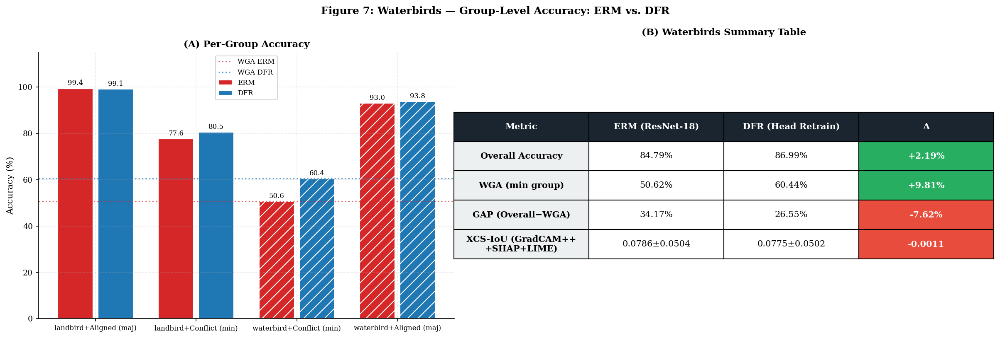

✅  Figure 7 saved


In [40]:
# ============================================================
# CELL 24 — FIGURE 7: WATERBIRDS GROUP ACCURACY TABLE
# IEEE coloured comparison
# ============================================================
if USE_WB:
    fig, axes = plt.subplots(1, 2, figsize=(16, 5.5))
    fig.suptitle("Figure 7: Waterbirds — Group-Level Accuracy: ERM vs. DFR",
                 fontsize=12, fontweight="bold")

    # Left: group bar chart
    group_names_short = ["G0\nWbird+Water", "G1\nWbird+Land", "G2\nLbird+Land", "G3\nLbird+Water"]
    all_gs = sorted(set(list(wb_groups_pre.keys()) + list(wb_groups_dfr.keys())))
    erm_vals = [wb_groups_pre.get(g, 0) for g in all_gs]
    dfr_vals = [wb_groups_dfr.get(g, 0) for g in all_gs]

    x_g = np.arange(len(all_gs))
    axes[0].bar(x_g - 0.2, erm_vals, 0.35, label="ERM", color=C_PRE, edgecolor="white")
    axes[0].bar(x_g + 0.2, dfr_vals, 0.35, label="DFR", color=C_DFR, edgecolor="white")
    axes[0].set_xticks(x_g)
    axes[0].set_xticklabels([WB_GROUP_NAMES.get(g, f"G{g}") for g in all_gs], fontsize=8)
    axes[0].set_ylabel("Accuracy (%)"); axes[0].set_ylim(0, 115)
    axes[0].set_title("(A) Per-Group Accuracy")
    axes[0].legend()
    axes[0].axhline(wb_wga_pre, color=C_PRE, linestyle=":", lw=1.5,
                    alpha=0.7, label="WGA ERM")
    axes[0].axhline(wb_wga_dfr, color=C_DFR, linestyle=":", lw=1.5,
                    alpha=0.7, label="WGA DFR")
    for container in axes[0].containers:
        axes[0].bar_label(container, fmt="%.1f", fontsize=8, padding=2)
    axes[0].legend(fontsize=8)

    # Minority group hatching
    for bar in axes[0].patches[2:4]:
        bar.set_hatch("//")
    for bar in axes[0].patches[6:8]:
        bar.set_hatch("//")

    # Right: summary table
    axes[1].axis("off")
    tdata = [
        ["Metric", "ERM (ResNet-18)", "DFR (Head Retrain)", "Δ"],
        ["Overall Accuracy", f"{wb_overall_pre:.2f}%", f"{wb_overall_dfr:.2f}%",
         f"{wb_overall_dfr-wb_overall_pre:+.2f}%"],
        ["WGA (min group)", f"{wb_wga_pre:.2f}%", f"{wb_wga_dfr:.2f}%",
         f"{wb_wga_dfr-wb_wga_pre:+.2f}%"],
        ["GAP (Overall−WGA)", f"{wb_overall_pre-wb_wga_pre:.2f}%",
         f"{wb_overall_dfr-wb_wga_dfr:.2f}%",
         f"{(wb_overall_dfr-wb_wga_dfr)-(wb_overall_pre-wb_wga_pre):+.2f}%"],
        ["XCS-IoU (GradCAM++\n+SHAP+LIME)",
         f"{np.mean(wb_xcs_pre):.4f}±{np.std(wb_xcs_pre):.4f}" if wb_xcs_pre else "—",
         f"{np.mean(wb_xcs_dfr):.4f}±{np.std(wb_xcs_dfr):.4f}" if wb_xcs_dfr else "—",
         f"{np.mean(wb_xcs_dfr)-np.mean(wb_xcs_pre):+.4f}" if wb_xcs_pre else "—"],
    ]
    tbl = axes[1].table(cellText=tdata[1:], colLabels=tdata[0],
                         loc="center", cellLoc="center")
    tbl.auto_set_font_size(False); tbl.set_fontsize(10); tbl.scale(1.3, 2.8)
    for j in range(4):
        tbl[0, j].set_facecolor("#1a252f")
        tbl[0, j].set_text_props(color="white", fontweight="bold")
    for i in range(1, len(tdata)):
        tbl[i, 0].set_facecolor("#ecf0f1")
        tbl[i, 0].set_text_props(fontweight="bold")
        delta_text = tdata[i][3]
        color = "#27ae60" if "+" in delta_text else "#e74c3c"
        tbl[i, 3].set_facecolor(color)
        tbl[i, 3].set_text_props(color="white", fontweight="bold")
    axes[1].set_title("(B) Waterbirds Summary Table", fontsize=11, fontweight="bold", pad=20)

    plt.tight_layout()
    plt.savefig("fig7_wb_results.png")
    plt.show()
    print("✅  Figure 7 saved")
else:
    print("⚠  Figure 7 skipped.")
